<a href="https://colab.research.google.com/github/nakatoconstance/nakatoconstance/blob/main/AMAX_SARIMA_MODELS_SUMISSION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from datetime import datetime
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
%matplotlib inline
from matplotlib.pylab import rcParams

from statsmodels.tsa.stattools import adfuller
!pip install pmdarima --quiet
import pmdarima as pm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 32.0 MB/s eta 0:00:00


In [3]:
import sys
import itertools
import pandas as pd
import numpy as np
import seaborn as sns
import statsmodels.api as sm
import statsmodels.tsa.api as smt
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
%matplotlib inline


In [4]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error

# Load the data
from google.colab import files
uploaded = files.upload()


Saving MUST-PES Master data.csv to MUST-PES Master data.csv


In [5]:
data = pd.read_csv("MUST-PES Master data.csv", encoding='latin-1')
data.head()

<ipython-input-5-bed5efb37b35>:1: DtypeWarning: Columns (1,2,3,4,8,9,10,12,13,14,16,22,23,26,27,28,29,30,31) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("MUST-PES Master data.csv", encoding='latin-1')


,Organism,Sex,Age,Region,Department,Specimen date,year,Specimen type,Amikacin,Amoxilin,...,Trimethoprim,Vancomycin,Penicillin,Imipenem,Ceftadizime,Cefotaxime,Cefoxitin,Linezolid,Pefloxacin,NOR
0,Citrobacter freundii,F,20,western,NaN,24/09/2002,6.0,Pus swab,NaN,NaN,...,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Citrobacter sp,f,25.00,Western,sur,10/05/2022,26.0,wound swab,NaN,NaN,...,S,NaN,NaN,R,R,R,S,NaN,R,NaN
2,Citrobacter sp,m,18.00,Western,sur,15/12/2021,25.0,wd,NaN,R,...,NaN,NaN,R,NaN,NaN,NaN,R,NaN,NaN,R
3,C. perfringens,F,2,western,NaN,20/07/2009,13.0,Blood culture,NaN,NaN,...,NaN,NaN,S,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Escherichia coli,m,69.00,Western,icu,09/05/2022,26.0,urine,NaN,NaN,...,NaN,NaN,NaN,NaN,R,R,S,R,R,NaN


In [6]:
#removing missing organism rows
data.dropna(subset=['Organism'], inplace=True)


In [7]:
#checking whether missing organisms still exist
non_string_organisms = data[data['Organism'].apply(type) != str]['Organism']
print(non_string_organisms)

Series([], Name: Organism, dtype: object)


In [8]:
data['Organism'] = data['Organism'].str.strip()
#print(data['Organism'])


In [9]:
#print unique organisms
unique_organisms = data['Organism'].unique()
print(unique_organisms)



['Citrobacter freundii' 'Citrobacter sp' 'C. perfringens'
 'Escherichia coli' 'Ent. cloaca' 'Enterococcus faecalis'
 'Haemophilus influenzae' 'Klebsiella pneumoniae' 'Klebsiella spp'
 'morganella' 'N. gonorrhoeae' 'N. meningiditis' 'Pseudomonas aeruginosa'
 'Proteus' 'Psudomonas' 'Staphylococcus aureus' 'S. epidermides'
 'S. flexneri' 'Streptococcus pneumoniae' 'S. pyogens' 'Salmonella typhi'
 'Un identified coliform' 'V. cholerae' 'Acinetobacter baumannii'
 'Acinetobacter sp.' 'Acetobacterium sp.'
 'Acinetobacter calcoaceticus var. lwoffii'
 'Streptococcus, beta-haem. Group B' 'Campylobacter coli'
 'Enterobacter aerogenes' 'Enterobacter cloacae' 'Enterococcus faecium'
 'Enterococcus sp' 'Klebsiella sp' 'M. morganii' 'Proteus mirabilis'
 'Providencia sp..' 'Pseudomonas sp.' 'Proteus Vulgaris' 'Salmonella sp.'
 'S. saprophyticus' 'Coagulase negative Staphylococcus' 'S. Enteritidis'
 'S. epidermidis' 'S. dysenteriae' 'S.boydii' 'Shigella sp.'
 'S. marcescens' 'Salmonella, non-Typhi' 'Str

In [10]:
data['Organism'] = data['Organism'].replace({
    # Previous replacements
    'Citrobacter sp': 'Citrobacter species',
    'C. perfringens': 'Clostridium perfringens',
    'Ent. cloaca': 'Enterobacter cloacae',
    'Klebsiella spp': 'Klebsiella species',
    'morganella': 'Morganella morganii',
    'N. gonorrhoeae': 'Neisseria gonorrhoeae',
    'N. meningitidis': 'Neisseria meningitidis',
    'Psudomonas': 'Pseudomonas',
    'S. epidermidis': 'Staphylococcus epidermidis',
    'S. flexneri': 'Shigella flexneri',
    'Streptococcus pn': 'Streptococcus pneumoniae',
    'S. pyogens': 'Streptococcus pyogenes',
    'Un ': 'Unknown',
    'bsc': 'Bacillus species',
    'cfr': 'Clostridium perfringens',
    'eco': 'Escherichia coli',
    'efa': 'Enterococcus faecalis',
    'ent': 'Enterobacter species',
    'gnr': 'Gram-negative rods',
    'gpc': 'Gram-positive cocci',
    'kpn': 'Klebsiella pneumoniae',
    'lmo': 'Listeria monocytogenes',
    'mor': 'Morganella morganii',
    'ngo': 'Neisseria gonorrhoeae',
    'nor': 'Neisseria meningitidis',
    'pae': 'Pseudomonas aeruginosa',
    'pmi': 'Proteus mirabilis',
    'prv': 'Providencia species',
    'pvu': 'Proteus vulgaris',
    'sap': 'Staphylococcus aureus',
    'sat': 'Salmonella typhi',
    'scn': 'Staphylococcus epidermidis',
    'shi': 'Shigella species',
    'sma': 'Streptococcus pneumoniae',
    'spy': 'Streptococcus pyogenes',
    'str': 'Streptococcus species',
    'svi': 'Streptococcus viridans',
    'vag': 'Vaginal bacteria',
    'xsg': 'Staphylococcus',
    # New replacements
    'ac-': 'Acinetobacter species',
    'aca': 'Acinetobacter calcoaceticus',
    'anb': 'Anaerobic bacteria',
    'apr': 'Aerobic spore bearer',
    'bab': 'Bacteroides species',
    'bcs': 'Bacillus species (or Bacillus cereus)',
    'br-': 'Bacteroides species',
    'cai':'Candida albicans',
    'cal': 'Campylobacter coli',
    'cgt': 'Citrobacter freundii',
    'ci-': 'Citrobacter species',
    'cor': 'Corynebacterium species',
    'eae': 'Enteroaggregative Escherichia coli',
    'ecl': 'Enterobacter cloacae',
    'en-': 'Enterobacter species',
    'gvc': 'Gram-variable cocci',
    'kl-': 'Klebsiella species',
    'kox': 'Klebsiella oxytoca',
    'mic': 'Micrococcus species',
    'mmo': 'Moraxella catarrhalis',
    'ne-': 'Neisseria species',
    'nsg': 'Nocardia species',
    'pfl': 'Prevotella fragilis',
    'pr-': 'Proteus species',
    'ps-': 'Pseudomonas species',
    'rsv': 'Respiratory syncytial virus',
    'sc+': 'Staphylococcus aureus',
    'sgc': 'Streptococcus agalactiae',
    'sro': 'Streptococcus oralis',
    'vip': 'Vibrio species',
    'xsa': 'Xanthomonas species',
    'can': 'Candida albicans',
    'cne': 'Cryptococcus neoformans',
    'con': 'Coagulase-negative Staphylococcus',
    'cry': 'Cryptococcus neoformans',
    'cryptococcus neoformans': 'Cryptococcus neoformans',
    'eci': 'Escherichia coli',
    'gnc': 'Gram-negative cocci',
    'gpr': 'Gram-positive rods',
    'koz': 'Klebsiella pneumoniae',
    'lac': 'Lactobacillus species',
    'mix': 'Mixed bacteria',
    'ncb': 'Non-capsulated bacteria',
    'nfo': 'Non-fermenting organisms',
    'ora': 'Oral bacteria',
    'psh': 'Pseudomonas species',
    'sal': 'Salmonella species',
    'sau': 'Staphylococcus aureus',
    'sep': 'Staphylococcus epidermidis',
    'spn': 'Streptococcus pneumoniae',
    'spv': 'Staphylococcus saprophyticus',
    'sta': 'Staphylococcus species',
    'sxg': 'Staphylococcus xylosus',
    'yea': 'Yeast',
})
#Dealing with species
data['Organism'] = data['Organism'].str.replace(r'(sp,|sp\.|species)\b', 'sp', regex=True, case=False)


In [11]:
# Filter the DataFrame to exclude the unwanted organisms
data = data[~data['Organism'].isin(['xxx', 'yxa', 'Un '])]

In [13]:
#print unique organisms
unique_organisms = data['Organism'].unique()
unique_organisms.sort()
print(unique_organisms)

['Acetobacterium sp.' 'Acinetobacter baumannii'
 'Acinetobacter calcoaceticus' 'Acinetobacter calcoaceticus var. lwoffii'
 'Acinetobacter sp' 'Acinetobacter sp.' 'Aerobic spore bearer'
 'Anaerobic bacteria' 'B. fragilis' 'Bacillus sp'
 'Bacillus sp (or Bacillus cereus)' 'Bacteroides sp' 'Campylobacter coli'
 'Candida Albicans' 'Candida albicans' 'Citrobacter freundii'
 'Citrobacter sp' 'Clostridium perfringens'
 'Coagulase negative Staphylococcus' 'Coagulase-negative Staphylococcus'
 'Corynebacterium sp' 'Cryptococcus neoformans' 'E. cloaca' 'E. faecalis'
 'Enteroaggregative Escherichia coli' 'Enterobacter'
 'Enterobacter aerogenes' 'Enterobacter cloacae' 'Enterobacter sp'
 'Enterobacter spp' 'Enterobacteriacae' 'Enterococcus'
 'Enterococcus faecalis' 'Enterococcus faecium' 'Enterococcus sp'
 'Enterococcus spp' 'Entrobacter sp' 'Escherichia coli'
 'Gram negative bacilli' 'Gram negative bacteria' 'Gram negative rods'
 'Gram positive cocci' 'Gram-negative cocci' 'Gram-negative rods'
 'Gr

In [14]:
#check for missing dates
missing_dates_count = data['Specimen date'].isnull().sum()
print("Number of missing dates:", missing_dates_count)

Number of missing dates: 44


In [15]:
#Drop missing dates
data.dropna(subset=['Specimen date'], inplace=True)

In [16]:
# Select columns 8 to 31
columns_to_encode = data.columns[8:32]

# One-hot encode, handling only I, R, and S
data_encoded = pd.DataFrame()
for col in columns_to_encode:
    temp_df = pd.get_dummies(data[col], prefix=col)  # Encode all values
    value_mapping = {'I': col + '_I', 'R': col + '_R', 'S': col + '_S'}
    desired_columns = [value_mapping[val] for val in value_mapping if value_mapping[val] in temp_df.columns]
    if desired_columns:
        temp_df = temp_df[desired_columns]
        data_encoded = pd.concat([data_encoded, temp_df], axis=1)

# Concatenate encoded columns with original DataFrame
data = pd.concat([data, data_encoded], axis=1)

# Change datatype of encoded columns to int and impute missing values
encoded_column_names = data_encoded.columns.tolist()
data[encoded_column_names] = data[encoded_column_names].fillna(0).astype(int)  # Fill NaN first

print(encoded_column_names)  # Display the encoded column names

['Amikacin_I', 'Amikacin_R', 'Amikacin_S', 'Amoxilin_I', 'Amoxilin_R', 'Amoxilin_S', 'Amixilin-Clavulate_I', 'Amixilin-Clavulate_R', 'Amixilin-Clavulate_S', 'Ampicillin_I', 'Ampicillin_R', 'Ampicillin_S', 'Azithromycin_I', 'Azithromycin_R', 'Azithromycin_S', 'Ceftriaxone_I', 'Ceftriaxone_R', 'Ceftriaxone_S', 'Cefuroxime_I', 'Cefuroxime_R', 'Cefuroxime_S', 'Ciprofloxacin_I', 'Ciprofloxacin_R', 'Ciprofloxacin_S', 'Oxacillin_I', 'Oxacillin_R', 'Oxacillin_S', 'Chloramphenicol_I', 'Chloramphenicol_R', 'Chloramphenicol_S', 'Clindamycin_I', 'Clindamycin_R', 'Clindamycin_S', 'Gentamycin_I', 'Gentamycin_R', 'Gentamycin_S', 'Erythromycin_I', 'Erythromycin_R', 'Erythromycin_S', 'Tetracycline_I', 'Tetracycline_R', 'Tetracycline_S', 'Trimethoprim_I', 'Trimethoprim_R', 'Trimethoprim_S', 'Vancomycin_I', 'Vancomycin_R', 'Vancomycin_S', 'Penicillin_I', 'Penicillin_R', 'Penicillin_S', 'Imipenem_I', 'Imipenem_R', 'Imipenem_S', 'Ceftadizime_I', 'Ceftadizime_R', 'Ceftadizime_S', 'Cefotaxime_I', 'Cefotaxime

In [17]:
#droping original columns
# Assuming 'columns_to_encode' contains the names of original columns you encoded:
data = data.drop(columns=columns_to_encode)

In [18]:
# Check for NaN values in encoded columns
nan_values = data[encoded_column_names].isna().sum()
print(nan_values)

Amikacin_I      0
Amikacin_R      0
Amikacin_S      0
Amoxilin_I      0
Amoxilin_R      0
               ..
Pefloxacin_R    0
Pefloxacin_S    0
NOR_I           0
NOR_R           0
NOR_S           0
Length: 70, dtype: int64


In [19]:
print(data[encoded_column_names].head(10))  # Check the first 10 rows of encoded columns
#print(data.info())  # Get summary information about the DataFrame

   Amikacin_I  Amikacin_R  Amikacin_S  Amoxilin_I  Amoxilin_R  Amoxilin_S  \
0           0           0           0           0           0           0   
1           0           0           0           0           0           0   
2           0           0           0           0           1           0   
3           0           0           0           0           0           0   
4           0           0           0           0           0           0   
5           0           0           0           0           1           0   
6           0           0           0           0           1           0   
7           0           0           0           0           0           0   
8           0           0           0           0           0           1   
9           0           0           0           0           0           1   

   Amixilin-Clavulate_I  Amixilin-Clavulate_R  Amixilin-Clavulate_S  \
0                     0                     0                     0   
1         

In [20]:
for col in encoded_column_names:
    if col.endswith('_R'):  # Check if the column represents 'R' values
        count_r = data[col].sum()
        print(f"Antibiotic: {col[:-2]}, Count of R: {count_r}")

Antibiotic: Amikacin, Count of R: 6
Antibiotic: Amoxilin, Count of R: 22
Antibiotic: Amixilin-Clavulate, Count of R: 335
Antibiotic: Ampicillin, Count of R: 3979
Antibiotic: Azithromycin, Count of R: 101
Antibiotic: Ceftriaxone, Count of R: 878
Antibiotic: Cefuroxime, Count of R: 565
Antibiotic: Ciprofloxacin, Count of R: 2449
Antibiotic: Oxacillin, Count of R: 281
Antibiotic: Chloramphenicol, Count of R: 2855
Antibiotic: Clindamycin, Count of R: 521
Antibiotic: Gentamycin, Count of R: 1784
Antibiotic: Erythromycin, Count of R: 2392
Antibiotic: Tetracycline, Count of R: 2942
Antibiotic: Trimethoprim, Count of R: 2829
Antibiotic: Vancomycin, Count of R: 174
Antibiotic: Penicillin, Count of R: 2135
Antibiotic: Imipenem, Count of R: 316
Antibiotic: Ceftadizime, Count of R: 257
Antibiotic: Cefotaxime, Count of R: 232
Antibiotic: Cefoxitin, Count of R: 39
Antibiotic: Linezolid, Count of R: 52
Antibiotic: Pefloxacin, Count of R: 333
Antibiotic: NOR, Count of R: 78


In [21]:
# Get the unique organisms and their count
unique_organisms = data['Organism'].value_counts()

# Print the result
print(unique_organisms)

Organism
Staphylococcus aureus    6325
Escherichia coli         2131
Citrobacter freundii      445
Candida albicans          425
Klebsiella pneumoniae     421
                         ... 
Pseudomonas spp             1
Gram positive cocci         1
Gram negative bacilli       1
P. aerogenes                1
Vibrio sp                   1
Name: count, Length: 137, dtype: int64


In [22]:
#setting the Timeseries
data['Specimen date'] = pd.to_datetime(data['Specimen date'])
data.set_index('Specimen date', inplace=True)

<ipython-input-22-83803a6b88c5>:2: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  data['Specimen date'] = pd.to_datetime(data['Specimen date'])


In [23]:
min_date = data.index.min()
max_date = data.index.max()

print("Minimum Date:", min_date)
print("Maximum Date:", max_date)

Minimum Date: 1996-03-17 00:00:00
Maximum Date: 2024-12-07 00:00:00


In [24]:
#Setting to quarterly frequency
quarterly_data = data.resample('QE').sum()

In [25]:
# Calculate resistance rates
organism_antibiotic_rates = []
for organism in data['Organism'].unique():
    organism_data = data[data['Organism'] == organism]
    quarterly_organism_data = organism_data.resample('QE').sum()
    for col in quarterly_organism_data.columns:
        if col.endswith('_R'):
            for quarter, r_count in zip(quarterly_organism_data.index, quarterly_organism_data[col]):
                total_count = 0  # Initialize total count for this quarter
                for suffix in ['_R', '_I', '_S']:
                    total_column = col[:-2] + suffix
                    if total_column in quarterly_organism_data.columns:
                        total_count += quarterly_organism_data.loc[quarter, total_column]
                if total_count > 0:
                    #resistance_rate = (r_count / total_count) * 100
                    resistance_rate = (r_count / total_count)
                else:
                    resistance_rate = 0  # Handle cases with no isolates
                organism_antibiotic_rates.append({
                    'Organism': organism,
                    'Antibiotic': col[:-2],
                    'Quarter': quarter.to_period('Q'),
                    'Resistance_Rate': resistance_rate
                })

rate_df = pd.DataFrame(organism_antibiotic_rates)
print(rate_df)

                   Organism  Antibiotic Quarter  Resistance_Rate
0      Citrobacter freundii    Amikacin  2002Q3              0.0
1      Citrobacter freundii    Amikacin  2002Q4              0.0
2      Citrobacter freundii    Amikacin  2003Q1              0.0
3      Citrobacter freundii    Amikacin  2003Q2              0.0
4      Citrobacter freundii    Amikacin  2003Q3              0.0
...                     ...         ...     ...              ...
75643             Vibrio sp  Cefotaxime  2021Q3              0.0
75644             Vibrio sp   Cefoxitin  2021Q3              0.0
75645             Vibrio sp   Linezolid  2021Q3              0.0
75646             Vibrio sp  Pefloxacin  2021Q3              0.0
75647             Vibrio sp         NOR  2021Q3              0.0

[75648 rows x 4 columns]


In [26]:
# Calculate the 1st quartile (Q1) and 3rd quartile (Q3)
Q1 = rate_df['Resistance_Rate'].quantile(0.25)
Q3 = rate_df['Resistance_Rate'].quantile(0.75)

# Calculate the Interquartile Range (IQR)
IQR = Q3 - Q1

# Define the lower and upper bounds for identifying outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers: Values below the lower bound or above the upper bound
outliers = rate_df[(rate_df['Resistance_Rate'] < lower_bound) | (rate_df['Resistance_Rate'] > upper_bound)]

print("Outliers based on IQR method:")
print(outliers)


Outliers based on IQR method:
                   Organism          Antibiotic Quarter  Resistance_Rate
72     Citrobacter freundii            Amikacin  2020Q3         1.000000
232    Citrobacter freundii  Amixilin-Clavulate  2018Q3         1.000000
236    Citrobacter freundii  Amixilin-Clavulate  2019Q3         0.250000
239    Citrobacter freundii  Amixilin-Clavulate  2020Q2         0.500000
240    Citrobacter freundii  Amixilin-Clavulate  2020Q3         0.666667
...                     ...                 ...     ...              ...
75485    Corynebacterium sp          Gentamycin  2019Q3         1.000000
75498    Corynebacterium sp        Erythromycin  2021Q1         1.000000
75505    Corynebacterium sp        Tetracycline  2021Q1         1.000000
75612   Gram-variable cocci        Erythromycin  2021Q1         1.000000
75627             Vibrio sp          Ampicillin  2021Q3         1.000000

[4914 rows x 4 columns]


In [27]:
#Checking organisms and antibiotics with higest overall resistance rates
# Calculate overall total resistance rate
overall_total_resistance = rate_df.groupby(['Organism', 'Antibiotic'])['Resistance_Rate'].sum().reset_index()

# Sort and get the top ten
top_ten_organisms = overall_total_resistance.sort_values('Resistance_Rate', ascending=False).head(10)
print(top_ten_organisms)

                    Organism       Antibiotic  Resistance_Rate
2547   Staphylococcus aureus       Ampicillin        72.828422
2566   Staphylococcus aureus     Trimethoprim        70.872084
2564   Staphylococcus aureus       Penicillin        65.180250
891         Escherichia coli       Ampicillin        56.663703
2565   Staphylococcus aureus     Tetracycline        56.475779
2557   Staphylococcus aureus     Erythromycin        53.237399
2554   Staphylococcus aureus  Chloramphenicol        50.270969
910         Escherichia coli     Trimethoprim        49.177648
3046  Un identified coliform     Trimethoprim        41.155424
3027  Un identified coliform       Ampicillin        40.199436


In [28]:
# Calculate total resistance per organism across all antibiotics and quarters
organism_total_resistance = overall_total_resistance.groupby('Organism')['Resistance_Rate'].sum().reset_index()

# Sort and get the top ten organisms
top_ten_organisms = organism_total_resistance.sort_values('Resistance_Rate', ascending=False).head(10)
print(top_ten_organisms)

                     Organism  Resistance_Rate
106     Staphylococcus aureus       572.670627
37           Escherichia coli       386.228209
50      Klebsiella pneumoniae       189.466225
117  Streptococcus pneumoniae       187.922347
126    Un identified coliform       172.326483
15       Citrobacter freundii       139.066408
51              Klebsiella sp       117.293035
73          Proteus mirabilis        88.183333
48                 Klebsiella        86.253675
83     Pseudomonas aeruginosa        83.735456


In [29]:
# ... (your existing code for calculating organism_antibiotic_rates)

# Create a DataFrame from the list
rate_df = pd.DataFrame(organism_antibiotic_rates)

# Calculate total resistance per organism
organism_total_resistance = rate_df.groupby('Organism')['Resistance_Rate'].sum().reset_index()

# Sort and get the top four organisms
top_four_organisms = organism_total_resistance.sort_values('Resistance_Rate', ascending=False).head(4)

print(top_four_organisms)

                     Organism  Resistance_Rate
106     Staphylococcus aureus       572.670627
37           Escherichia coli       386.228209
50      Klebsiella pneumoniae       189.466225
117  Streptococcus pneumoniae       187.922347


In [30]:
# ... (previous code)

# Sort and get the top FOUR organisms
top_four_organisms = organism_total_resistance.sort_values('Resistance_Rate', ascending=False).head(4)

# Print the top four
print(top_four_organisms)

                     Organism  Resistance_Rate
106     Staphylococcus aureus       572.670627
37           Escherichia coli       386.228209
50      Klebsiella pneumoniae       189.466225
117  Streptococcus pneumoniae       187.922347


In [31]:
#Let us first take the top 1
# Assuming your DataFrame is named 'rate_df'

# Calculate overall total resistance rate
overall_total_resistance = rate_df.groupby(['Organism', 'Antibiotic'])['Resistance_Rate'].sum().reset_index()

# Sort and get the top four organisms
#we are trying best two we shall do the rest after
top_four_organisms = overall_total_resistance.groupby('Organism')['Resistance_Rate'].sum().reset_index().sort_values('Resistance_Rate', ascending=False).head(2)#we share change to top 2,or 4

# Create a dictionary to store time series
time_series_dict = {}

# Iterate over top four organisms and create time series for each antibiotic
#we are trying best two we shall do the rest after
for organism in top_four_organisms['Organism']:
    time_series_dict[organism] = {}
    organism_data = rate_df[rate_df['Organism'] == organism]
    for antibiotic in organism_data['Antibiotic'].unique():
        subset = organism_data[(organism_data['Antibiotic'] == antibiotic)]
        time_series = subset.set_index('Quarter')['Resistance_Rate']
        time_series_dict[organism][antibiotic] = time_series

# Print the time series
for organism, antibiotic_data in time_series_dict.items():
    for antibiotic, time_series in antibiotic_data.items():
        print(f"Time Series for {organism} - {antibiotic}:")
        print(time_series, '\n')

Time Series for Staphylococcus aureus - Amikacin:
Quarter
1996Q1    0.0
1996Q2    0.0
1996Q3    0.0
1996Q4    0.0
1997Q1    0.0
         ... 
2023Q4    0.0
2024Q1    0.0
2024Q2    0.0
2024Q3    0.0
2024Q4    0.0
Freq: Q-DEC, Name: Resistance_Rate, Length: 116, dtype: float64 

Time Series for Staphylococcus aureus - Amoxilin:
Quarter
1996Q1    0.0
1996Q2    0.0
1996Q3    0.0
1996Q4    0.0
1997Q1    0.0
         ... 
2023Q4    0.0
2024Q1    0.0
2024Q2    0.0
2024Q3    0.0
2024Q4    0.0
Freq: Q-DEC, Name: Resistance_Rate, Length: 116, dtype: float64 

Time Series for Staphylococcus aureus - Amixilin-Clavulate:
Quarter
1996Q1    0.0
1996Q2    0.0
1996Q3    0.0
1996Q4    0.0
1997Q1    0.0
         ... 
2023Q4    0.0
2024Q1    0.0
2024Q2    0.0
2024Q3    0.0
2024Q4    0.0
Freq: Q-DEC, Name: Resistance_Rate, Length: 116, dtype: float64 

Time Series for Staphylococcus aureus - Ampicillin:
Quarter
1996Q1    1.0
1996Q2    0.0
1996Q3    1.0
1996Q4    1.0
1997Q1    1.0
         ... 
2023Q4    0.

In [32]:
# Print summary statistics for each organism-antibiotic time series
for organism, antibiotic_data in time_series_dict.items():
    for antibiotic, time_series in antibiotic_data.items():
        print(f"Summary Statistics for {organism} - {antibiotic}:")
        print(time_series.describe(), '\n')

Summary Statistics for Staphylococcus aureus - Amikacin:
count    116.000000
mean       0.007184
std        0.055570
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.500000
Name: Resistance_Rate, dtype: float64 

Summary Statistics for Staphylococcus aureus - Amoxilin:
count    116.000000
mean       0.027586
std        0.160210
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        1.000000
Name: Resistance_Rate, dtype: float64 

Summary Statistics for Staphylococcus aureus - Amixilin-Clavulate:
count    116.000000
mean       0.098464
std        0.246660
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        1.000000
Name: Resistance_Rate, dtype: float64 

Summary Statistics for Staphylococcus aureus - Ampicillin:
count    116.000000
mean       0.627831
std        0.378055
min        0.000000
25%        0.379386
50%        0.777778
75%        0.923564
max        1.000000


In [33]:
# Display and remove time series with all zero values
for organism, antibiotic_data in time_series_dict.items():
    for antibiotic, time_series in list(antibiotic_data.items()):  # Iterate over a copy
        if (time_series == 0).all():
            print(f"Removing time series for {organism} - {antibiotic} due to all zero values.")
            del antibiotic_data[antibiotic]  # Remove the time series
        else:
            print(f"Time Series for {organism} - {antibiotic}:")
            print(time_series, '\n')

# Proceed with plotting or other analysis using the filtered time_series_dict

Time Series for Staphylococcus aureus - Amikacin:
Quarter
1996Q1    0.0
1996Q2    0.0
1996Q3    0.0
1996Q4    0.0
1997Q1    0.0
         ... 
2023Q4    0.0
2024Q1    0.0
2024Q2    0.0
2024Q3    0.0
2024Q4    0.0
Freq: Q-DEC, Name: Resistance_Rate, Length: 116, dtype: float64 

Time Series for Staphylococcus aureus - Amoxilin:
Quarter
1996Q1    0.0
1996Q2    0.0
1996Q3    0.0
1996Q4    0.0
1997Q1    0.0
         ... 
2023Q4    0.0
2024Q1    0.0
2024Q2    0.0
2024Q3    0.0
2024Q4    0.0
Freq: Q-DEC, Name: Resistance_Rate, Length: 116, dtype: float64 

Time Series for Staphylococcus aureus - Amixilin-Clavulate:
Quarter
1996Q1    0.0
1996Q2    0.0
1996Q3    0.0
1996Q4    0.0
1997Q1    0.0
         ... 
2023Q4    0.0
2024Q1    0.0
2024Q2    0.0
2024Q3    0.0
2024Q4    0.0
Freq: Q-DEC, Name: Resistance_Rate, Length: 116, dtype: float64 

Time Series for Staphylococcus aureus - Ampicillin:
Quarter
1996Q1    1.0
1996Q2    0.0
1996Q3    1.0
1996Q4    1.0
1997Q1    1.0
         ... 
2023Q4    0.

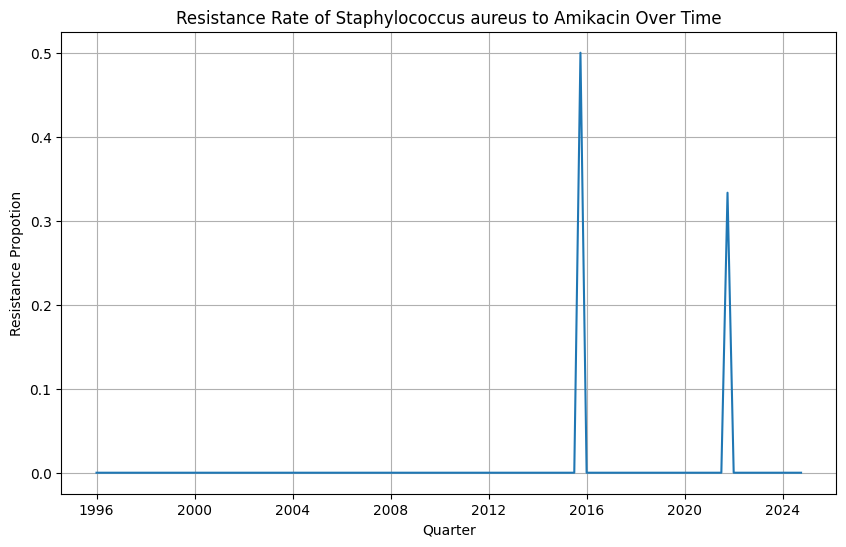

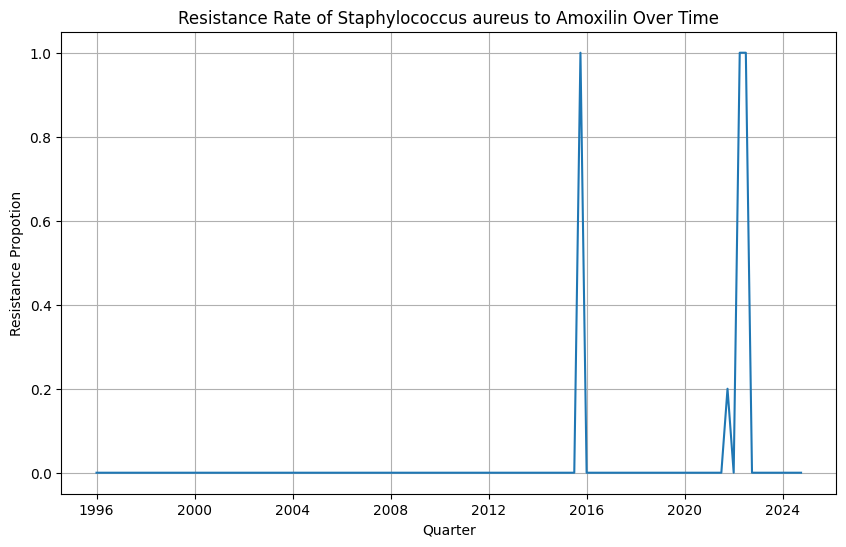

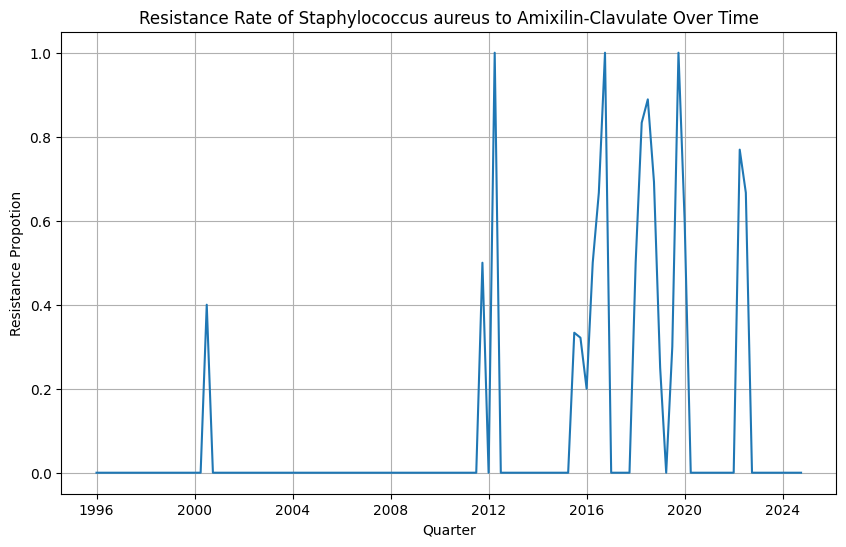

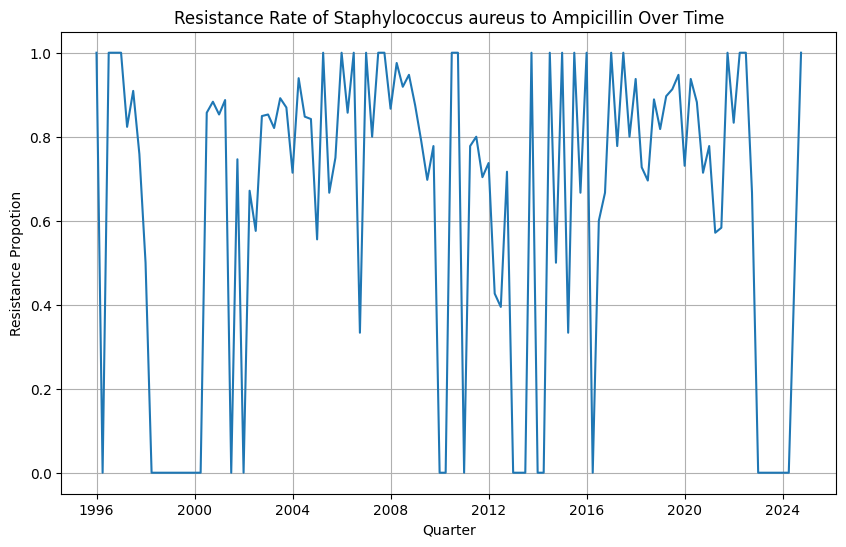

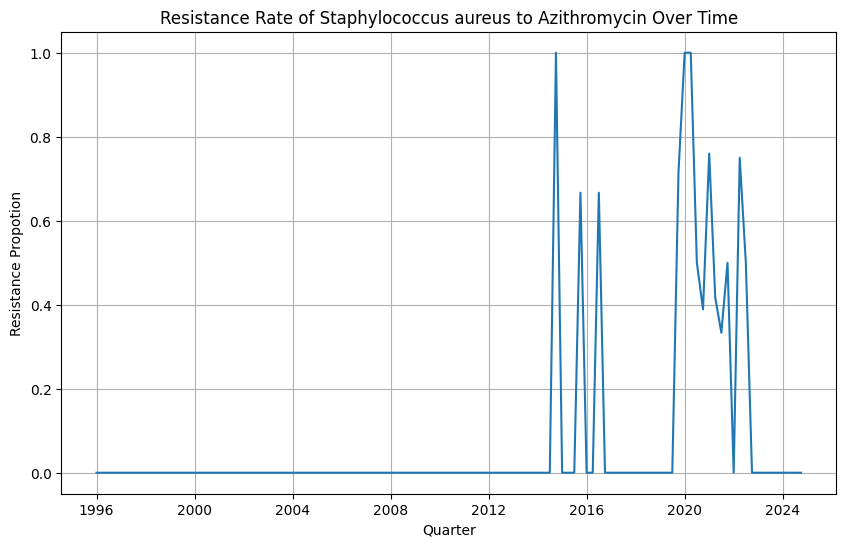

...

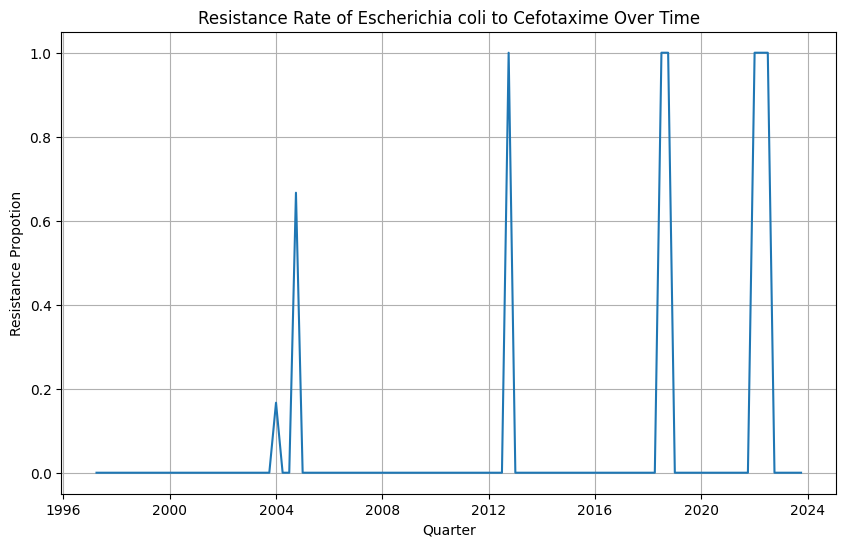

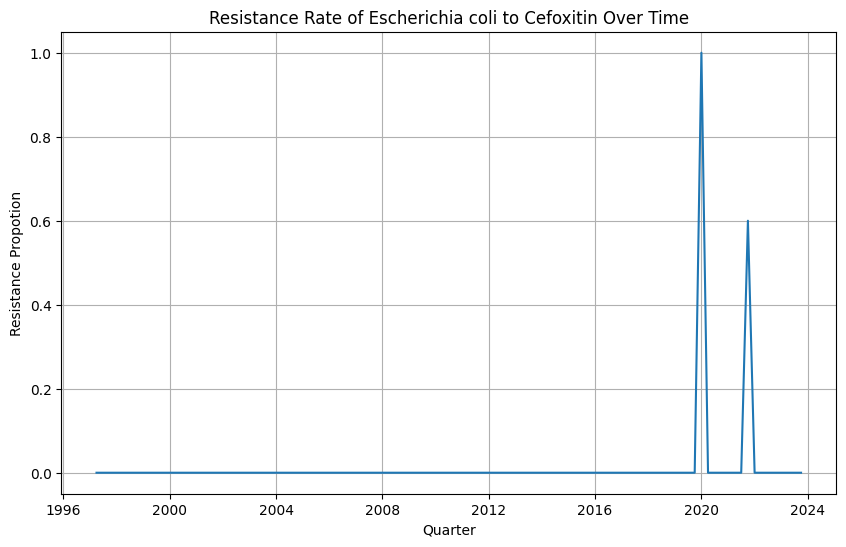

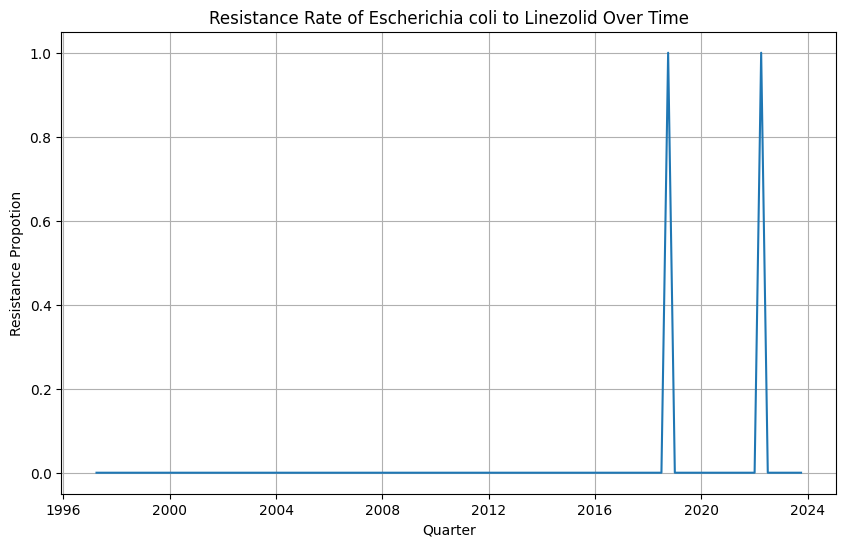

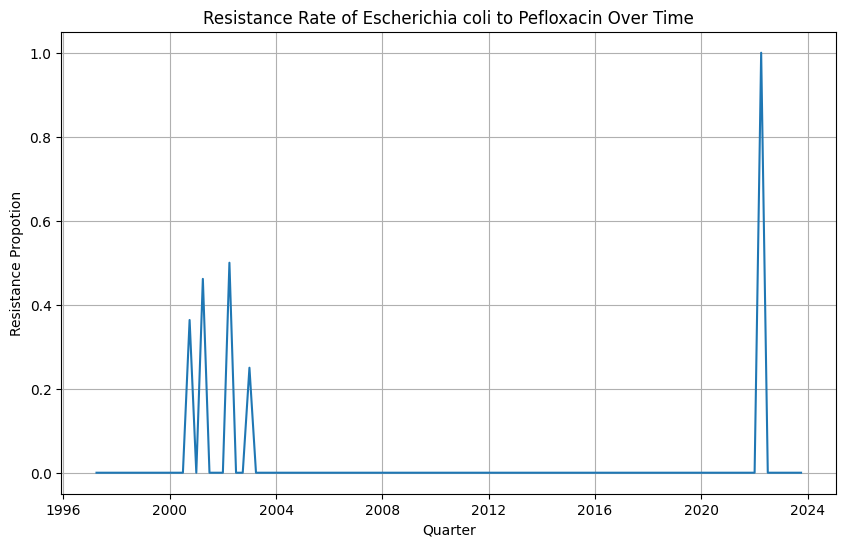

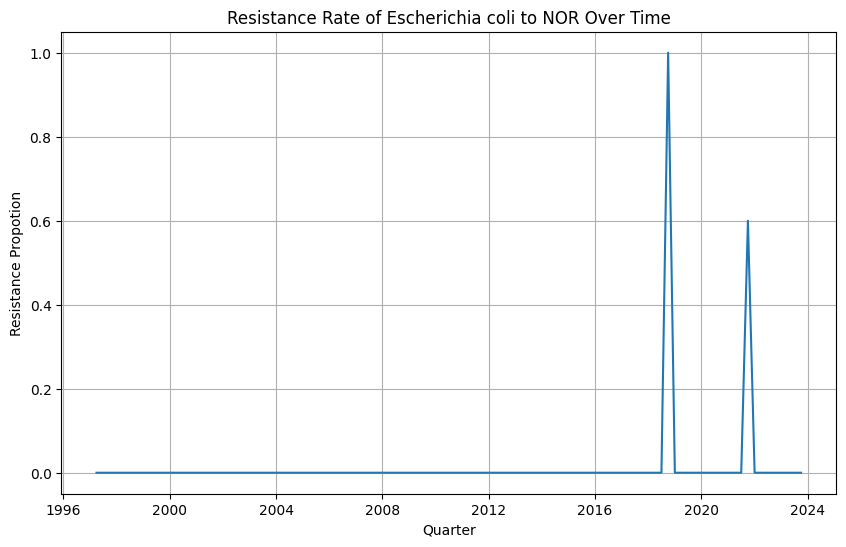

In [34]:
import matplotlib.pyplot as plt

# Plot time series
for organism, antibiotic_data in time_series_dict.items():
    for antibiotic, time_series in antibiotic_data.items():
        plt.figure(figsize=(10, 6))
        # Convert PeriodIndex to datetime
        plt.plot(time_series.index.to_timestamp(), time_series.values)
        plt.title(f"Resistance Rate of {organism} to {antibiotic} Over Time")
        plt.xlabel("Quarter")
        plt.ylabel("Resistance Propotion")
        plt.grid(True)
        plt.show()

In [35]:
#check whether  series are date and time
for organism, antibiotic_data in time_series_dict.items():
    for antibiotic, time_series in antibiotic_data.items():
        print(f"Index type for {organism} - {antibiotic}: {type(time_series.index)}")

Index type for Staphylococcus aureus - Amikacin: <class 'pandas.core.indexes.period.PeriodIndex'>
Index type for Staphylococcus aureus - Amoxilin: <class 'pandas.core.indexes.period.PeriodIndex'>
Index type for Staphylococcus aureus - Amixilin-Clavulate: <class 'pandas.core.indexes.period.PeriodIndex'>
Index type for Staphylococcus aureus - Ampicillin: <class 'pandas.core.indexes.period.PeriodIndex'>
Index type for Staphylococcus aureus - Azithromycin: <class 'pandas.core.indexes.period.PeriodIndex'>
Index type for Staphylococcus aureus - Ceftriaxone: <class 'pandas.core.indexes.period.PeriodIndex'>
Index type for Staphylococcus aureus - Cefuroxime: <class 'pandas.core.indexes.period.PeriodIndex'>
Index type for Staphylococcus aureus - Ciprofloxacin: <class 'pandas.core.indexes.period.PeriodIndex'>
Index type for Staphylococcus aureus - Oxacillin: <class 'pandas.core.indexes.period.PeriodIndex'>
Index type for Staphylococcus aureus - Chloramphenicol: <class 'pandas.core.indexes.period.

In [36]:
#converting series into date and time
for organism, antibiotic_data in time_series_dict.items():
    for antibiotic, time_series in antibiotic_data.items():
        if isinstance(time_series.index, pd.PeriodIndex):
            time_series.index = time_series.index.to_timestamp()  # Convert PeriodIndex to DatetimeIndex
            time_series.sort_index(inplace=True)  # Sort the index
            #check negative dates
            negative_dates = time_series[time_series.index < pd.Timestamp(0)]
            print(f"Negative dates found for {organism} - {antibiotic}:")
            print(negative_dates)



        # ... (rest of your code for decomposition and plotting)

Negative dates found for Staphylococcus aureus - Amikacin:
Series([], Freq: QS-OCT, Name: Resistance_Rate, dtype: float64)
Negative dates found for Staphylococcus aureus - Amoxilin:
Series([], Freq: QS-OCT, Name: Resistance_Rate, dtype: float64)
Negative dates found for Staphylococcus aureus - Amixilin-Clavulate:
Series([], Freq: QS-OCT, Name: Resistance_Rate, dtype: float64)
Negative dates found for Staphylococcus aureus - Ampicillin:
Series([], Freq: QS-OCT, Name: Resistance_Rate, dtype: float64)
Negative dates found for Staphylococcus aureus - Azithromycin:
Series([], Freq: QS-OCT, Name: Resistance_Rate, dtype: float64)
Negative dates found for Staphylococcus aureus - Ceftriaxone:
Series([], Freq: QS-OCT, Name: Resistance_Rate, dtype: float64)
Negative dates found for Staphylococcus aureus - Cefuroxime:
Series([], Freq: QS-OCT, Name: Resistance_Rate, dtype: float64)
Negative dates found for Staphylococcus aureus - Ciprofloxacin:
Series([], Freq: QS-OCT, Name: Resistance_Rate, dtype:

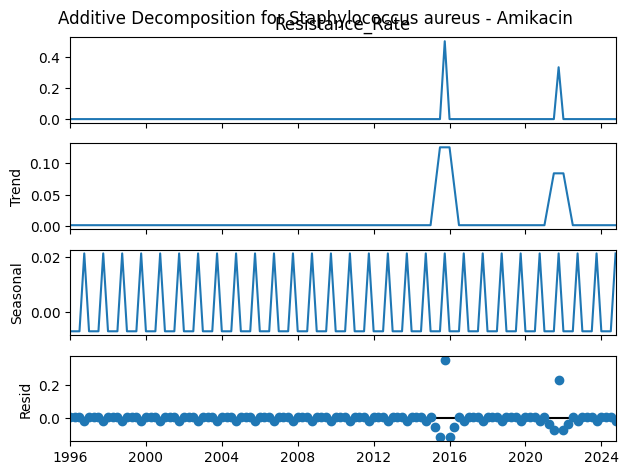

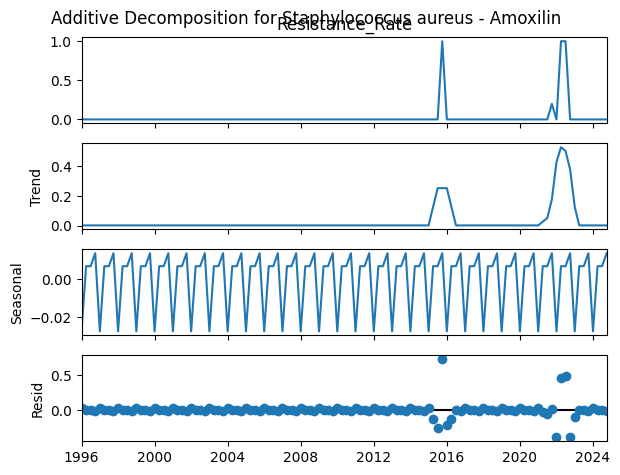

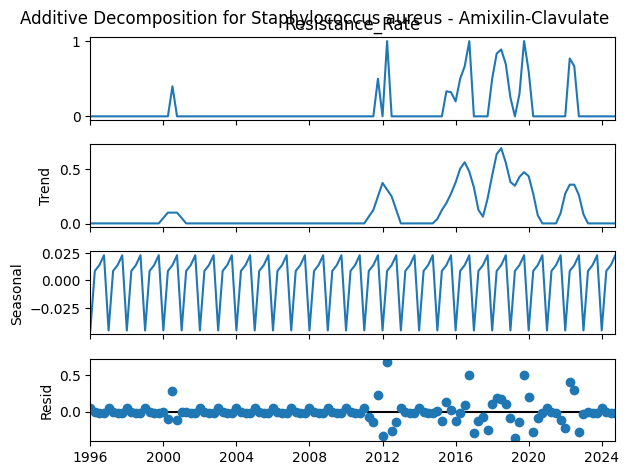

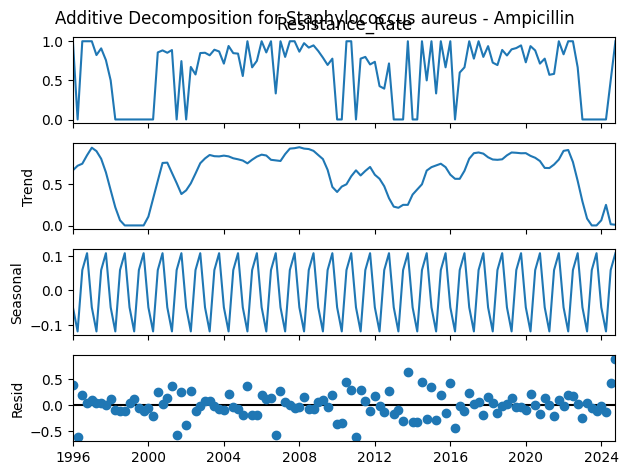

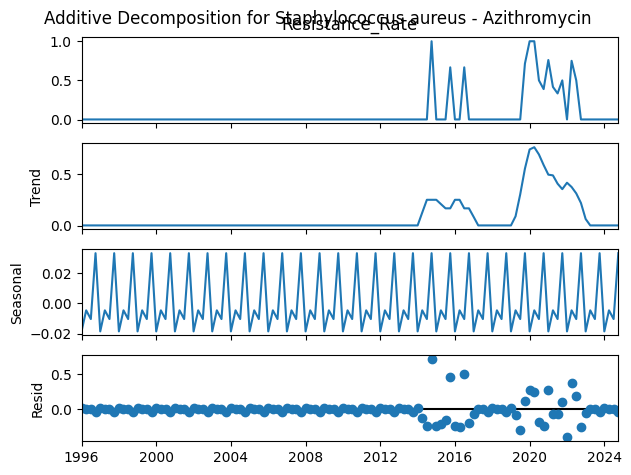

...

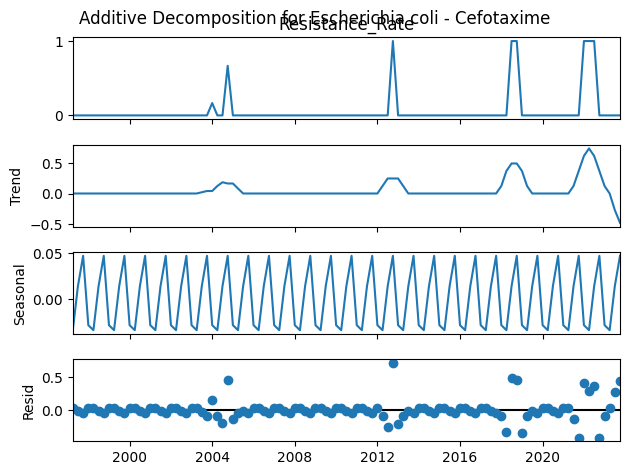

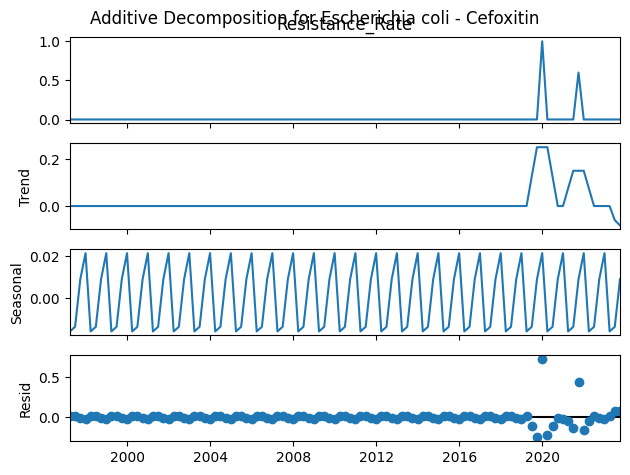

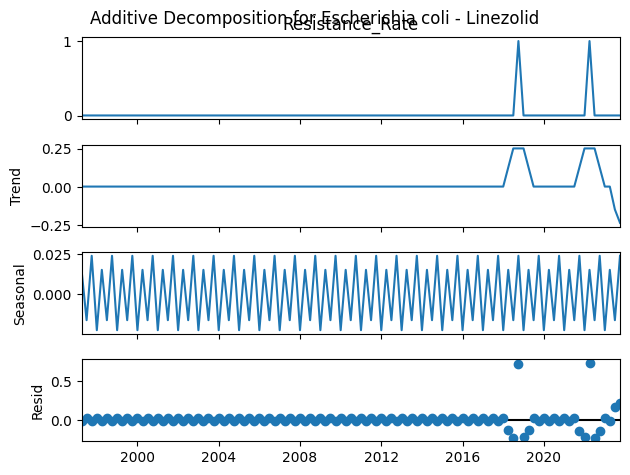

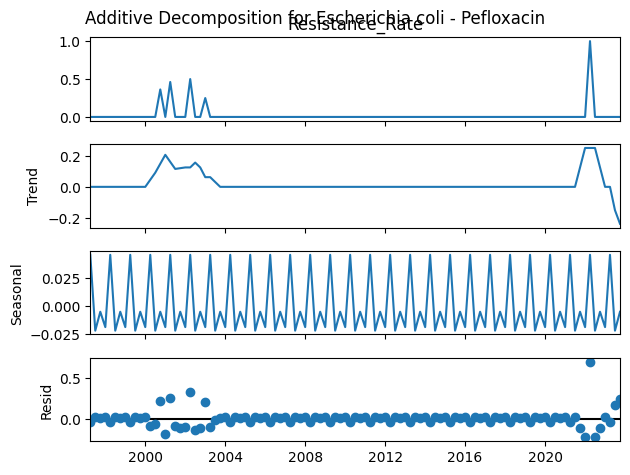

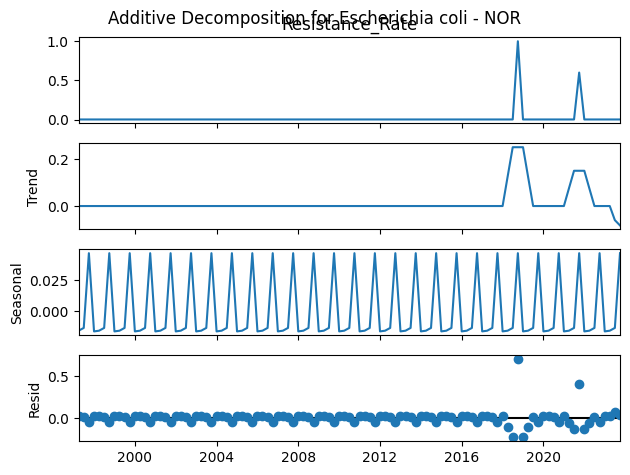

In [37]:
from statsmodels.tsa.seasonal import seasonal_decompose

for organism, antibiotic_data in time_series_dict.items():
    for antibiotic, time_series in antibiotic_data.items():
        # Convert index to DatetimeIndex if it's PeriodIndex
        if isinstance(time_series.index, pd.PeriodIndex):
            time_series.index = time_series.index.to_timestamp()

        # Replace zero values with a small non-zero value
        time_series = time_series.replace(0, 0.001)
        # Create subplots for side-by-side decomposition

       # for model in ['multiplicative', 'additive']:
        for model in ['additive']:
            result = seasonal_decompose(time_series, model=model, extrapolate_trend='freq')

            result.plot()
            plt.suptitle(f"{model.capitalize()} Decomposition for {organism} - {antibiotic}")
            plt.show()

In [38]:
print(time_series)

Quarter
1997-04-01    0.001
1997-07-01    0.001
1997-10-01    0.001
1998-01-01    0.001
1998-04-01    0.001
              ...  
2022-10-01    0.001
2023-01-01    0.001
2023-04-01    0.001
2023-07-01    0.001
2023-10-01    0.001
Freq: QS-OCT, Name: Resistance_Rate, Length: 107, dtype: float64


Fine-tuning SARIMA model for Staphylococcus aureus - Amikacin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                 147.350
Date:                            Sun, 24 Nov 2024   AIC                           -286.701
Time:                                    07:26:07   BIC                           -276.047
Sample:                                01-01-1996   HQIC                          -282.383
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


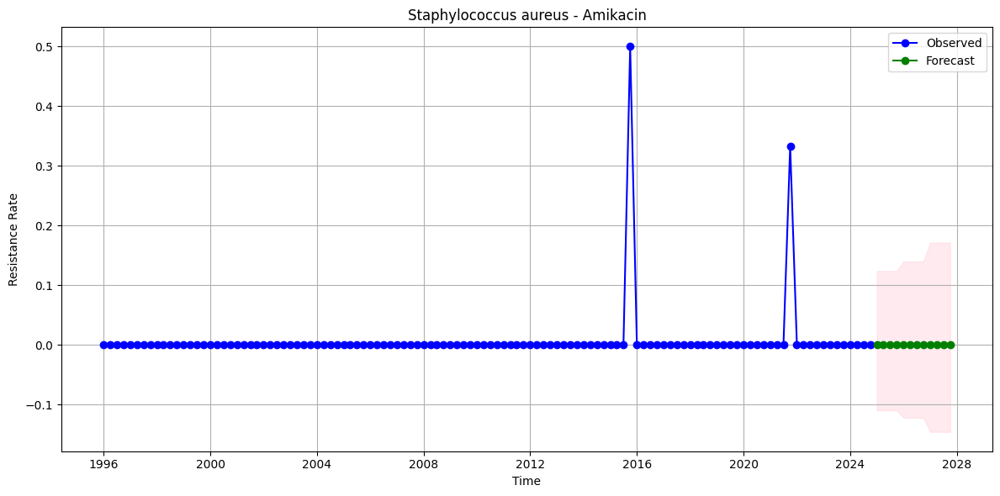

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.0


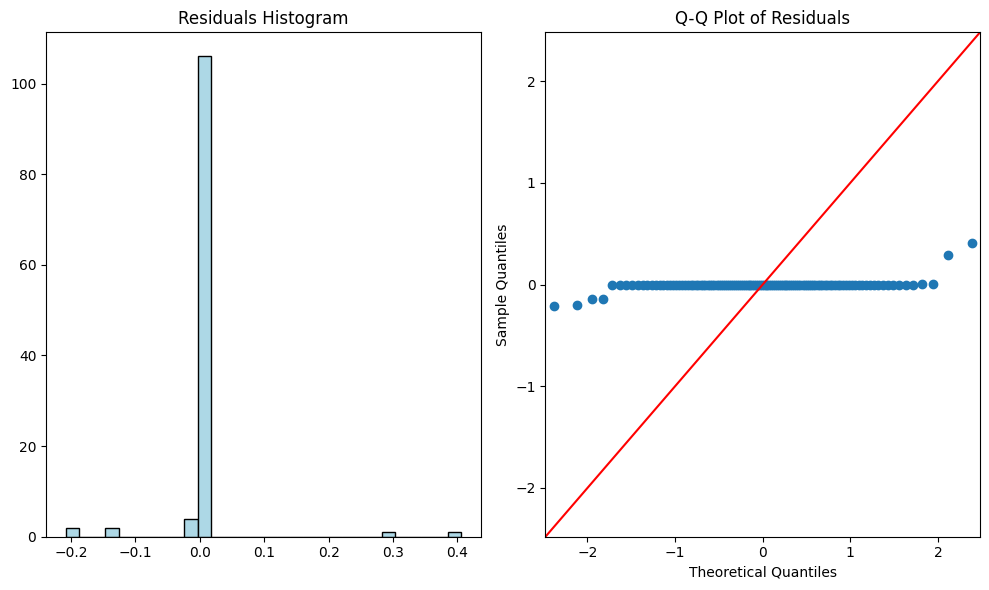

Fine-tuning SARIMA model for Staphylococcus aureus - Amoxilin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  57.780
Date:                            Sun, 24 Nov 2024   AIC                           -107.559
Time:                                    07:26:08   BIC                            -96.906
Sample:                                01-01-1996   HQIC                          -103.241
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


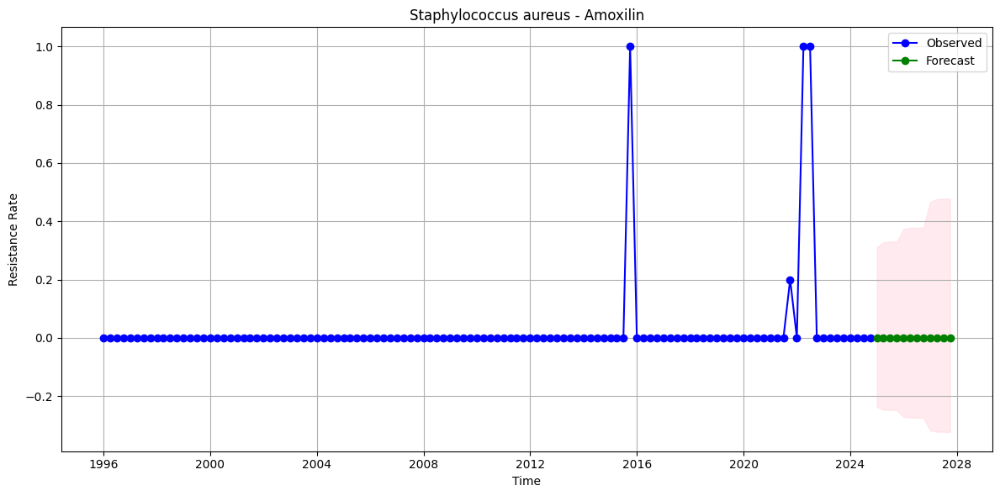

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 4.508275131501511e-220


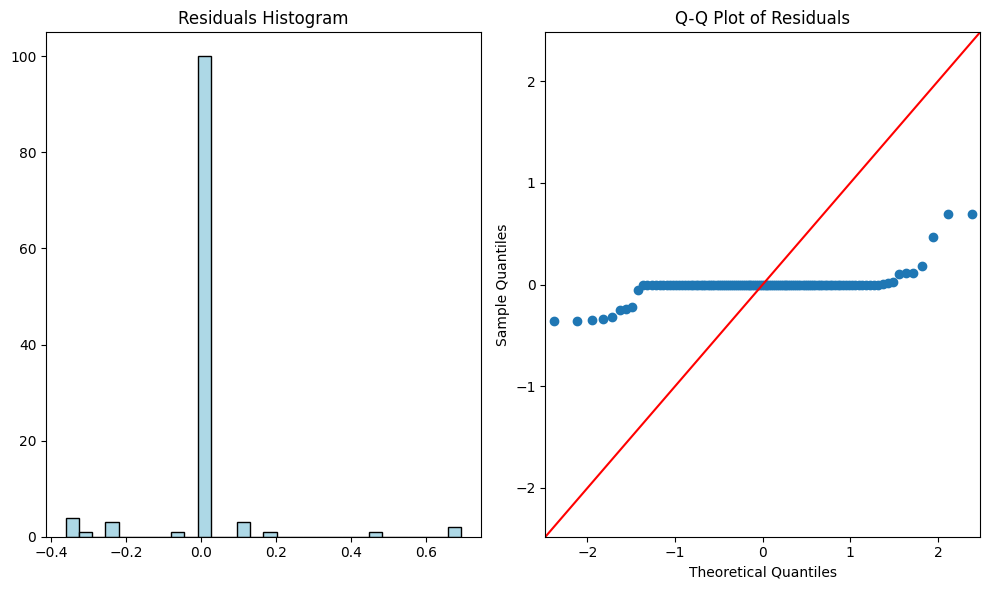

Fine-tuning SARIMA model for Staphylococcus aureus - Amixilin-Clavulate
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  19.217
Date:                            Sun, 24 Nov 2024   AIC                            -30.434
Time:                                    07:26:08   BIC                            -19.780
Sample:                                01-01-1996   HQIC                           -26.116
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------

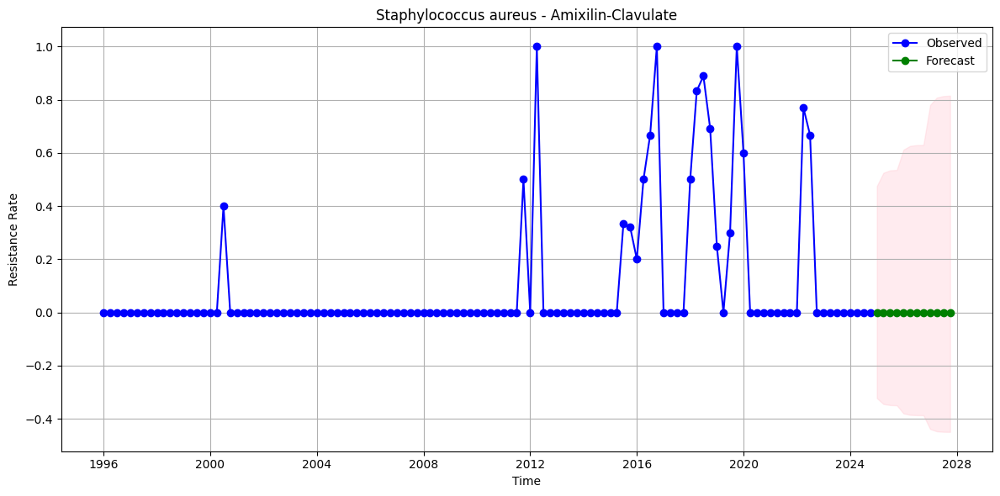

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 2.1530047032952404e-09


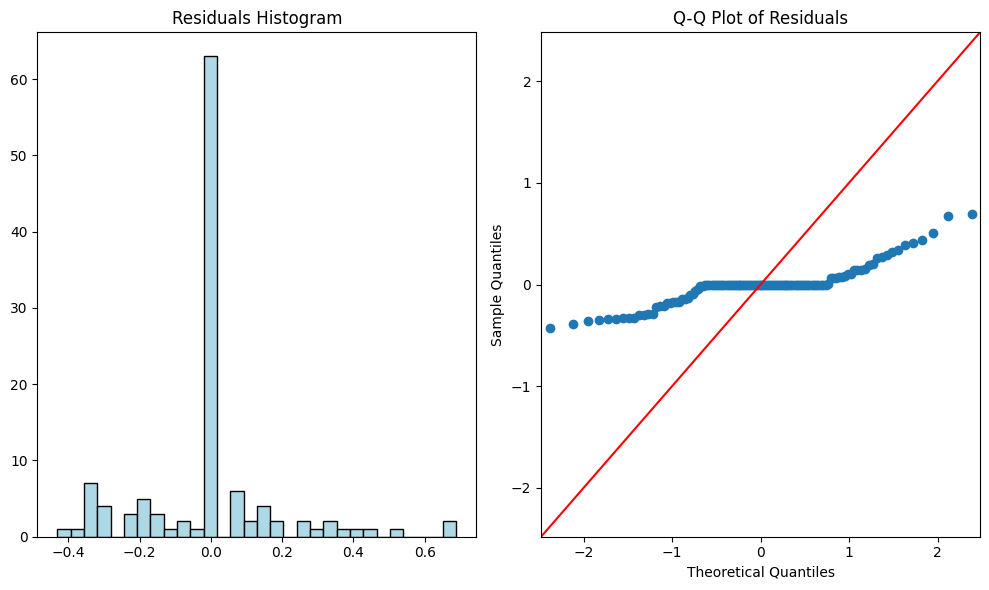

Fine-tuning SARIMA model for Staphylococcus aureus - Ampicillin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                 -15.382
Date:                            Sun, 24 Nov 2024   AIC                             38.763
Time:                                    07:26:09   BIC                             49.417
Sample:                                01-01-1996   HQIC                            43.081
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1 

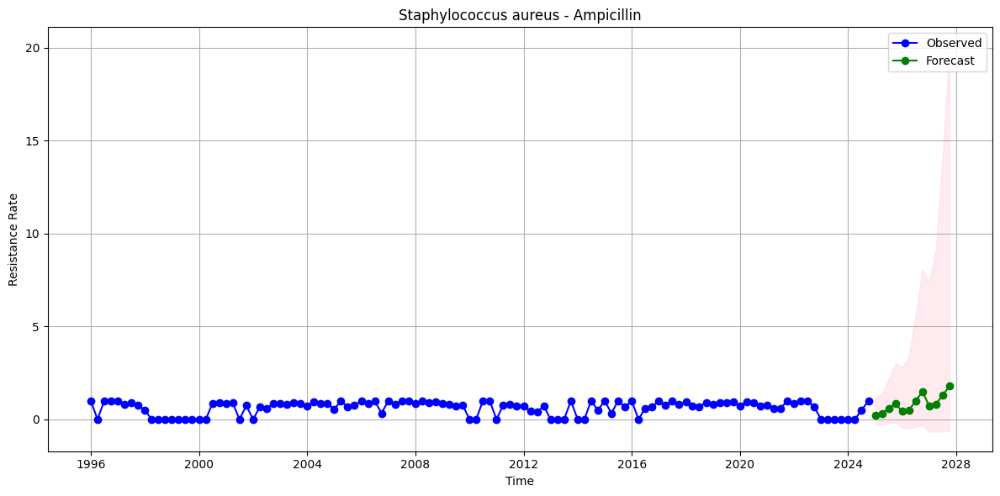

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.2493841283090105


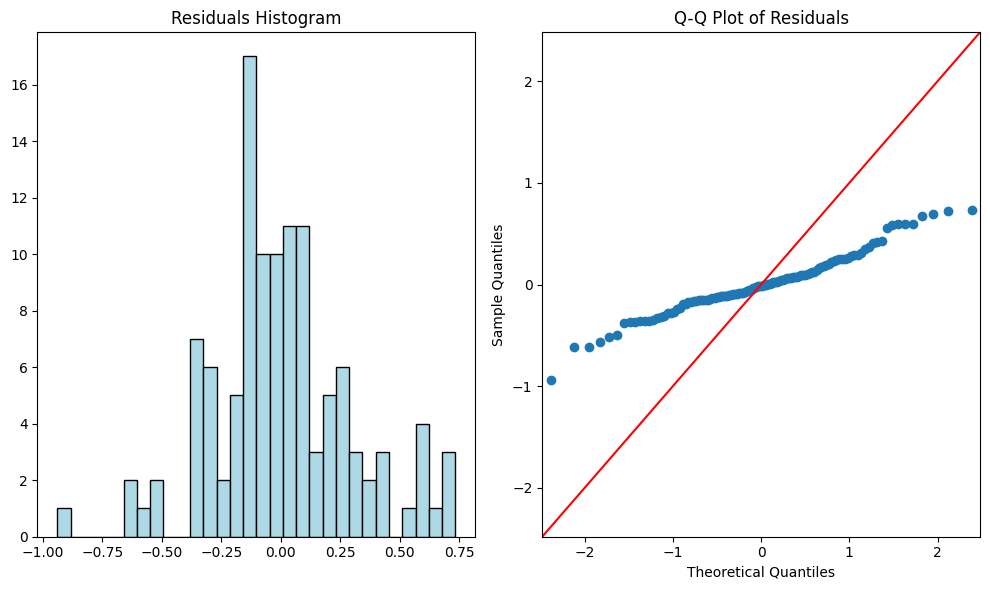

Fine-tuning SARIMA model for Staphylococcus aureus - Azithromycin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  30.032
Date:                            Sun, 24 Nov 2024   AIC                            -52.065
Time:                                    07:26:10   BIC                            -41.411
Sample:                                01-01-1996   HQIC                           -47.747
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


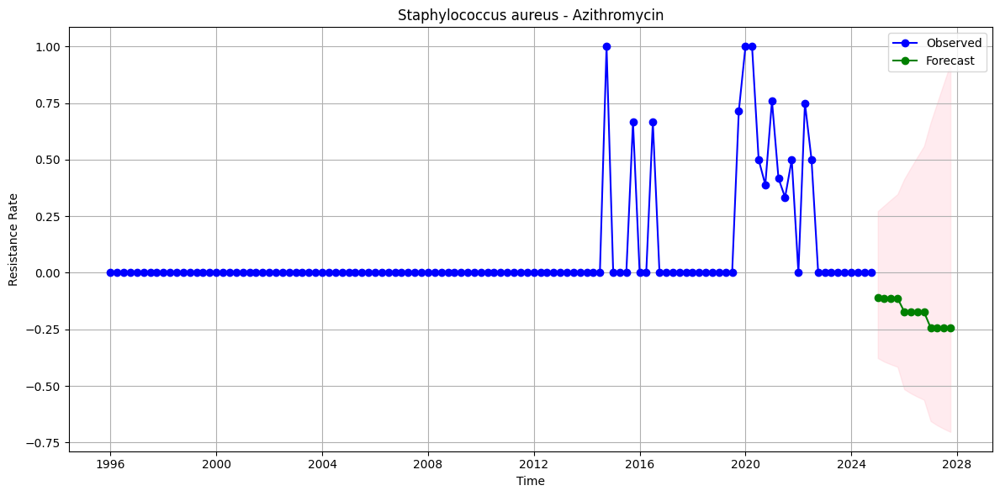

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 1.2279938574613009e-67


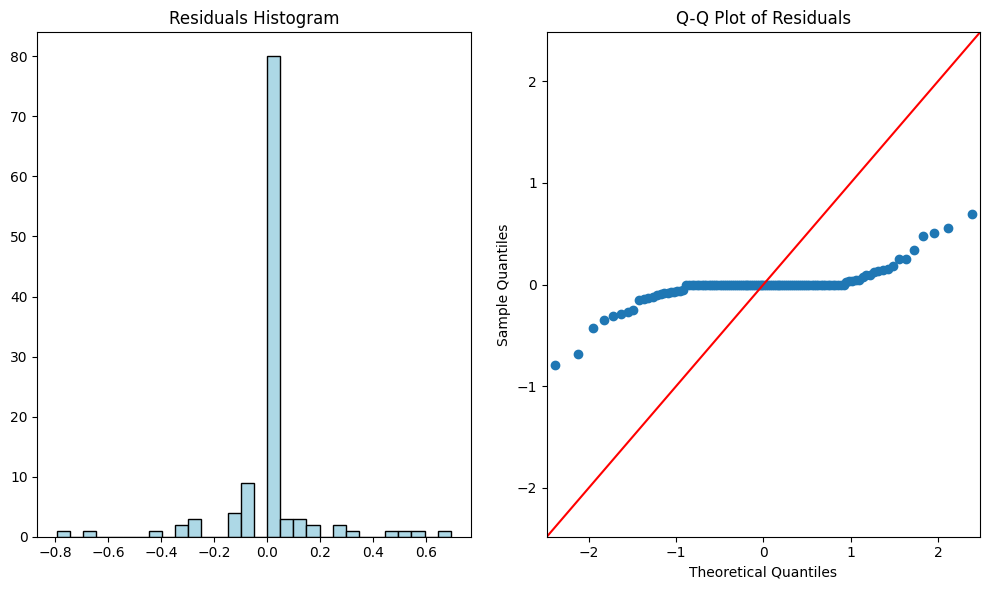

Fine-tuning SARIMA model for Staphylococcus aureus - Ceftriaxone
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                   9.655
Date:                            Sun, 24 Nov 2024   AIC                            -11.309
Time:                                    07:26:11   BIC                             -0.655
Sample:                                01-01-1996   HQIC                            -6.991
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1

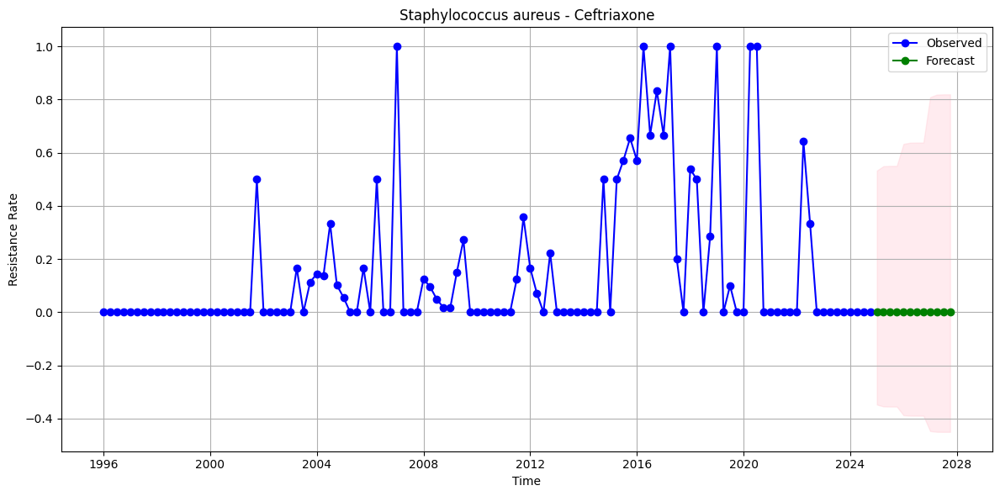

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.0004070593625112236


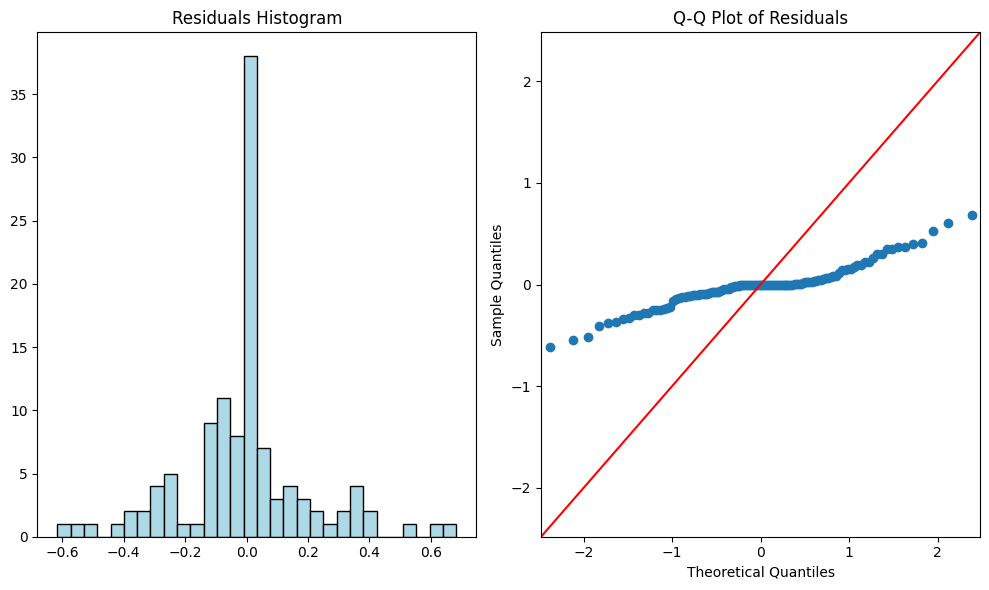

Fine-tuning SARIMA model for Staphylococcus aureus - Cefuroxime
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  71.569
Date:                            Sun, 24 Nov 2024   AIC                           -135.139
Time:                                    07:26:12   BIC                           -124.485
Sample:                                01-01-1996   HQIC                          -130.821
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


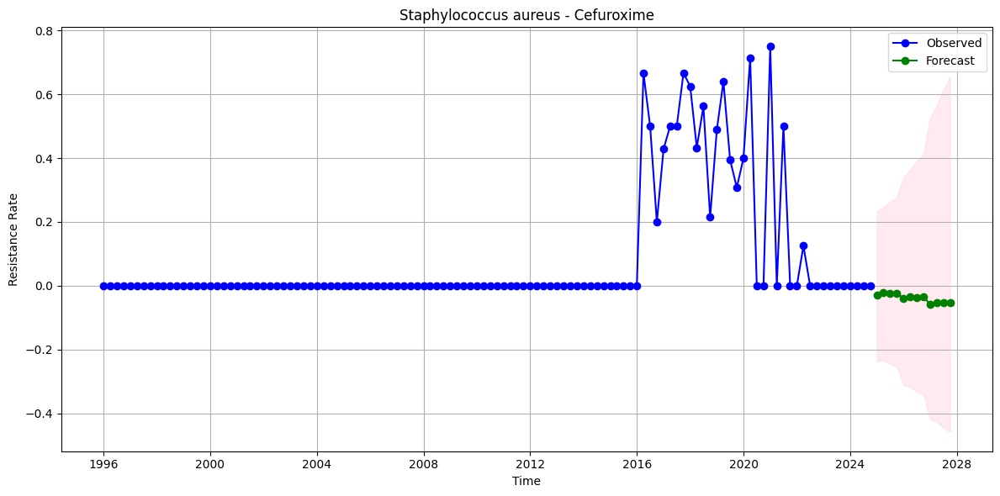

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 1.7561494104547928e-45


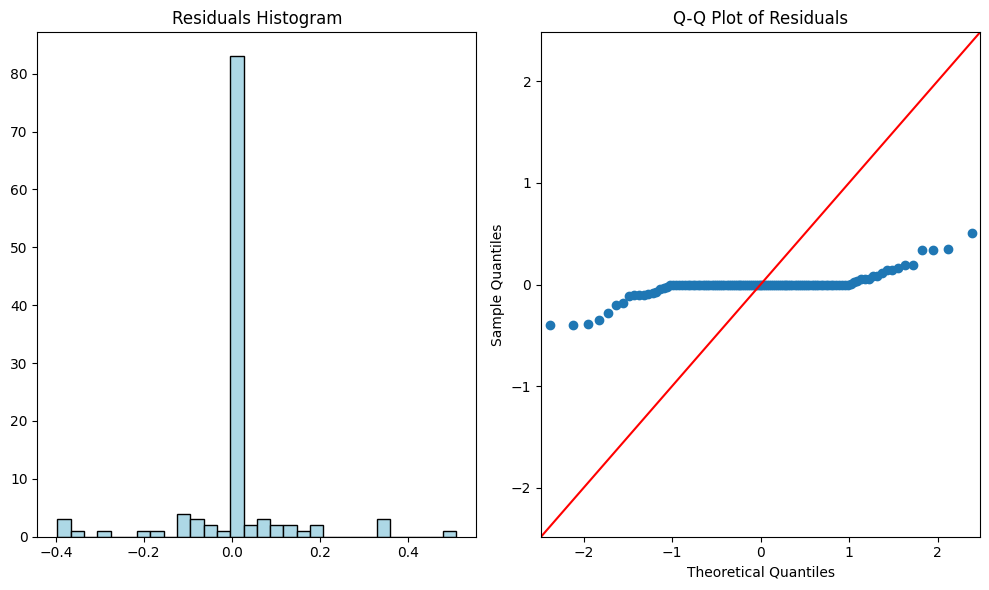

Fine-tuning SARIMA model for Staphylococcus aureus - Ciprofloxacin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  27.748
Date:                            Sun, 24 Nov 2024   AIC                            -47.496
Time:                                    07:26:13   BIC                            -36.842
Sample:                                01-01-1996   HQIC                           -43.178
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.

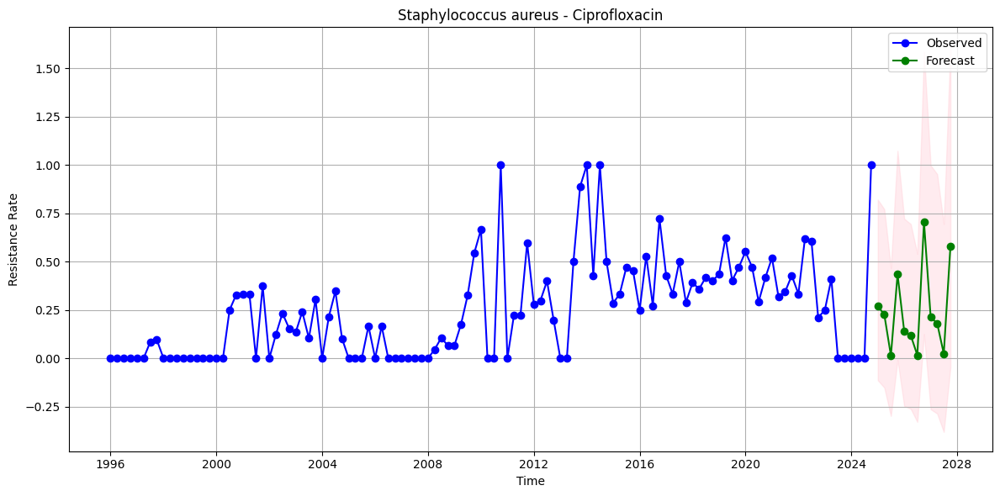

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.0003689183233577976


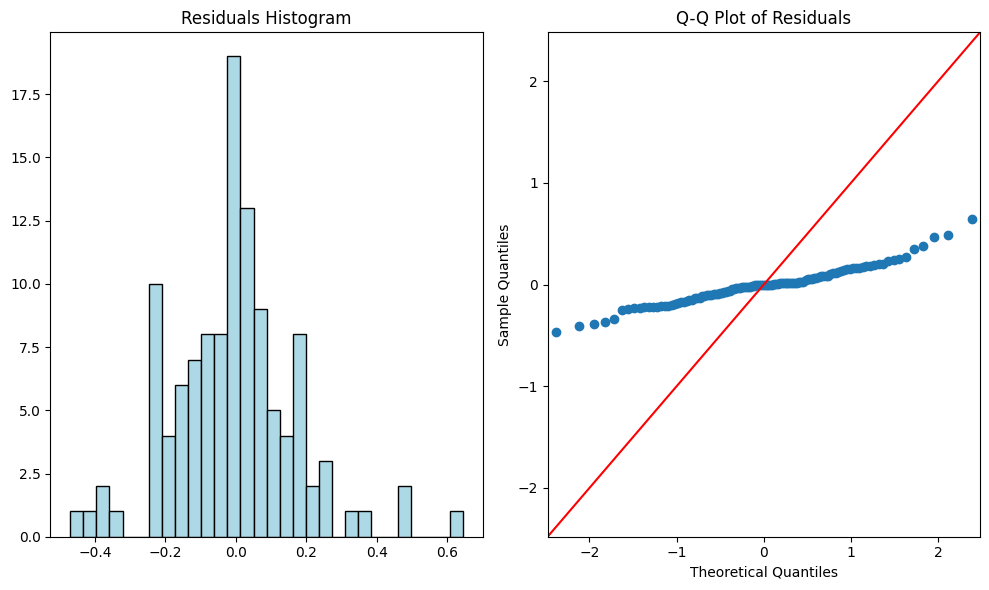

Fine-tuning SARIMA model for Staphylococcus aureus - Oxacillin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                 -13.614
Date:                            Sun, 24 Nov 2024   AIC                             35.227
Time:                                    07:26:14   BIC                             45.881
Sample:                                01-01-1996   HQIC                            39.545
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1  

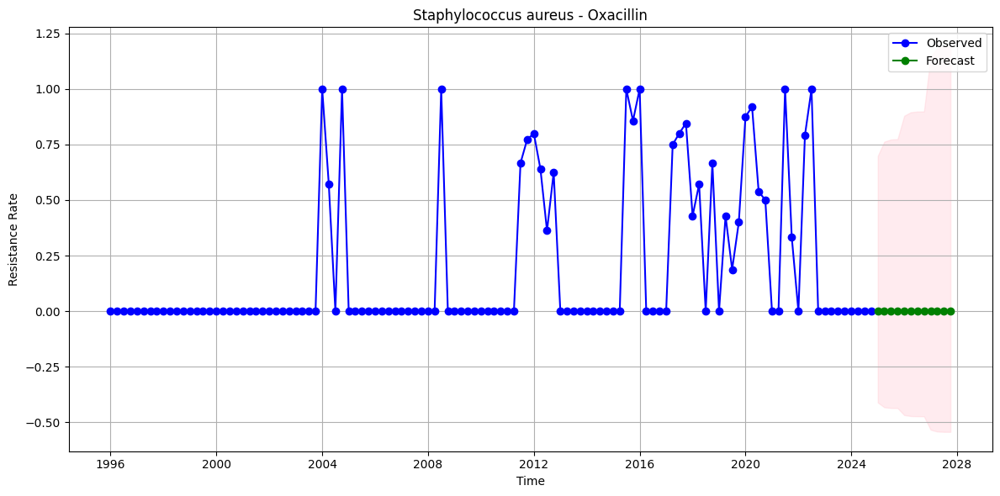

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.002156411573410539


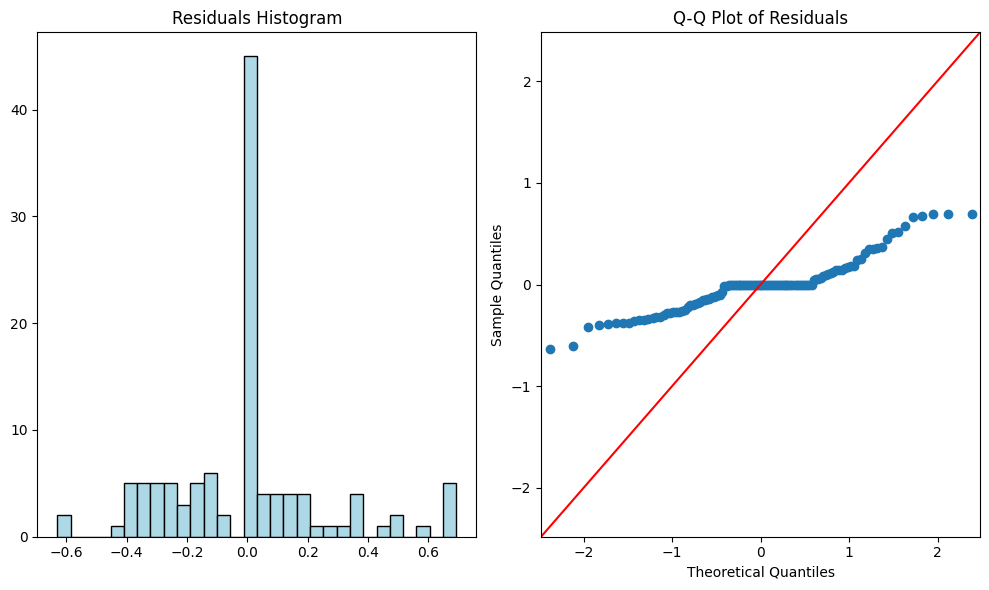

Fine-tuning SARIMA model for Staphylococcus aureus - Chloramphenicol
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                 -15.274
Date:                            Sun, 24 Nov 2024   AIC                             38.548
Time:                                    07:26:15   BIC                             49.202
Sample:                                01-01-1996   HQIC                            42.866
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
a

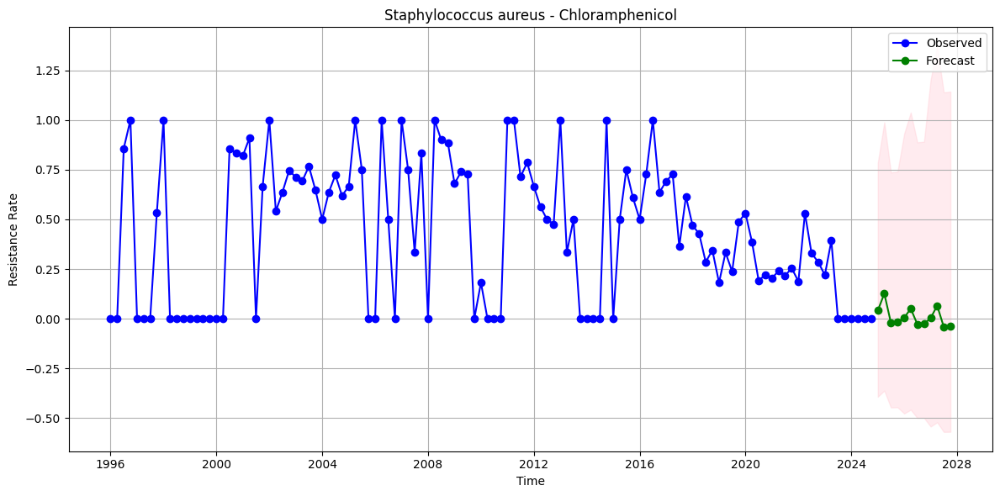

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.787341052111376


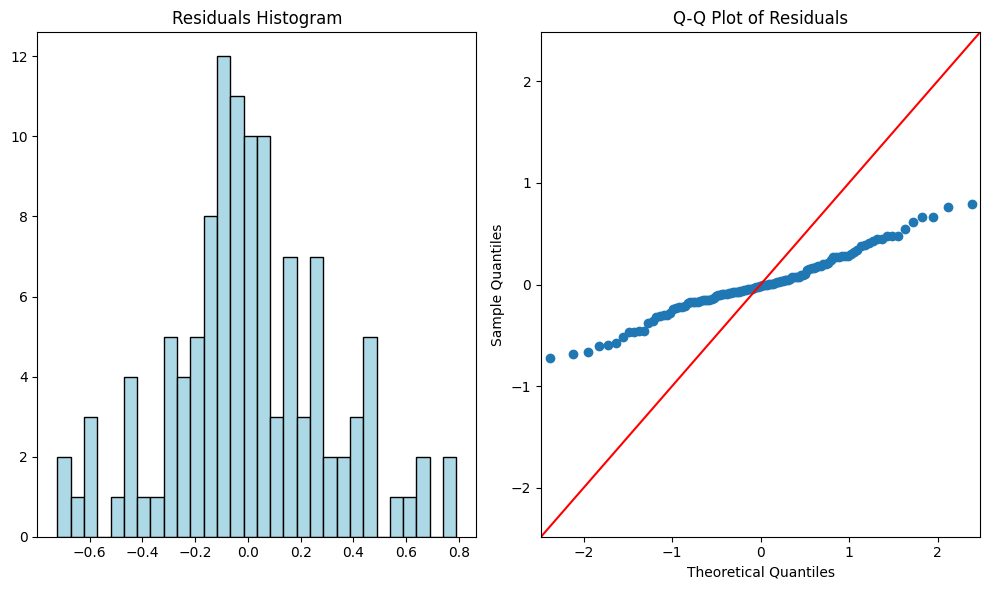

Fine-tuning SARIMA model for Staphylococcus aureus - Clindamycin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  31.482
Date:                            Sun, 24 Nov 2024   AIC                            -54.963
Time:                                    07:26:16   BIC                            -44.310
Sample:                                01-01-1996   HQIC                           -50.645
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


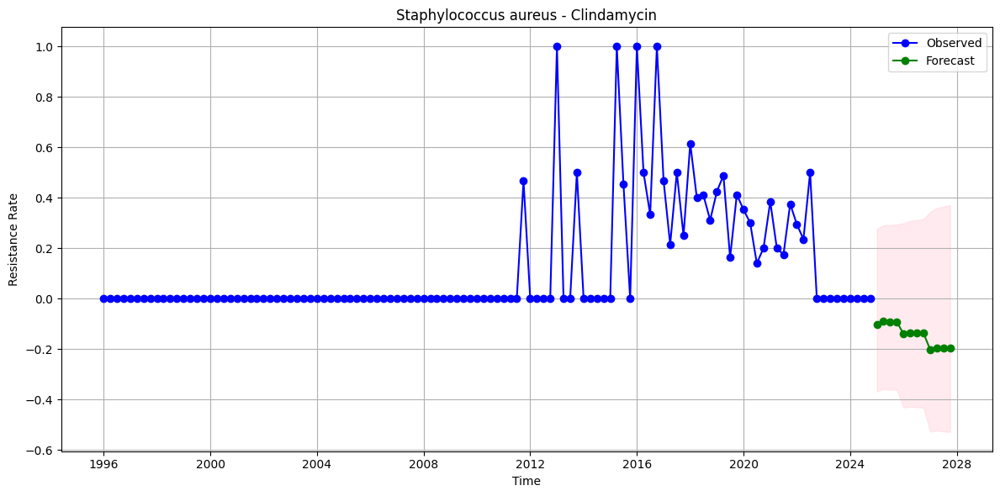

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 4.606449684119233e-53


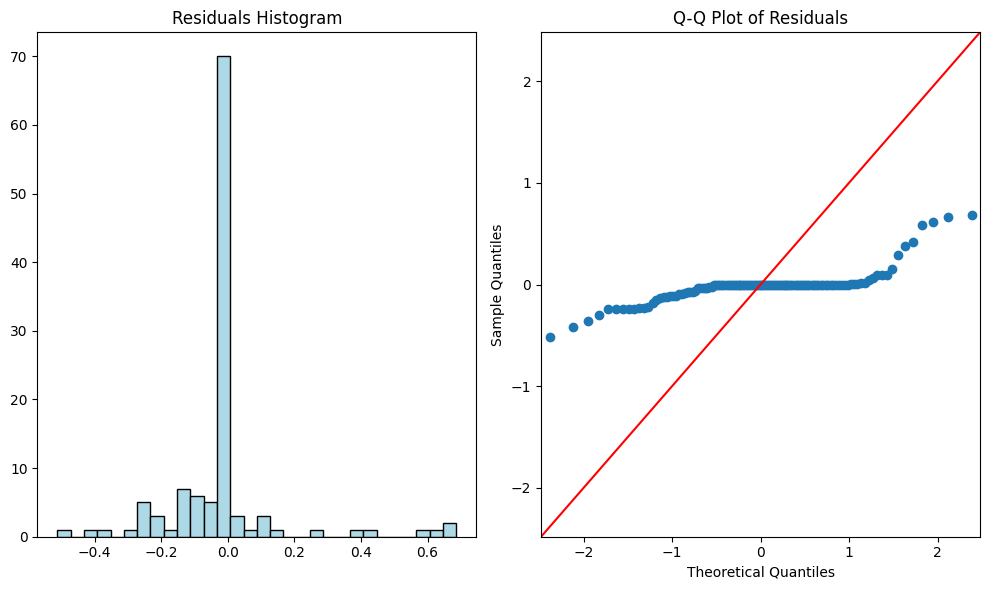

Fine-tuning SARIMA model for Staphylococcus aureus - Gentamycin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                   9.787
Date:                            Sun, 24 Nov 2024   AIC                            -11.574
Time:                                    07:26:16   BIC                             -0.920
Sample:                                01-01-1996   HQIC                            -7.256
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1 

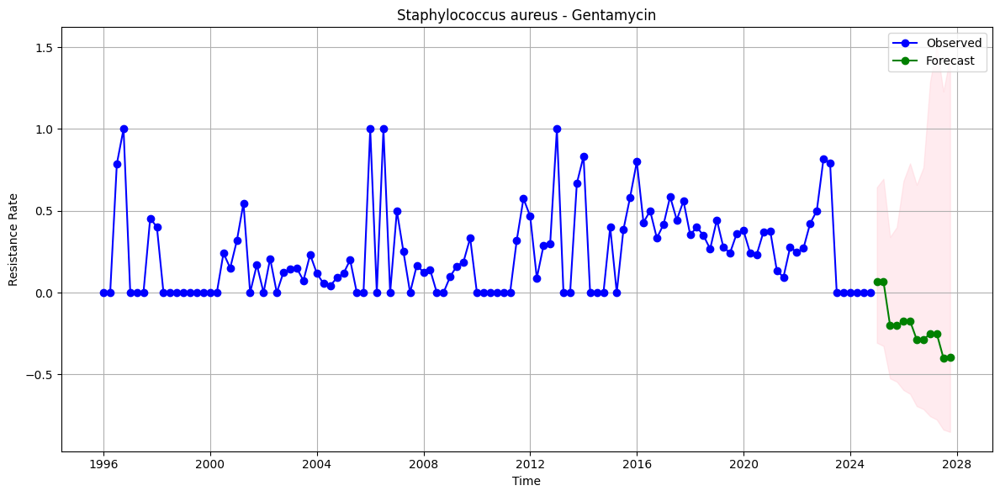

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.7932609191110617


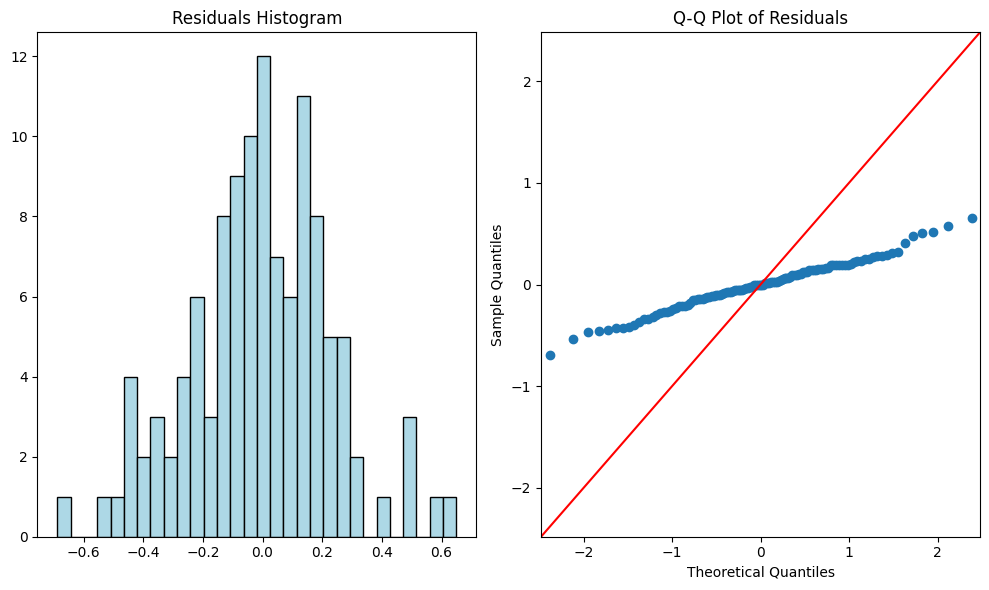

Fine-tuning SARIMA model for Staphylococcus aureus - Erythromycin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  -5.508
Date:                            Sun, 24 Nov 2024   AIC                             19.016
Time:                                    07:26:18   BIC                             29.670
Sample:                                01-01-1996   HQIC                            23.334
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L

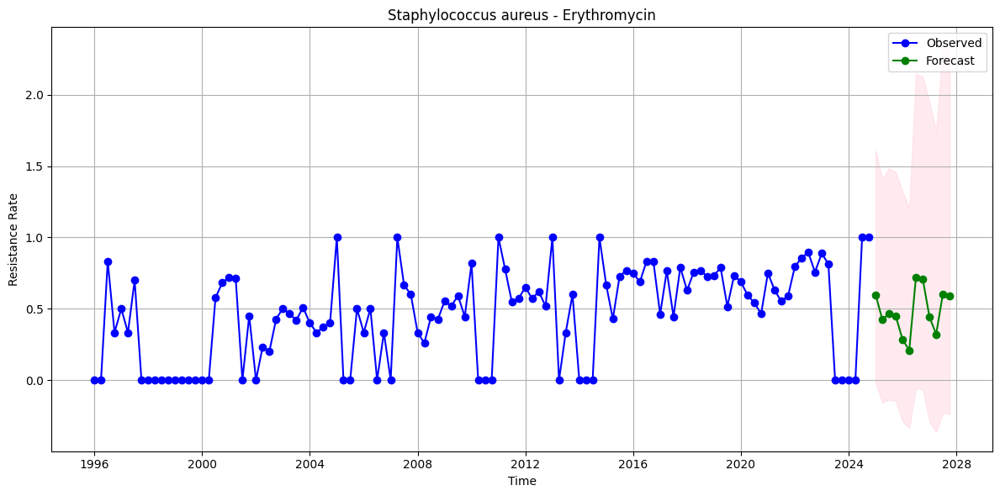

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.9029776155836023


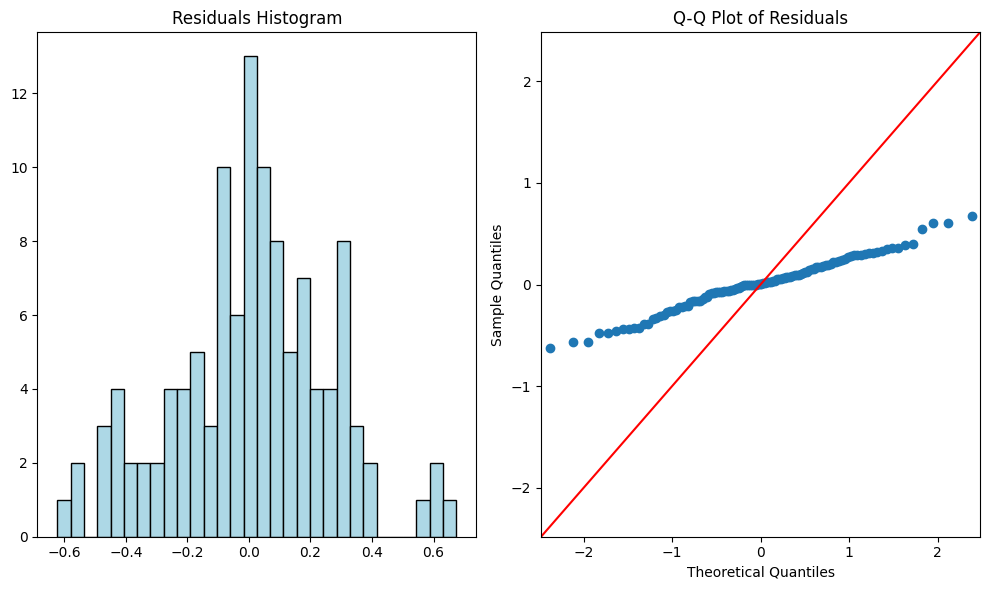

Fine-tuning SARIMA model for Staphylococcus aureus - Tetracycline
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                 -31.665
Date:                            Sun, 24 Nov 2024   AIC                             71.330
Time:                                    07:26:19   BIC                             81.983
Sample:                                01-01-1996   HQIC                            75.648
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L

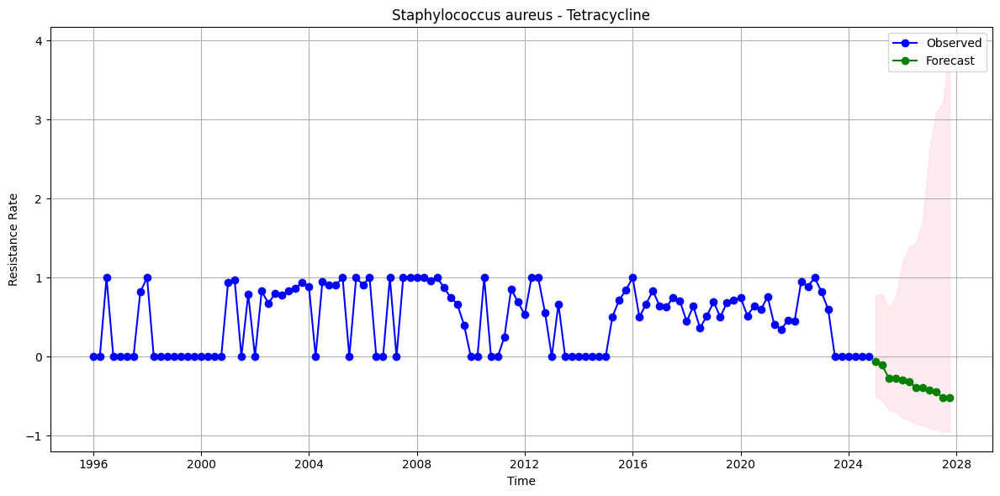

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.32325171440933737


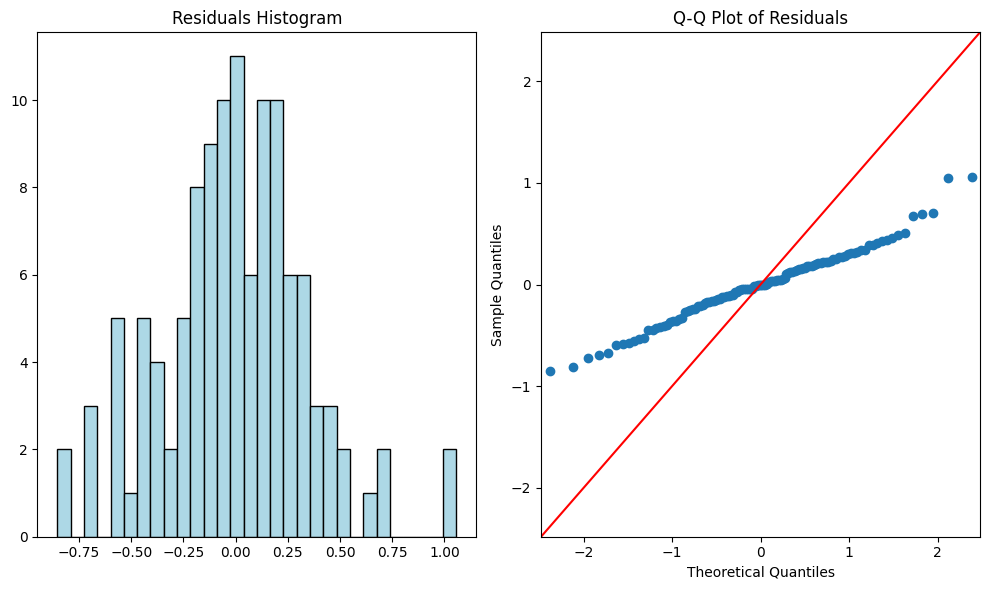

Fine-tuning SARIMA model for Staphylococcus aureus - Trimethoprim
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                 -24.898
Date:                            Sun, 24 Nov 2024   AIC                             57.796
Time:                                    07:26:20   BIC                             68.450
Sample:                                01-01-1996   HQIC                            62.114
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L

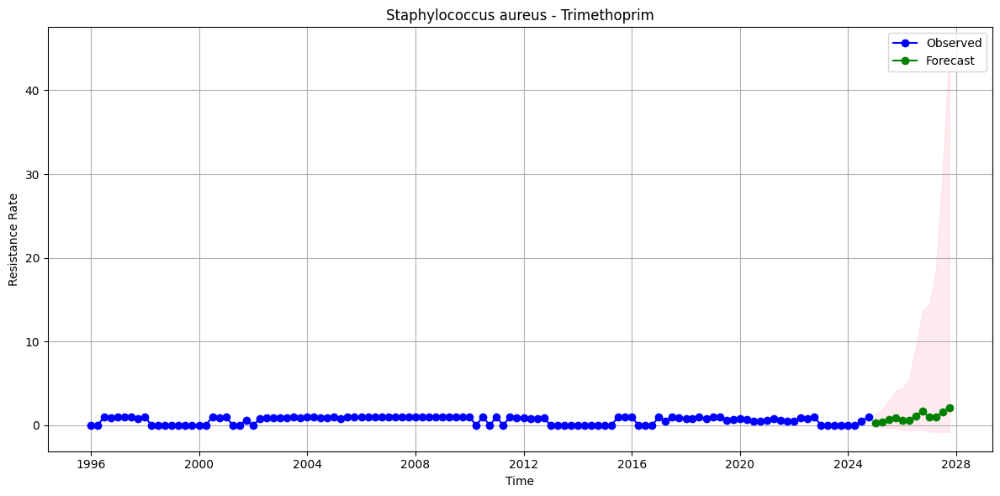

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.22428544753418006


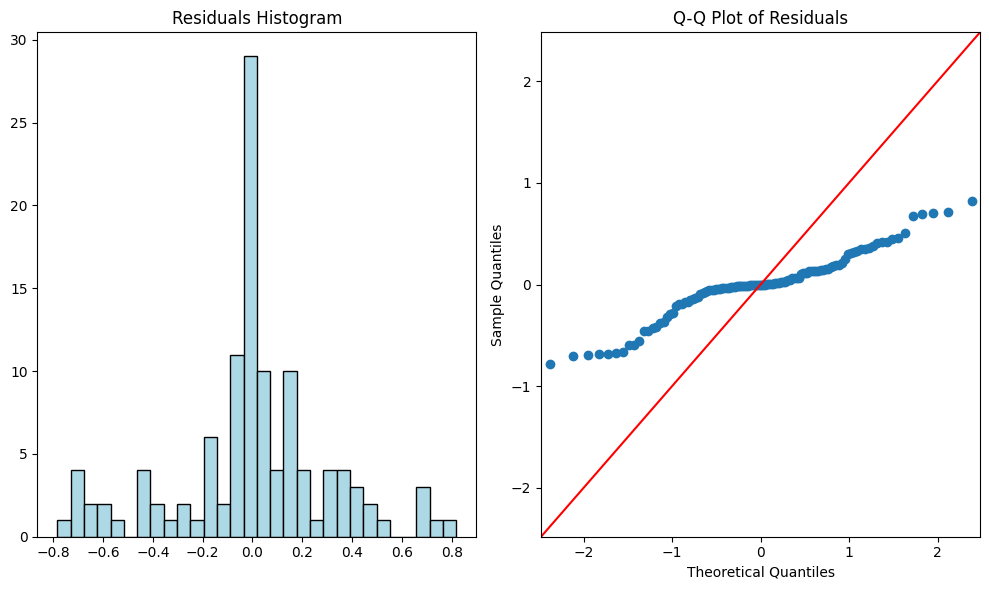

Fine-tuning SARIMA model for Staphylococcus aureus - Vancomycin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                 104.451
Date:                            Sun, 24 Nov 2024   AIC                           -200.901
Time:                                    07:26:21   BIC                           -190.248
Sample:                                01-01-1996   HQIC                          -196.583
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


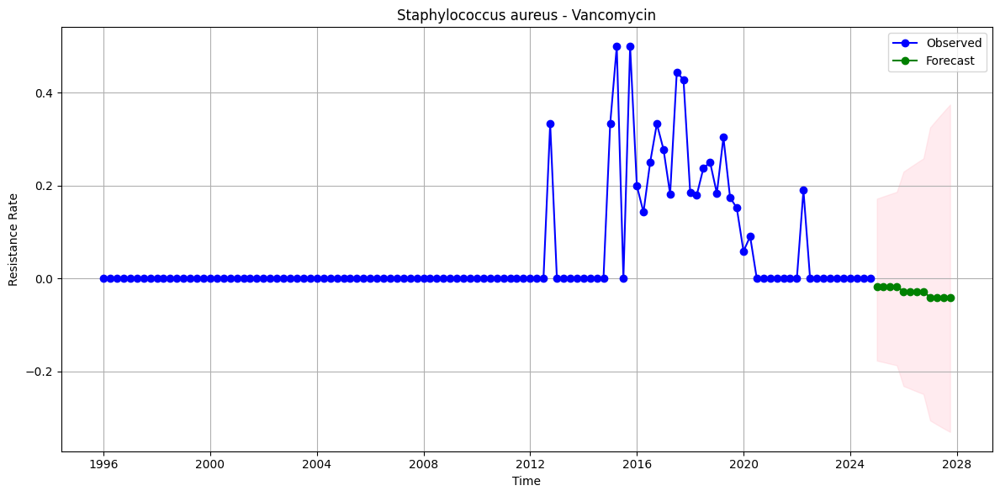

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 1.721529720261305e-48


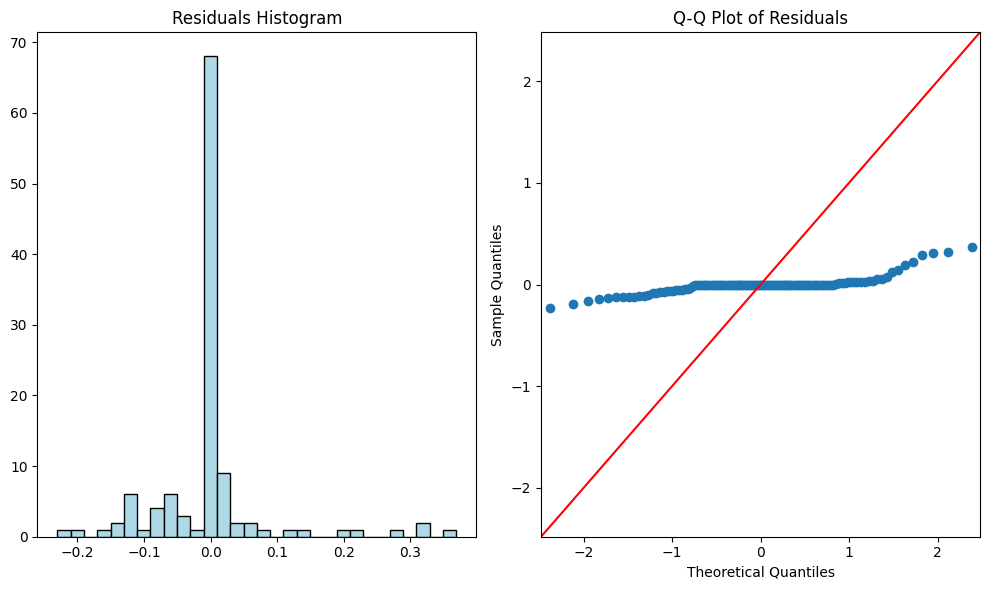

Fine-tuning SARIMA model for Staphylococcus aureus - Penicillin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                 -25.086
Date:                            Sun, 24 Nov 2024   AIC                             58.172
Time:                                    07:26:22   BIC                             68.826
Sample:                                01-01-1996   HQIC                            62.490
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1 

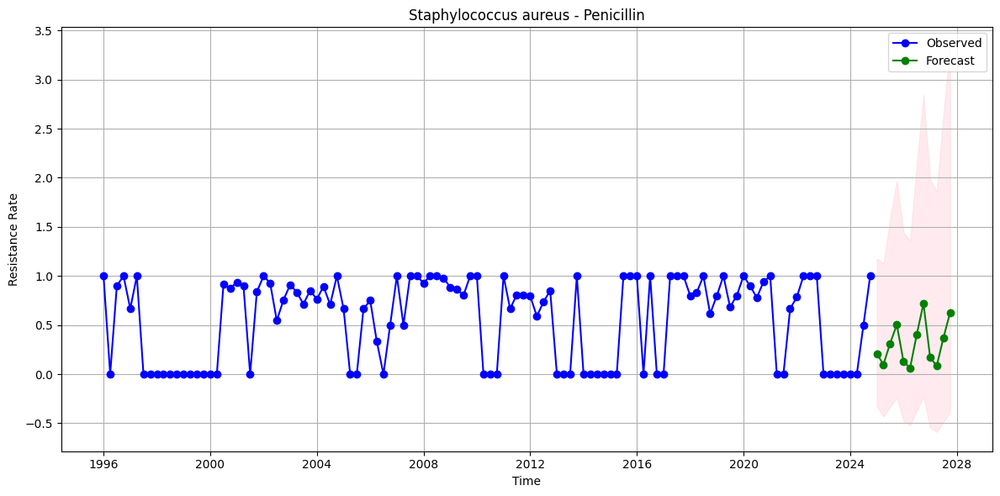

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 1.3960475411961133e-05


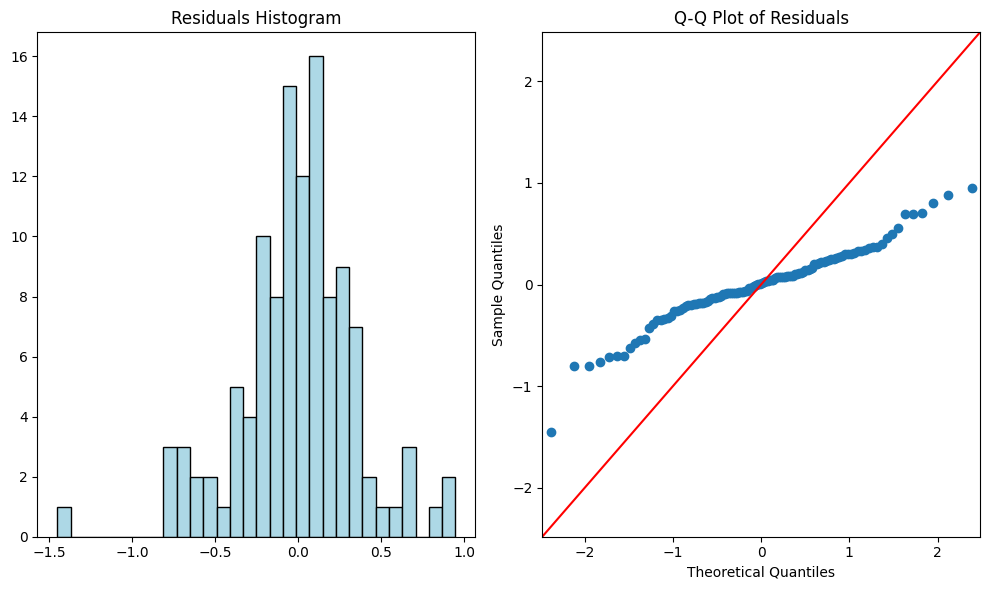

Fine-tuning SARIMA model for Staphylococcus aureus - Imipenem
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  76.243
Date:                            Sun, 24 Nov 2024   AIC                           -144.487
Time:                                    07:26:23   BIC                           -133.833
Sample:                                01-01-1996   HQIC                          -140.169
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


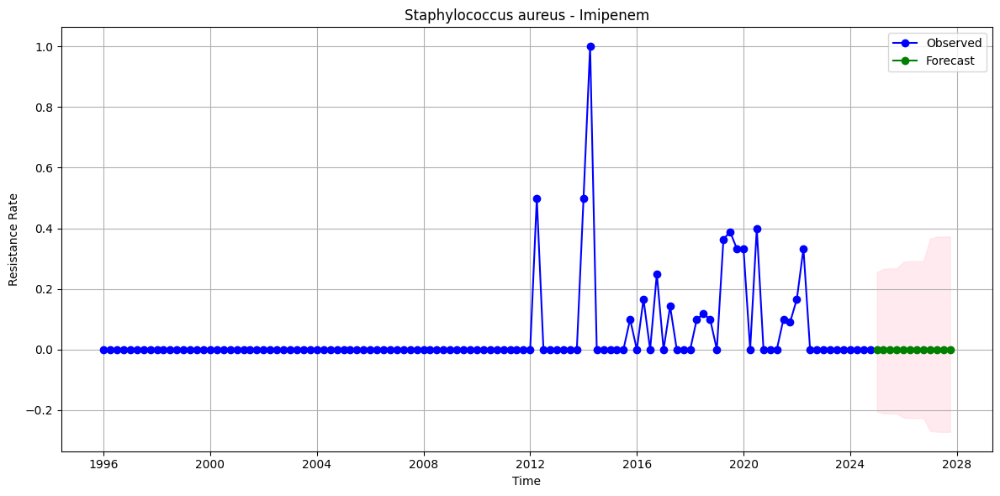

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 1.129014850647518e-16


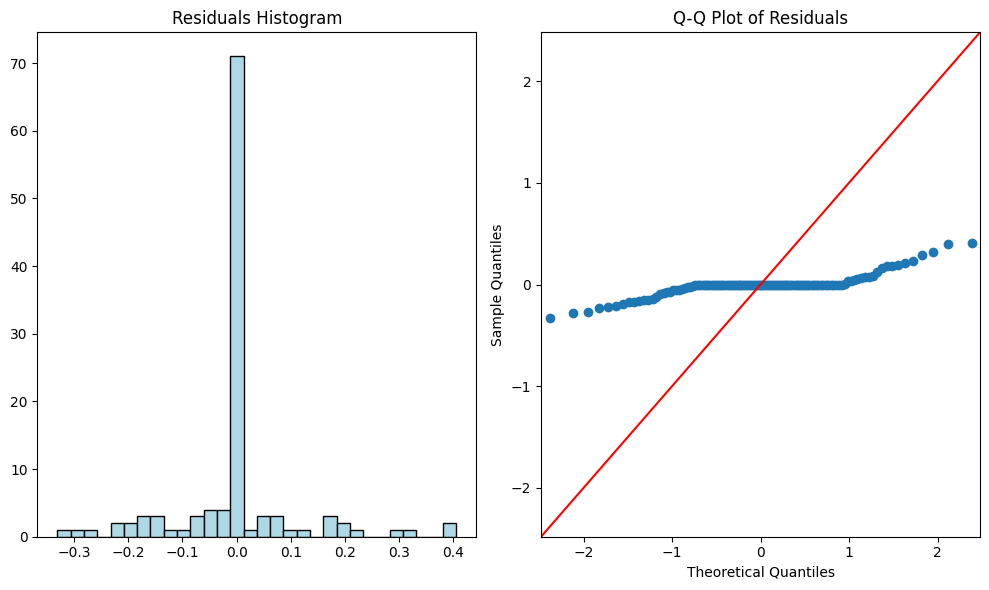

Fine-tuning SARIMA model for Staphylococcus aureus - Ceftadizime
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                 -14.133
Date:                            Sun, 24 Nov 2024   AIC                             36.266
Time:                                    07:26:24   BIC                             46.920
Sample:                                01-01-1996   HQIC                            40.584
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1

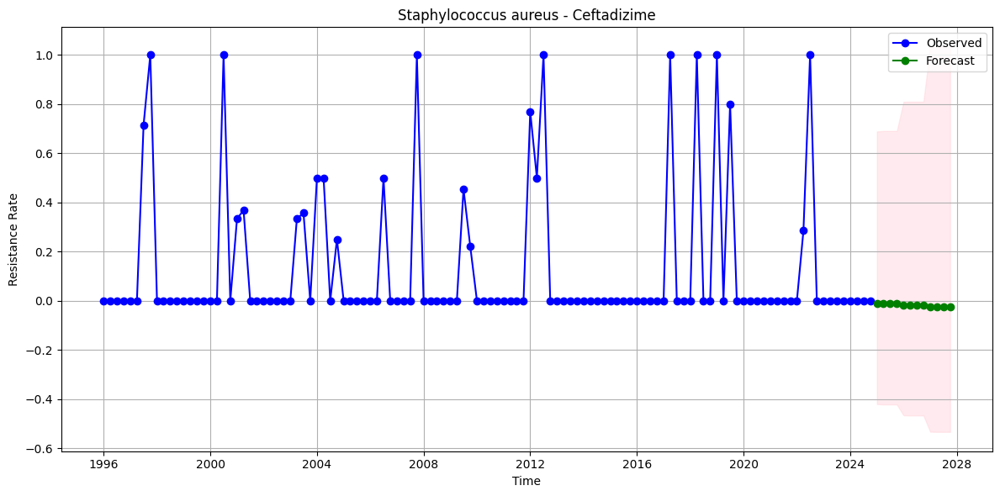

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.0002470347914905402


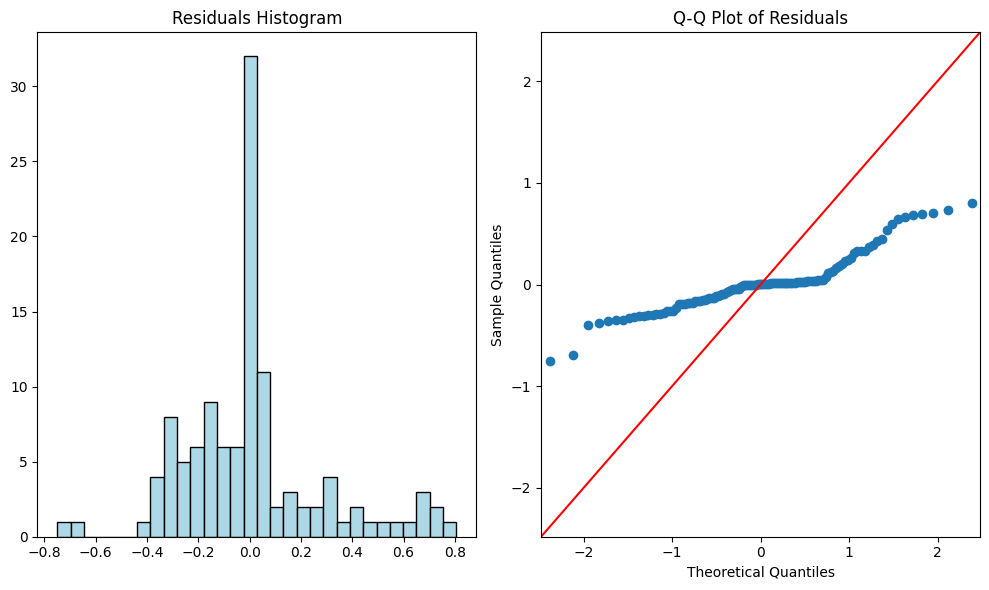

Fine-tuning SARIMA model for Staphylococcus aureus - Cefotaxime
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  -4.302
Date:                            Sun, 24 Nov 2024   AIC                             16.603
Time:                                    07:26:24   BIC                             27.257
Sample:                                01-01-1996   HQIC                            20.921
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1 

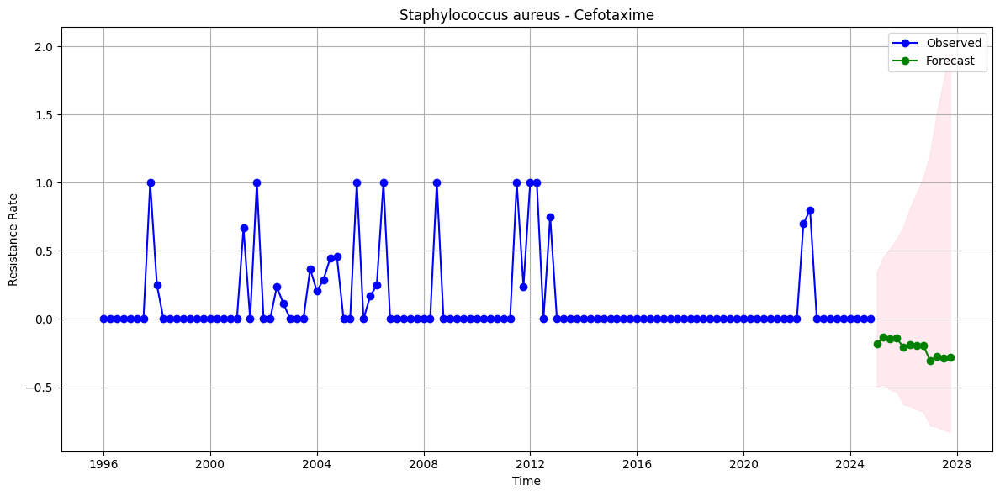

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.013183950435973878


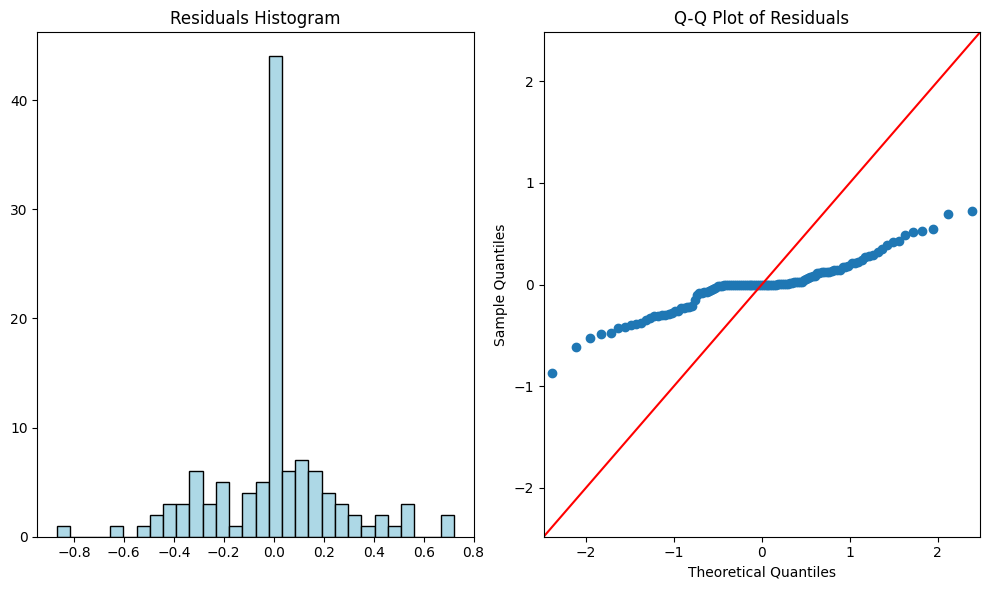

Fine-tuning SARIMA model for Staphylococcus aureus - Cefoxitin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  56.682
Date:                            Sun, 24 Nov 2024   AIC                           -105.365
Time:                                    07:26:25   BIC                            -94.711
Sample:                                01-01-1996   HQIC                          -101.047
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


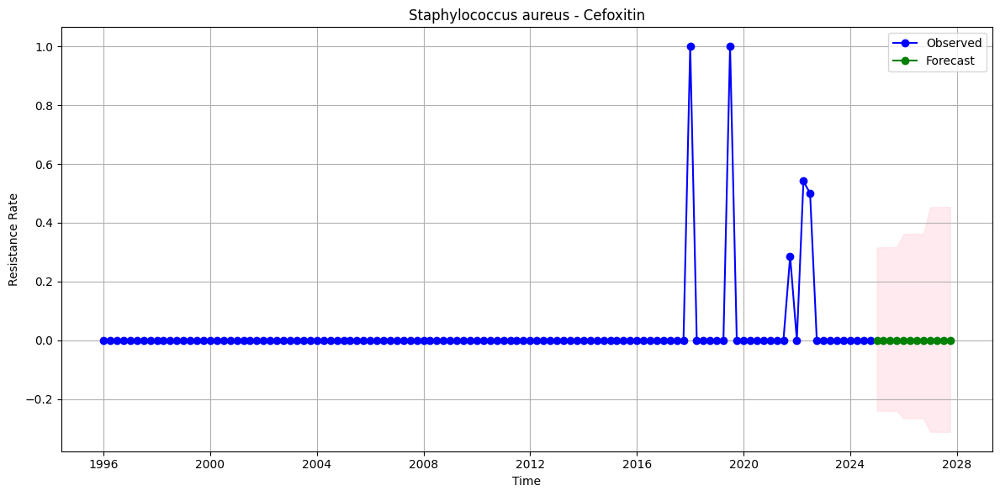

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 7.252832982151122e-194


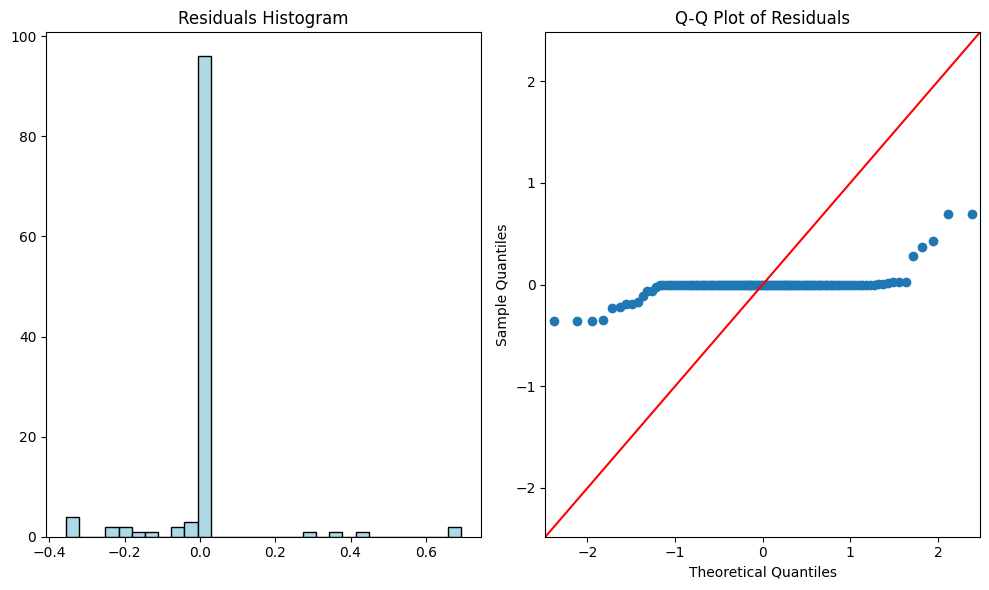

Fine-tuning SARIMA model for Staphylococcus aureus - Linezolid
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  79.552
Date:                            Sun, 24 Nov 2024   AIC                           -151.103
Time:                                    07:26:26   BIC                           -140.449
Sample:                                01-01-1996   HQIC                          -146.785
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


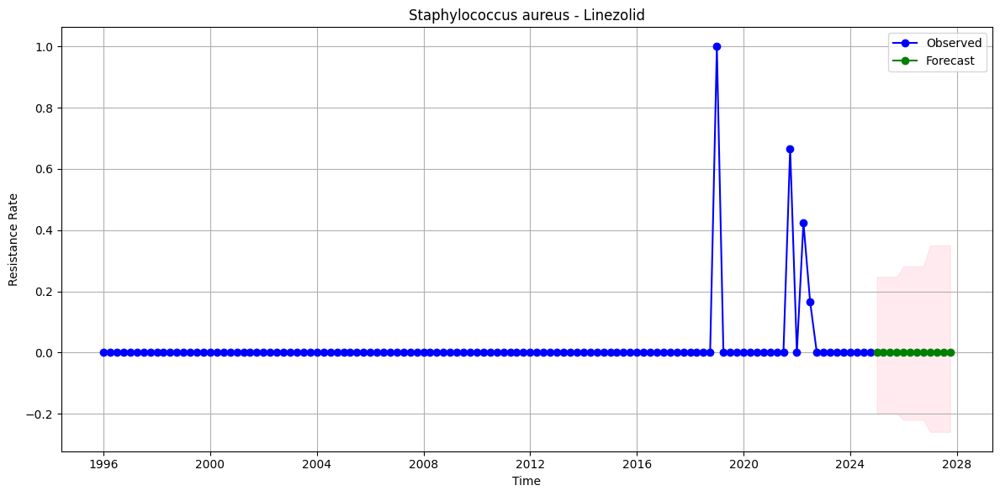

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.0


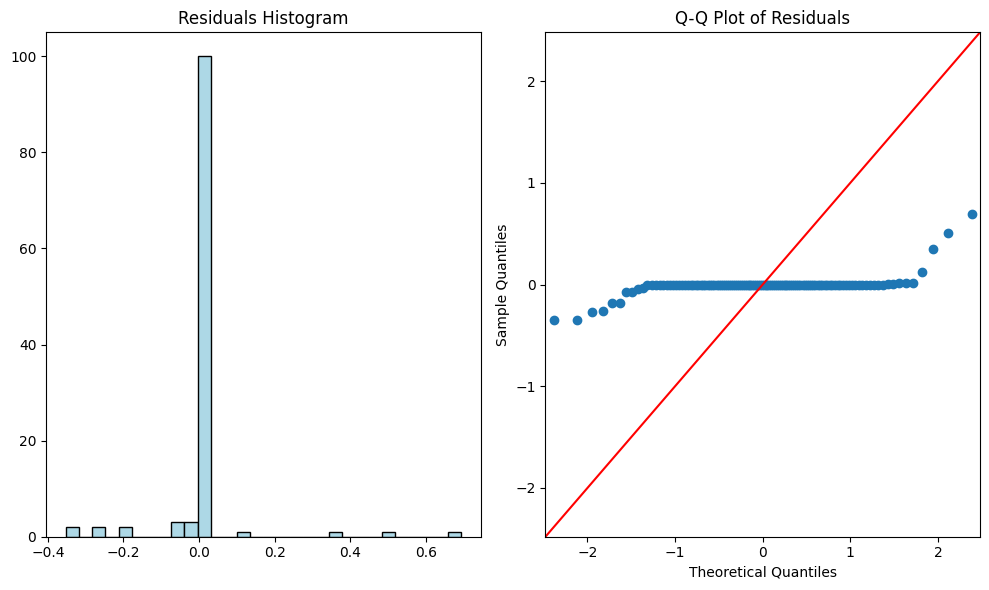

Fine-tuning SARIMA model for Staphylococcus aureus - Pefloxacin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  27.455
Date:                            Sun, 24 Nov 2024   AIC                            -46.909
Time:                                    07:26:27   BIC                            -36.256
Sample:                                01-01-1996   HQIC                           -42.591
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1 

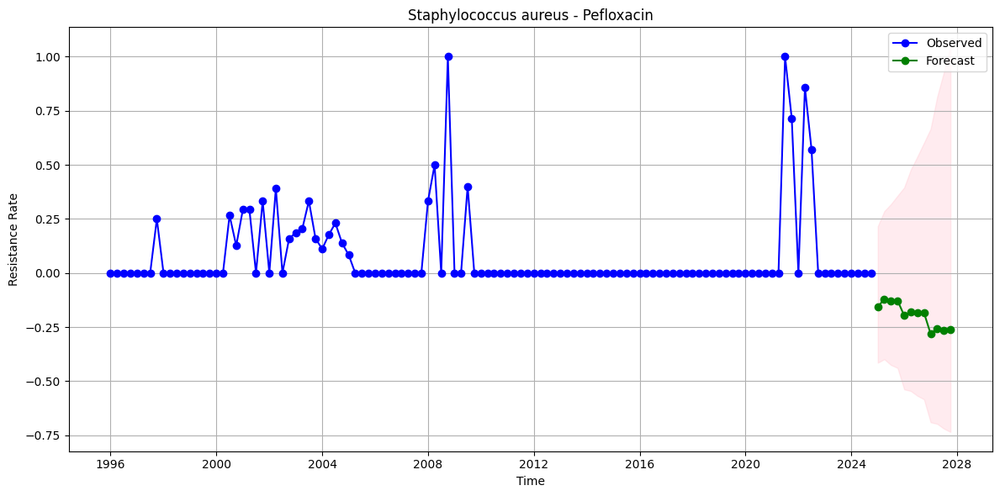

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 7.83205215358665e-10


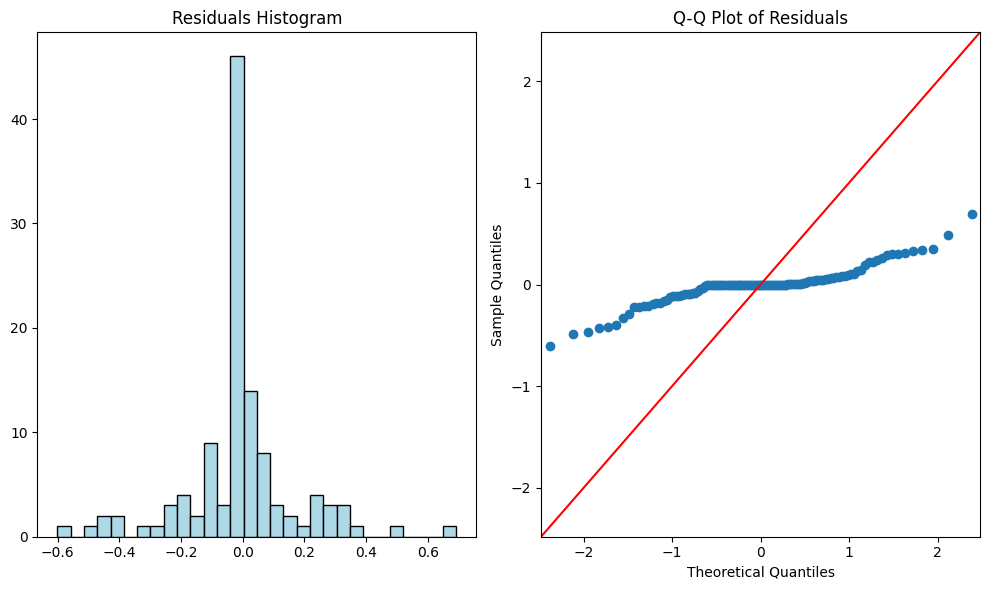

Fine-tuning SARIMA model for Staphylococcus aureus - NOR
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  62.335
Date:                            Sun, 24 Nov 2024   AIC                           -116.669
Time:                                    07:26:28   BIC                           -106.016
Sample:                                01-01-1996   HQIC                          -112.351
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1        

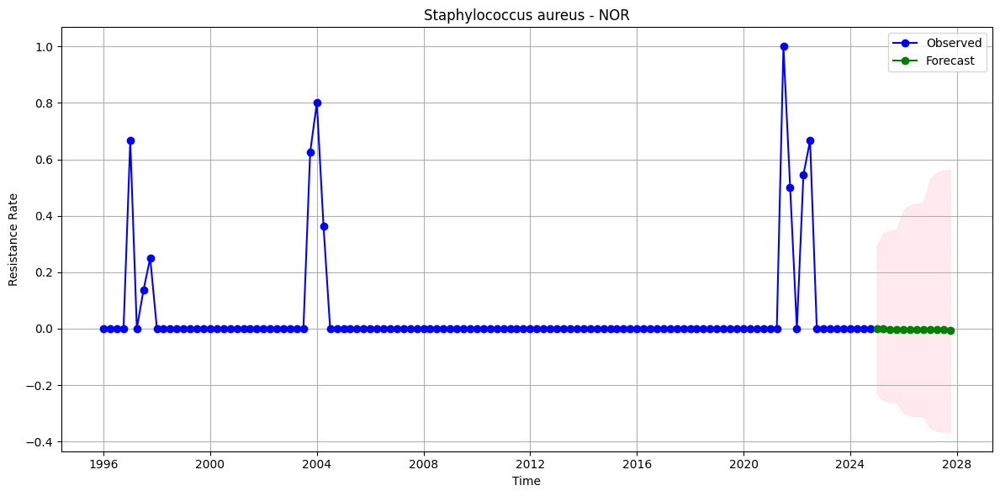

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 2.4024961791066738e-86


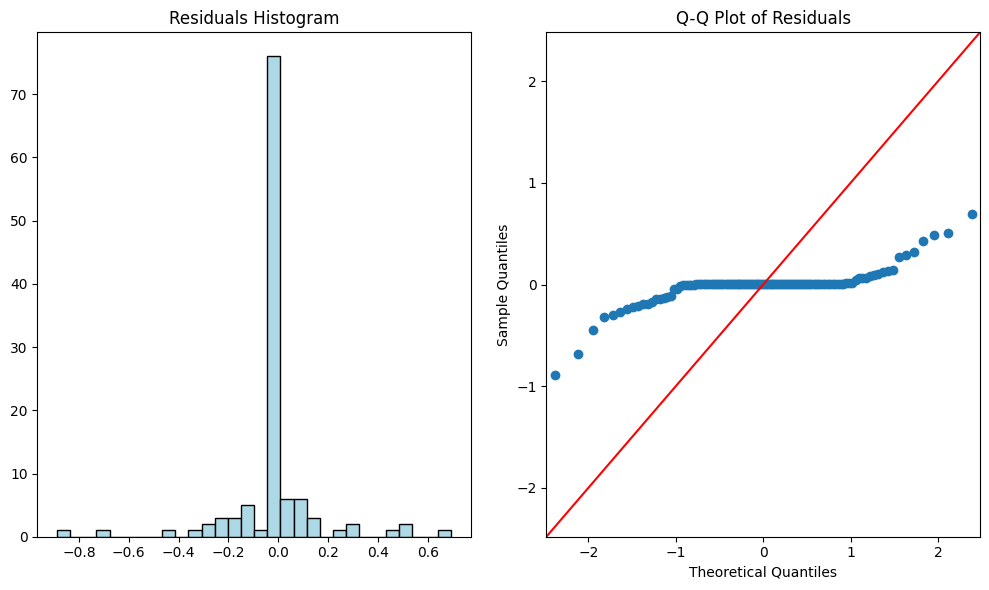

Fine-tuning SARIMA model for Escherichia coli - Amoxilin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  76.348
Date:                            Sun, 24 Nov 2024   AIC                           -144.696
Time:                                    07:26:29   BIC                           -134.398
Sample:                                04-01-1997   HQIC                          -140.532
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1        

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


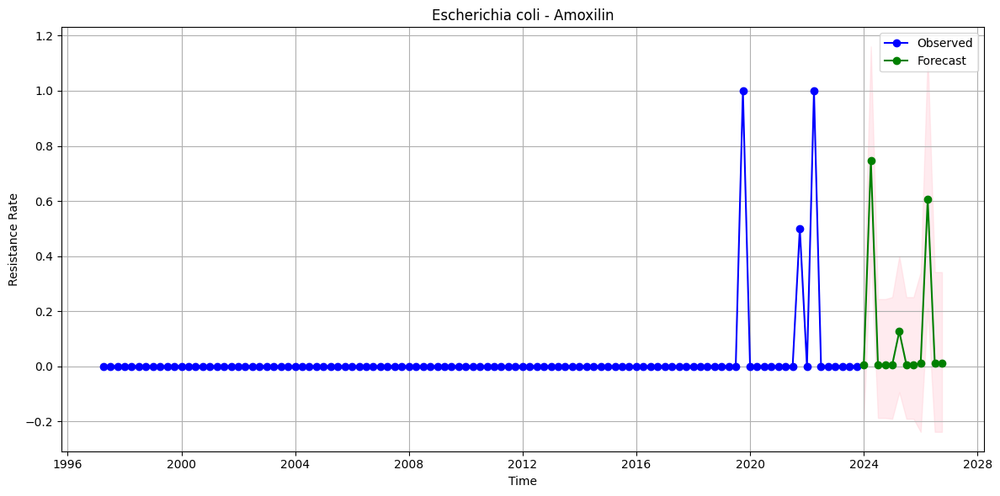

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.0


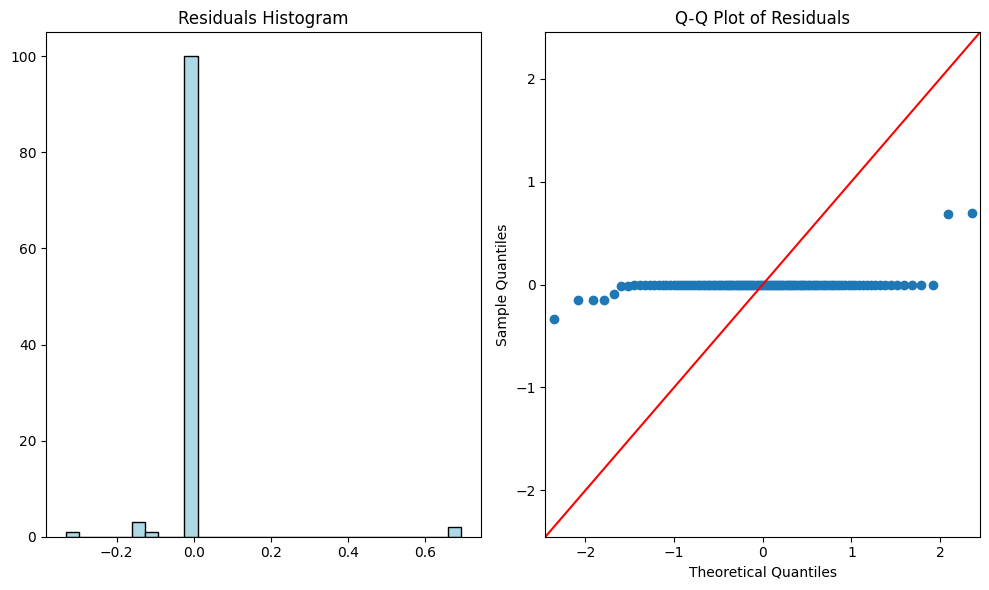

Fine-tuning SARIMA model for Escherichia coli - Amixilin-Clavulate
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  -0.387
Date:                            Sun, 24 Nov 2024   AIC                              8.774
Time:                                    07:26:30   BIC                             19.072
Sample:                                04-01-1997   HQIC                            12.938
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


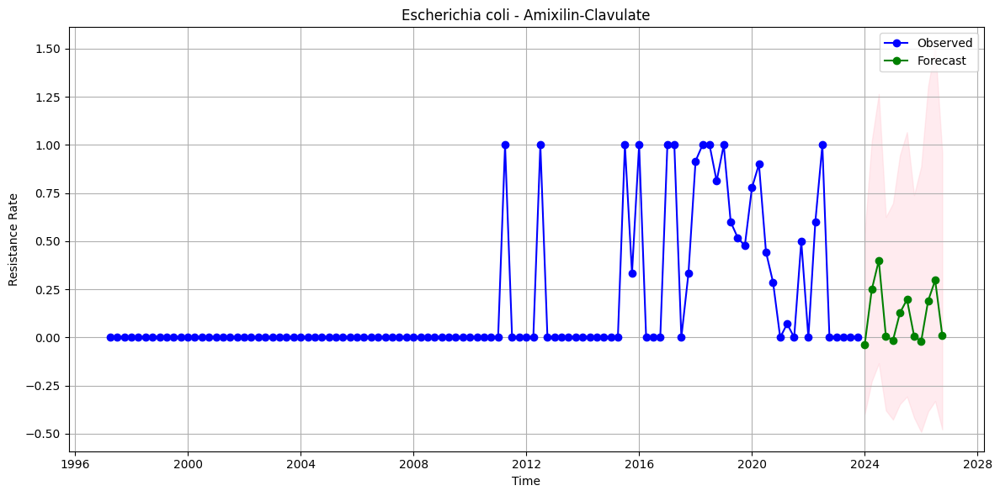

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 5.1886278341803726e-12


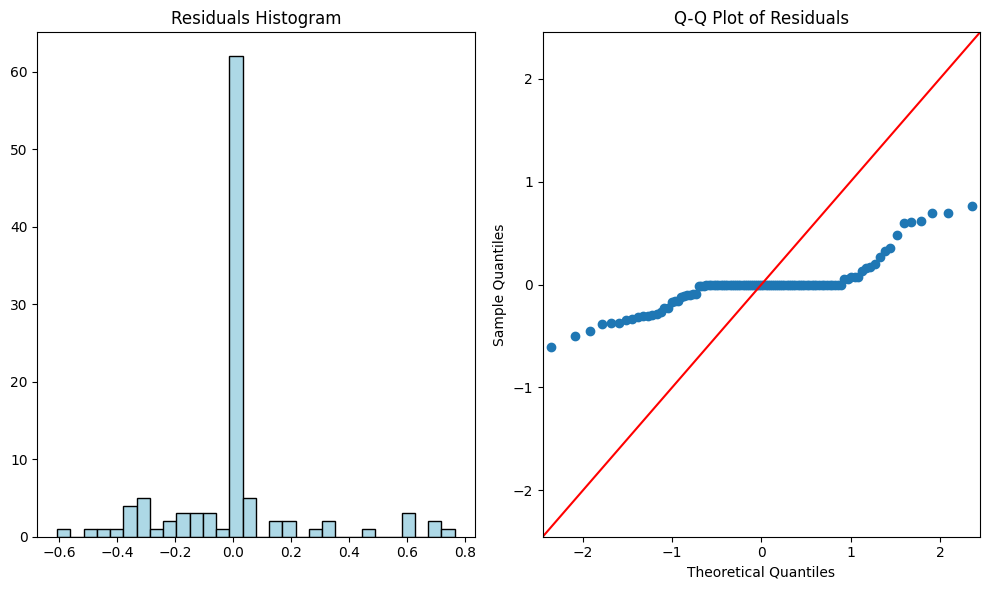

Fine-tuning SARIMA model for Escherichia coli - Ampicillin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                 -38.879
Date:                            Sun, 24 Nov 2024   AIC                             85.759
Time:                                    07:26:31   BIC                             96.058
Sample:                                04-01-1997   HQIC                            89.923
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1      

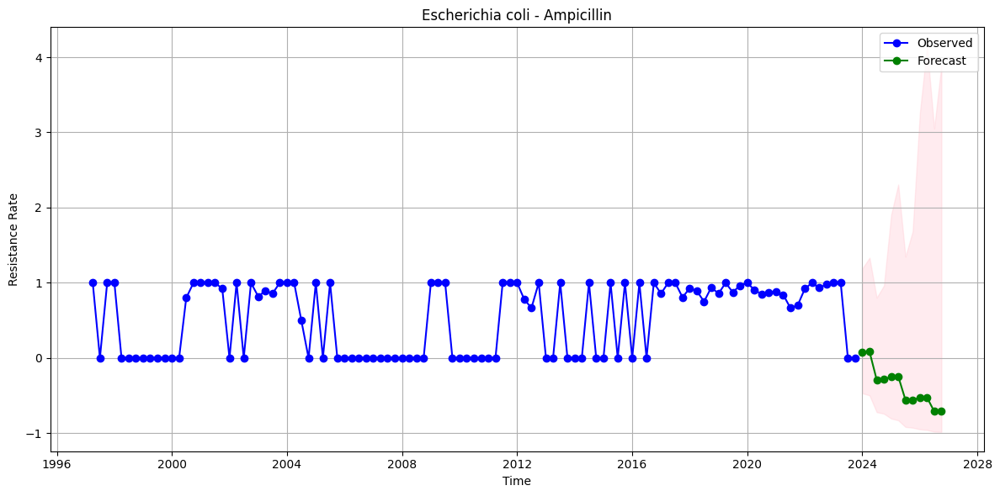

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.3664409900112904


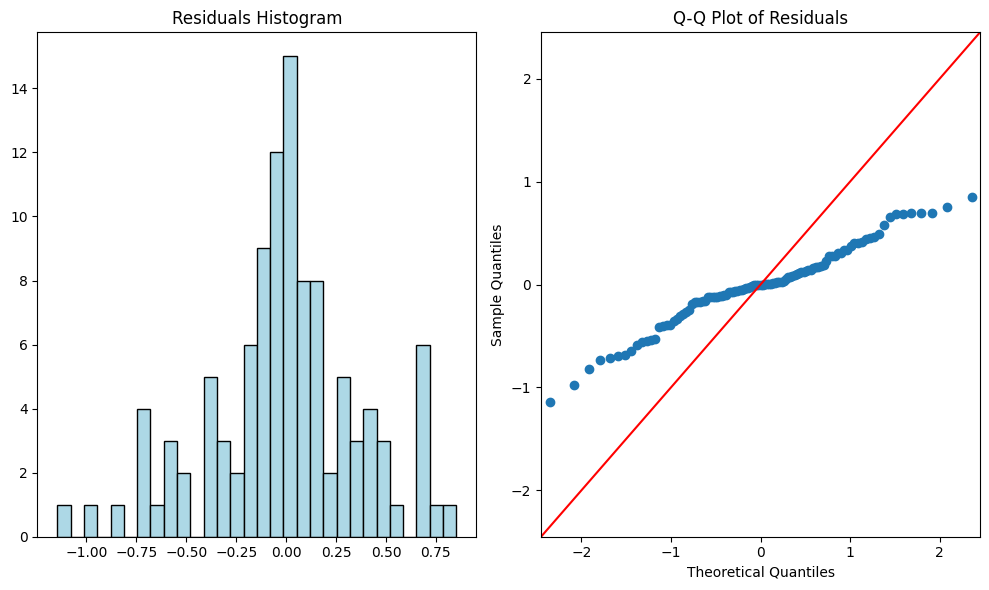

Fine-tuning SARIMA model for Escherichia coli - Azithromycin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  69.065
Date:                            Sun, 24 Nov 2024   AIC                           -130.129
Time:                                    07:26:33   BIC                           -119.830
Sample:                                04-01-1997   HQIC                          -125.965
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1    

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


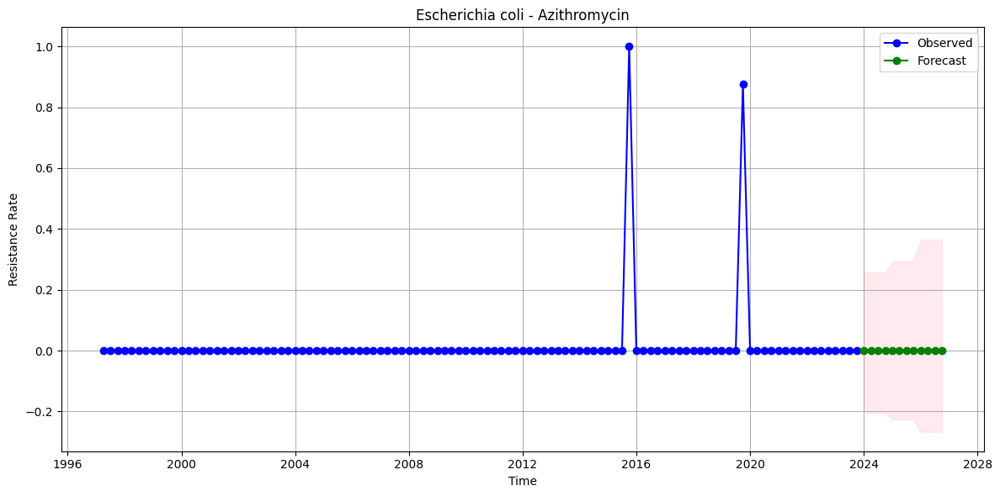

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.0


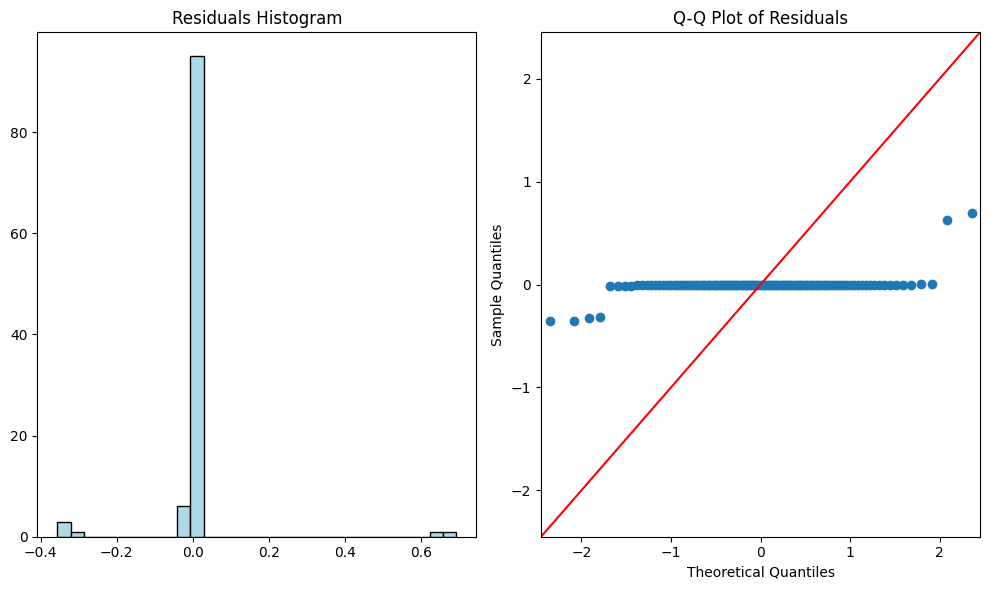

Fine-tuning SARIMA model for Escherichia coli - Ceftriaxone
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  16.953
Date:                            Sun, 24 Nov 2024   AIC                            -25.906
Time:                                    07:26:34   BIC                            -15.607
Sample:                                04-01-1997   HQIC                           -21.741
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1     

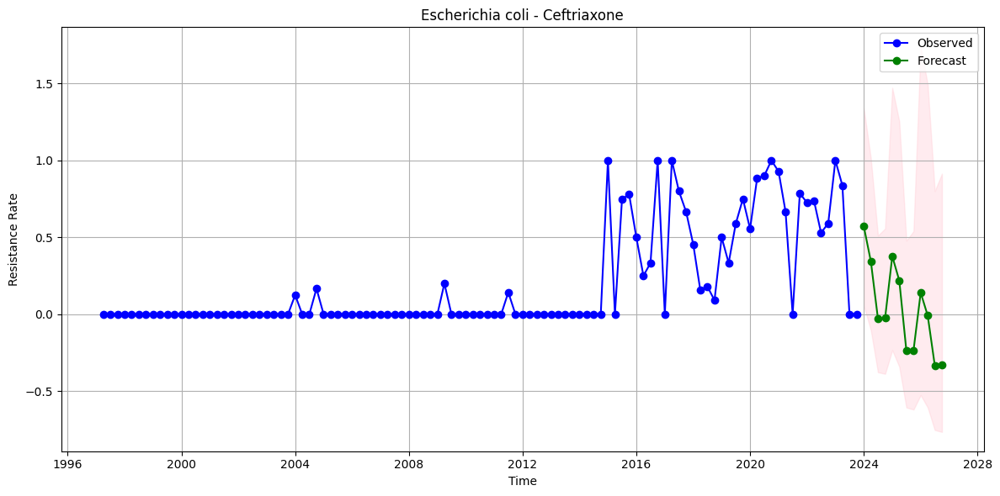

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 7.823069635521284e-27


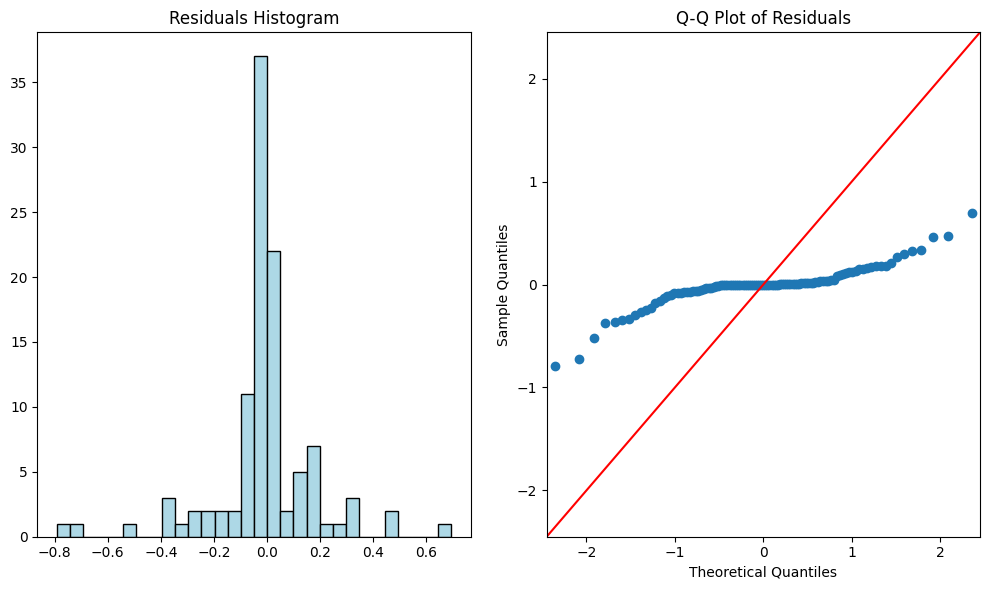

Fine-tuning SARIMA model for Escherichia coli - Cefuroxime
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  27.830
Date:                            Sun, 24 Nov 2024   AIC                            -47.661
Time:                                    07:26:35   BIC                            -37.362
Sample:                                04-01-1997   HQIC                           -43.496
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


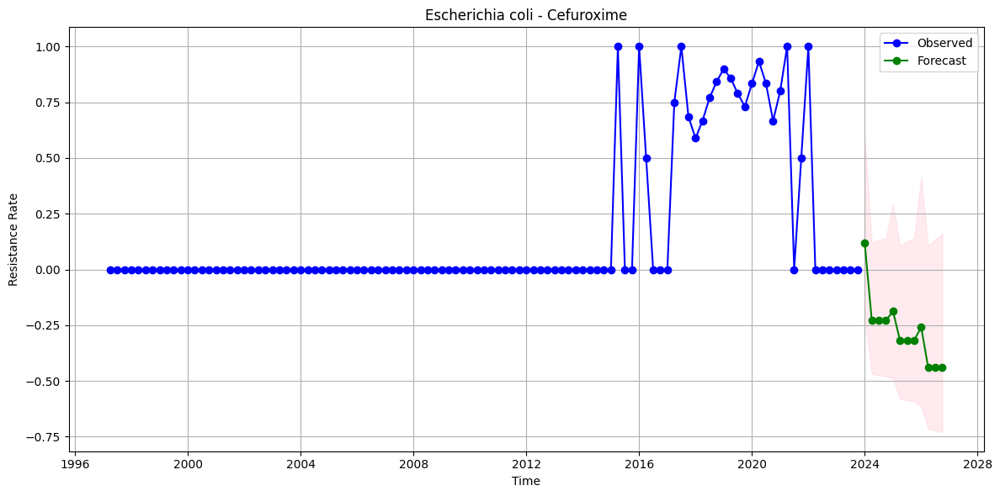

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 1.0737209895554512e-61


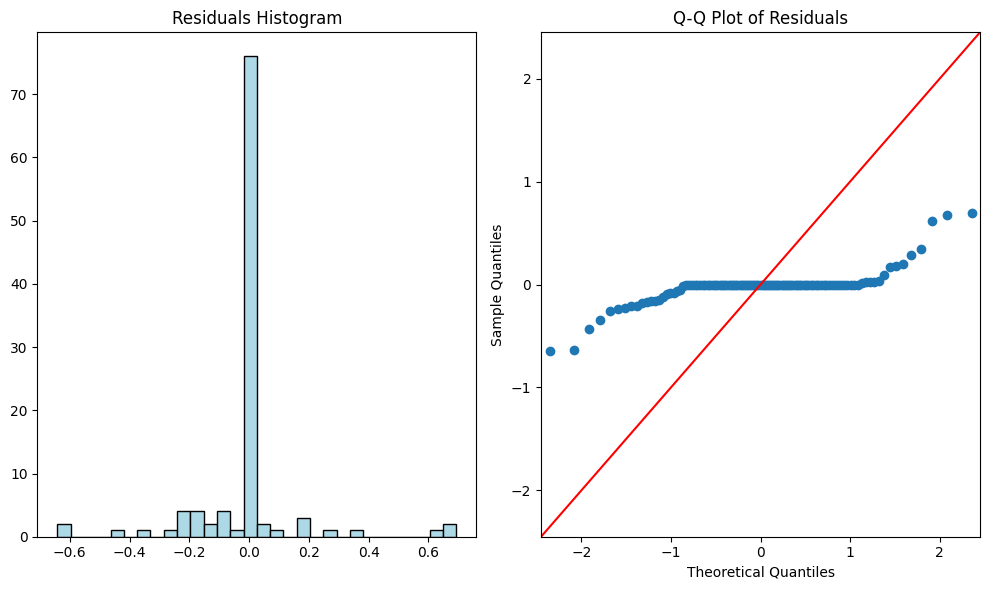

Fine-tuning SARIMA model for Escherichia coli - Ciprofloxacin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                   4.928
Date:                            Sun, 24 Nov 2024   AIC                             -1.856
Time:                                    07:26:36   BIC                              8.443
Sample:                                04-01-1997   HQIC                             2.308
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1   

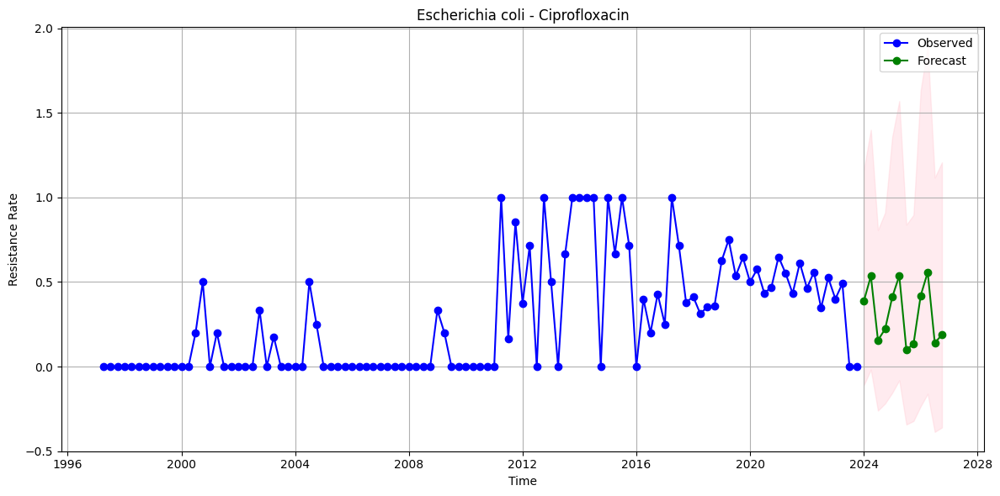

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 1.50408834050322e-11


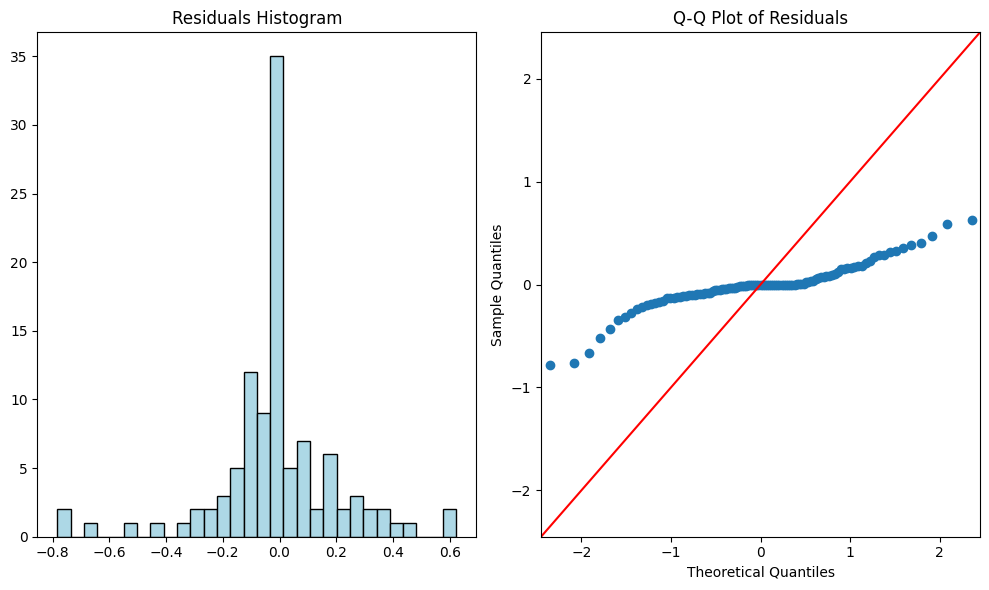

Fine-tuning SARIMA model for Escherichia coli - Oxacillin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  18.348
Date:                            Sun, 24 Nov 2024   AIC                            -28.696
Time:                                    07:26:36   BIC                            -18.398
Sample:                                04-01-1997   HQIC                           -24.532
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


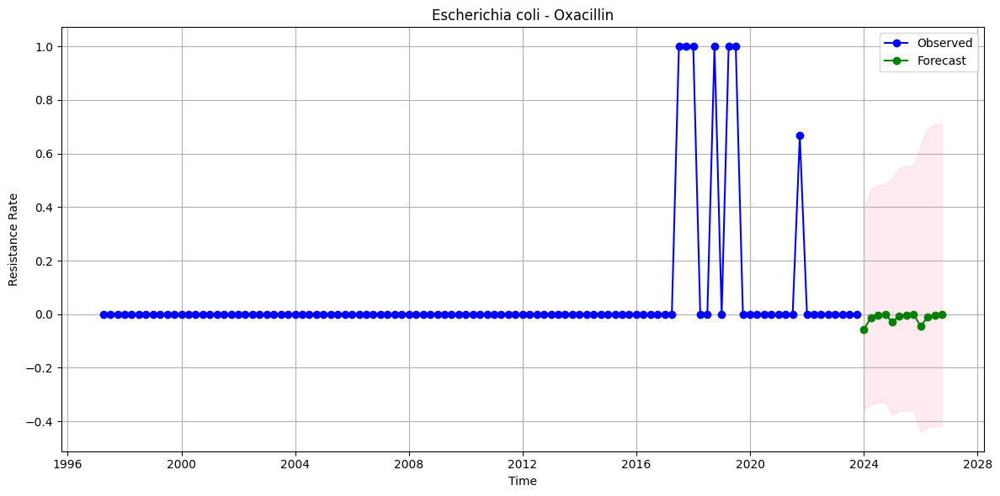

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 1.69790862590815e-53


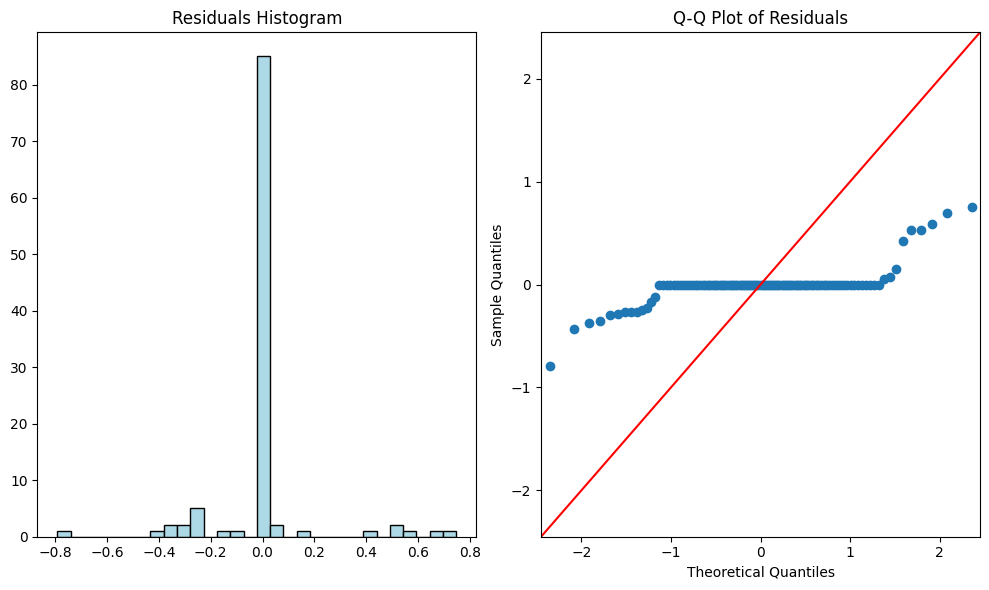

Fine-tuning SARIMA model for Escherichia coli - Chloramphenicol
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                 -28.043
Date:                            Sun, 24 Nov 2024   AIC                             64.086
Time:                                    07:26:37   BIC                             74.385
Sample:                                04-01-1997   HQIC                            68.250
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1 

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


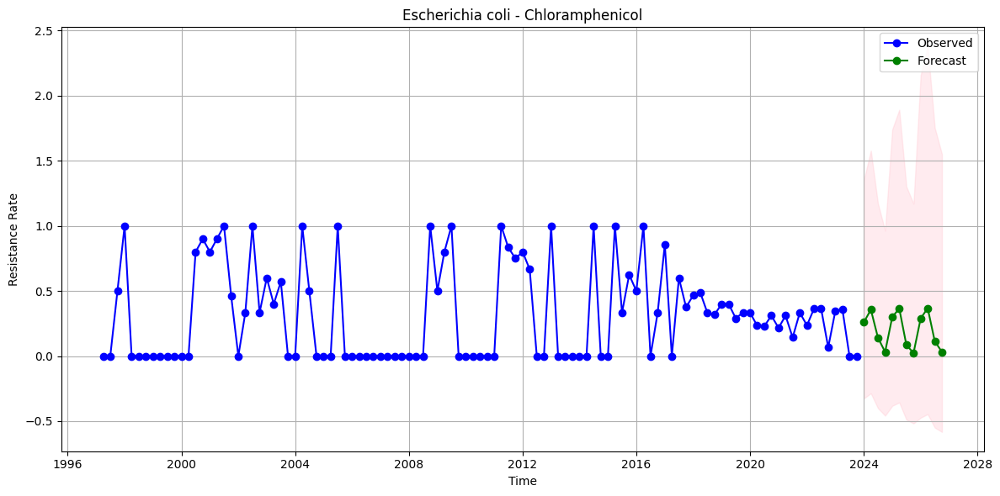

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.6434376153957455


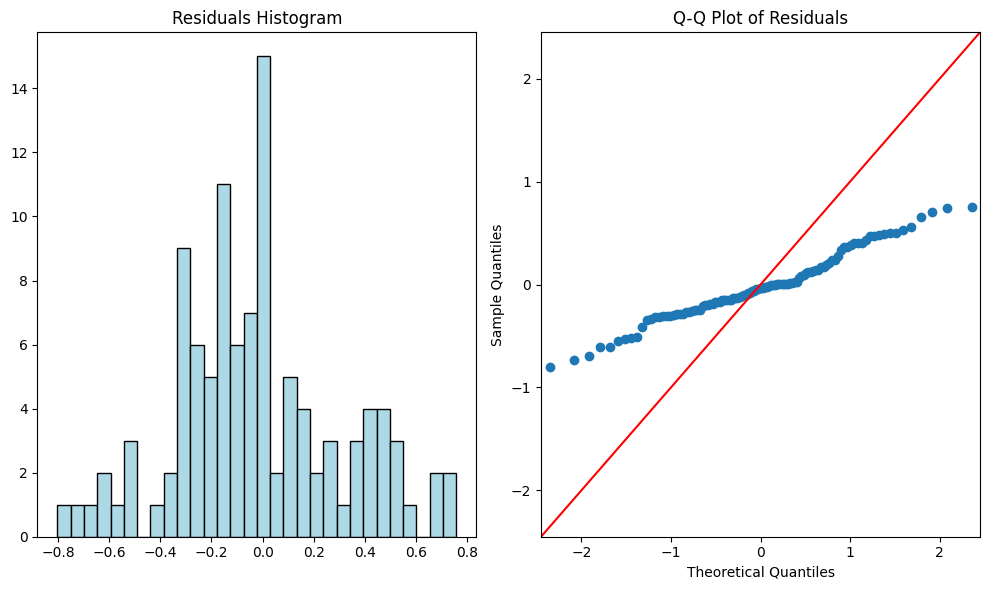

Fine-tuning SARIMA model for Escherichia coli - Clindamycin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  25.141
Date:                            Sun, 24 Nov 2024   AIC                            -42.283
Time:                                    07:26:38   BIC                            -31.984
Sample:                                04-01-1997   HQIC                           -38.118
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


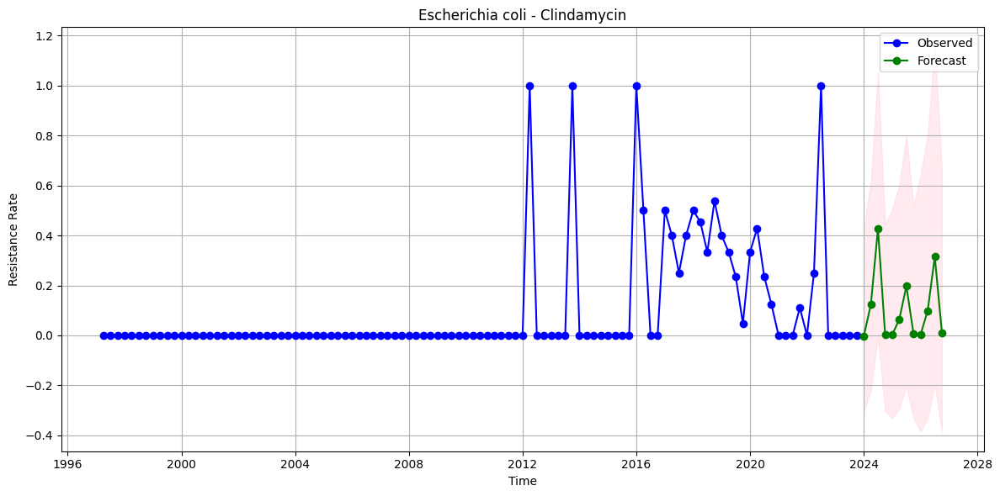

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 2.7185907689032997e-57


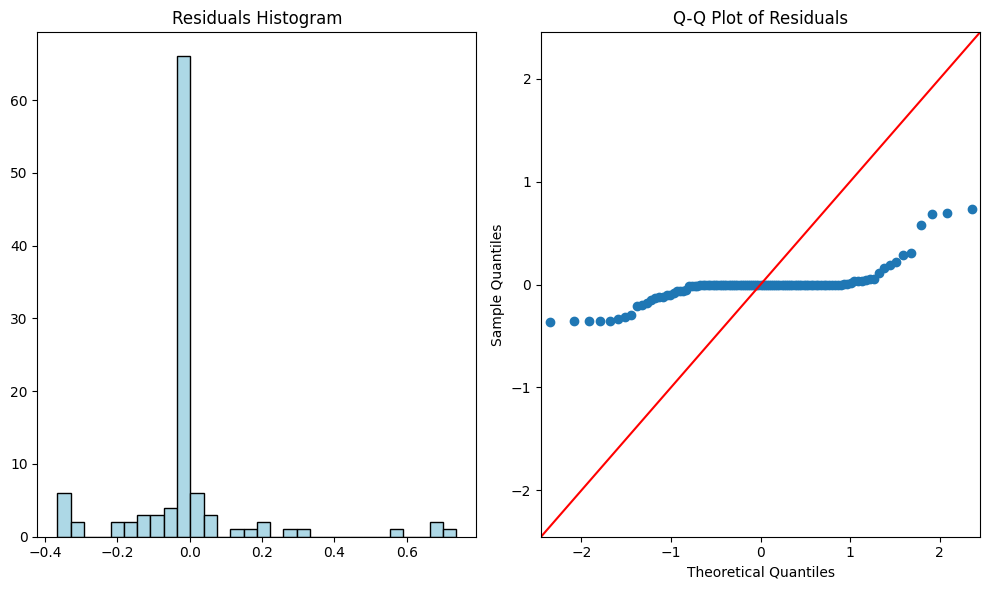

Fine-tuning SARIMA model for Escherichia coli - Gentamycin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                   5.971
Date:                            Sun, 24 Nov 2024   AIC                             -3.942
Time:                                    07:26:39   BIC                              6.356
Sample:                                04-01-1997   HQIC                             0.222
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1      

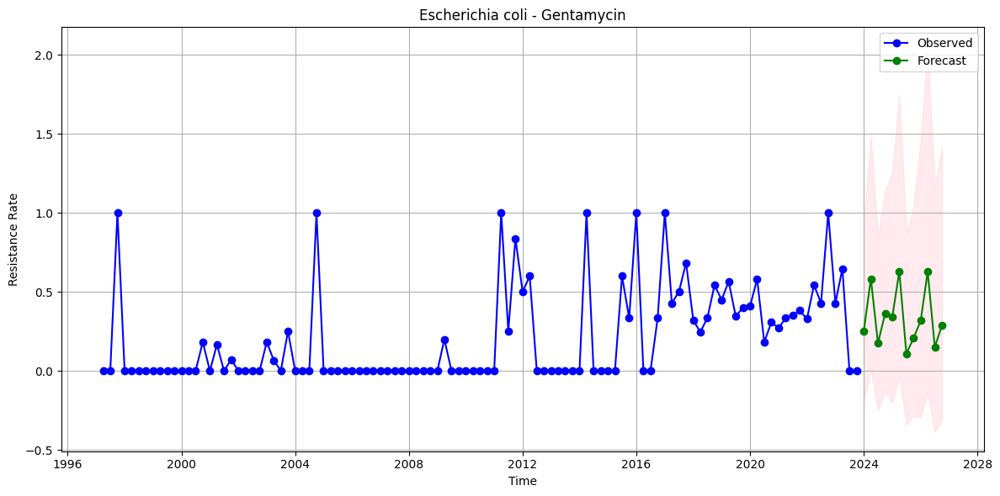

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.00544675596407156


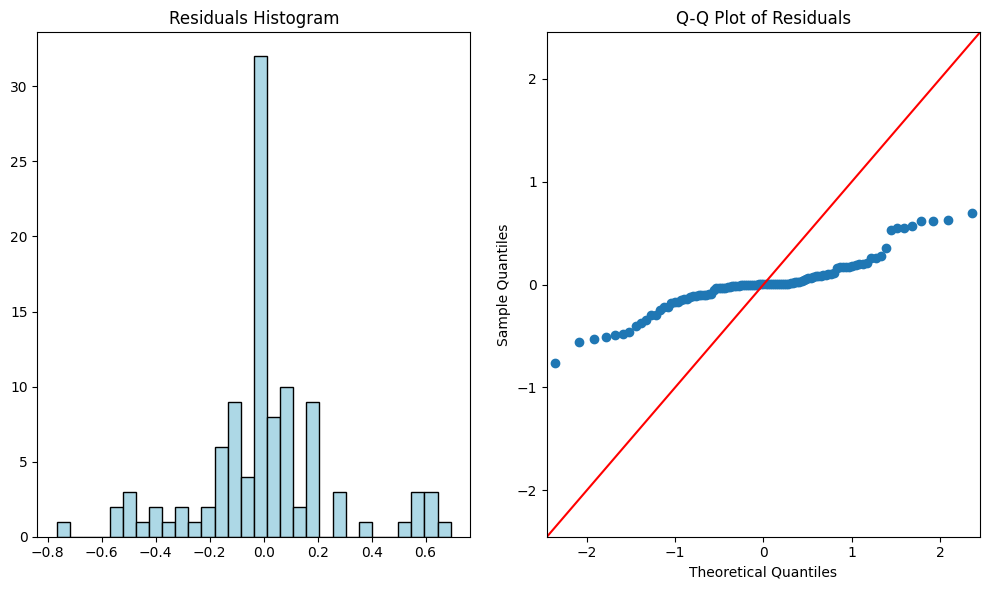

Fine-tuning SARIMA model for Escherichia coli - Erythromycin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  -9.363
Date:                            Sun, 24 Nov 2024   AIC                             26.726
Time:                                    07:26:40   BIC                             37.025
Sample:                                04-01-1997   HQIC                            30.890
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1    

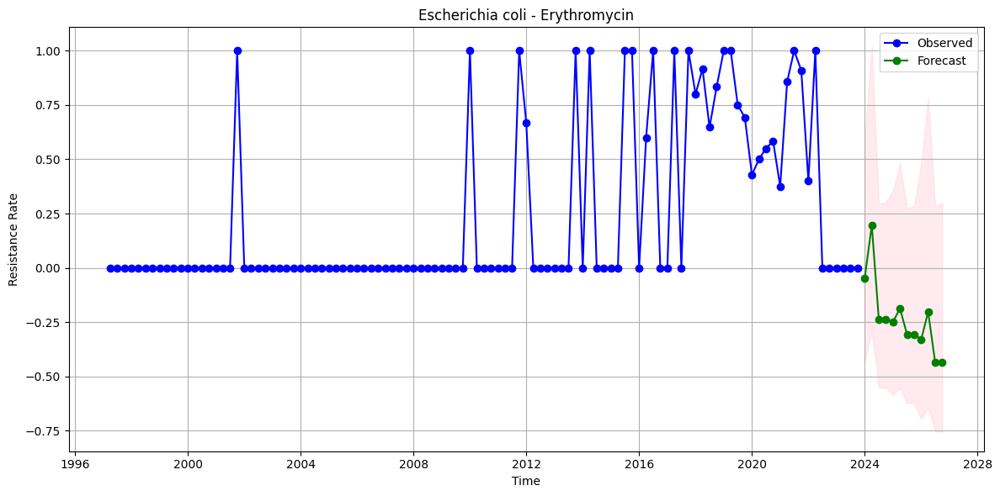

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 1.0527996271531793e-06


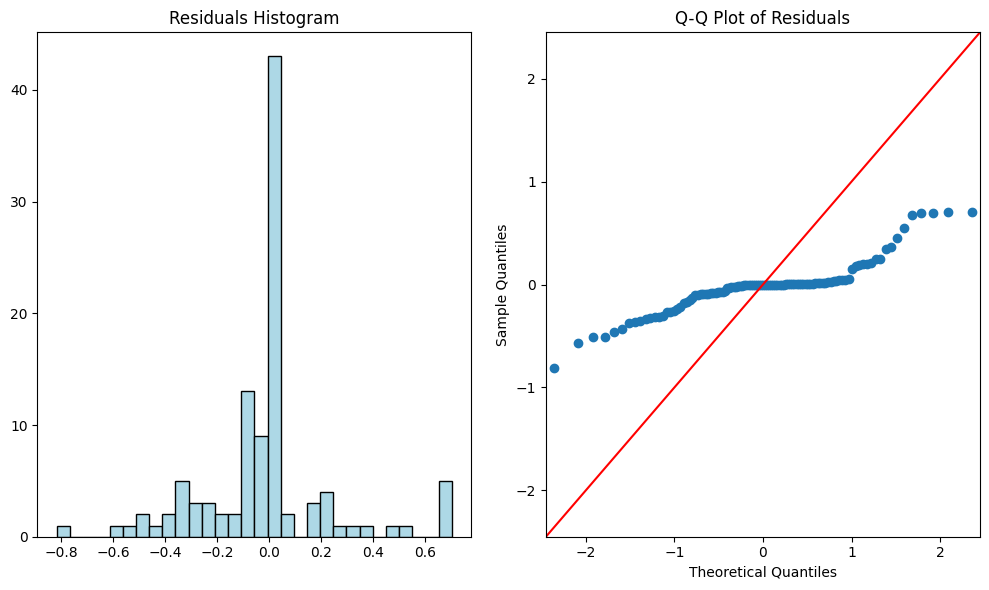

Fine-tuning SARIMA model for Escherichia coli - Tetracycline
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                 -28.173
Date:                            Sun, 24 Nov 2024   AIC                             64.345
Time:                                    07:26:41   BIC                             74.644
Sample:                                04-01-1997   HQIC                            68.509
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1    

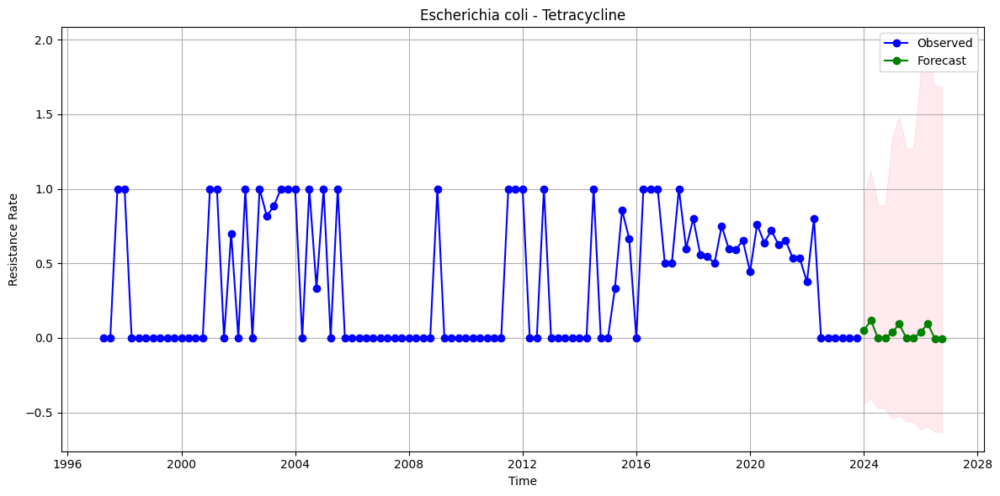

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.7834817017255058


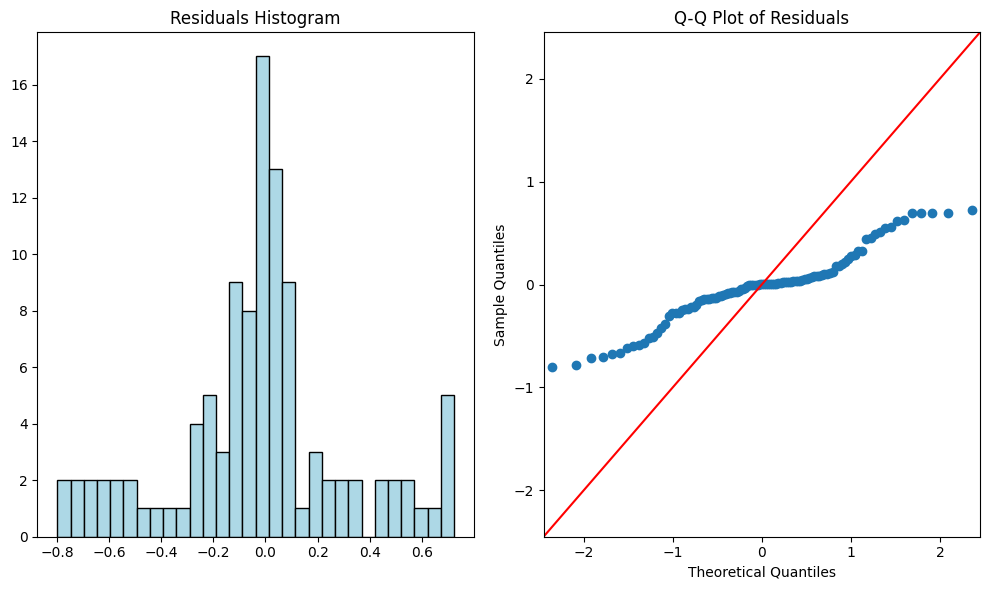

Fine-tuning SARIMA model for Escherichia coli - Trimethoprim
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                 -35.313
Date:                            Sun, 24 Nov 2024   AIC                             78.627
Time:                                    07:26:42   BIC                             88.926
Sample:                                04-01-1997   HQIC                            82.791
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1    

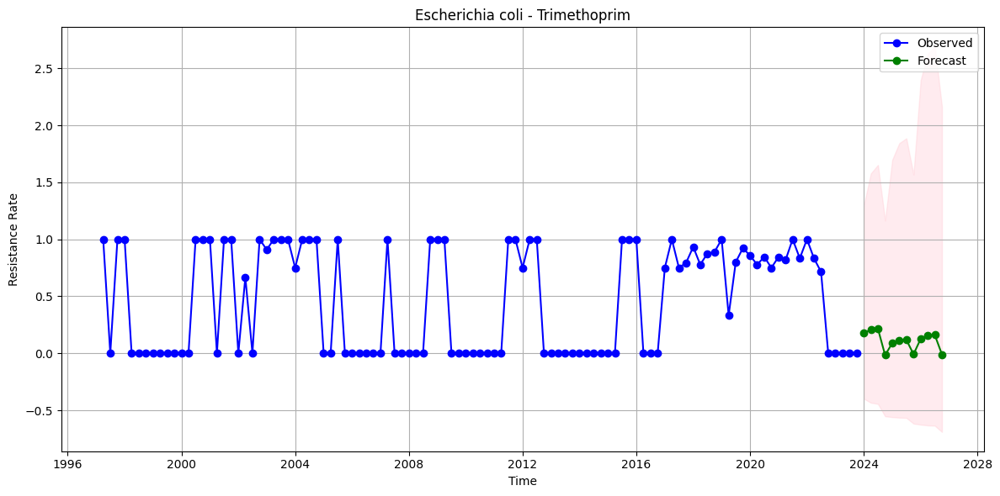

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.822051551552403


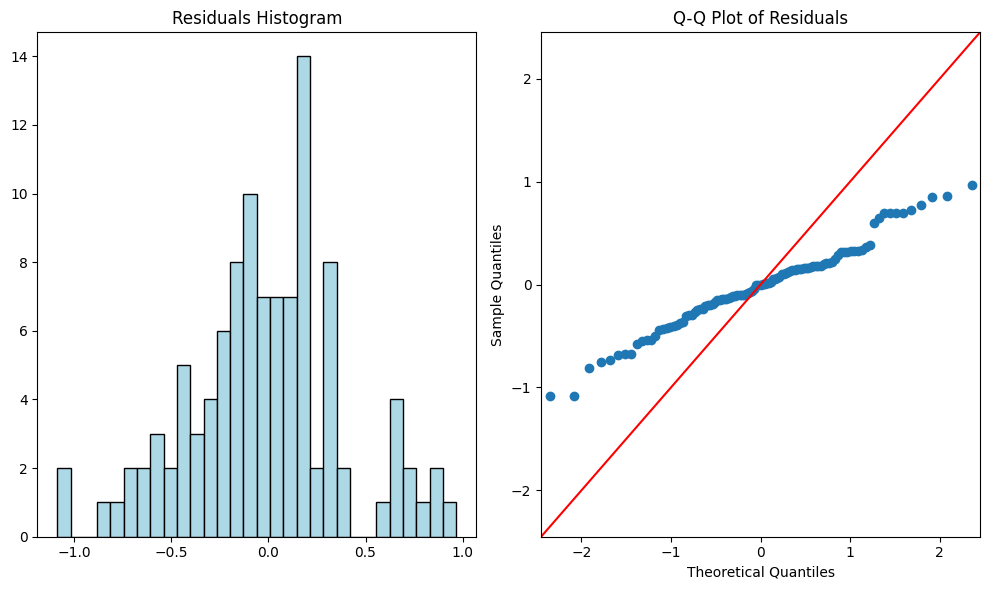

Fine-tuning SARIMA model for Escherichia coli - Vancomycin
Applied Logarithmic transformation (log1p).


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  67.938
Date:                            Sun, 24 Nov 2024   AIC                           -127.877
Time:                                    07:26:43   BIC                           -117.578
Sample:                                04-01-1997   HQIC                          -123.712
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3713      0.425     -0.873      0.383      -1.205       0.462
ma.L1          4.7214      9.501   

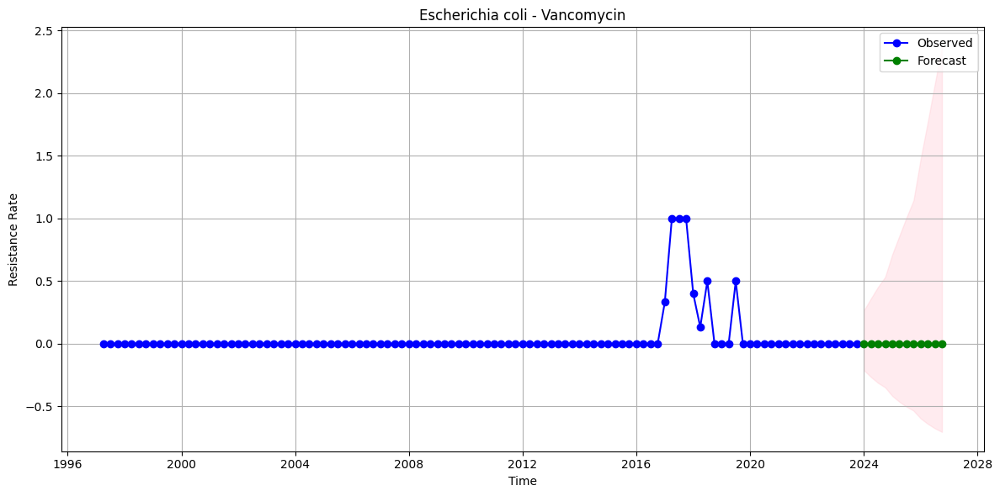

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 4.403571809744776e-87


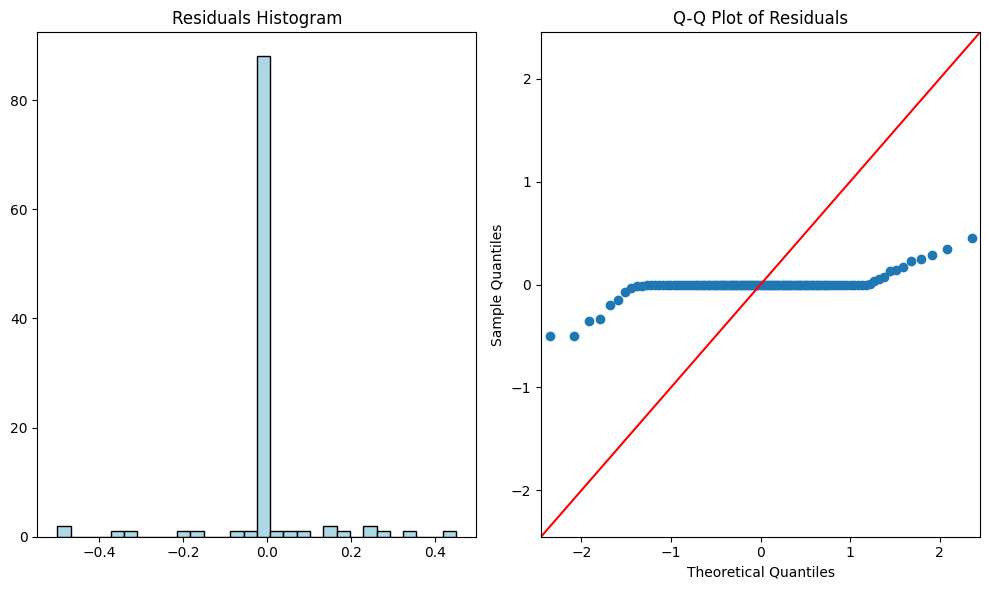

Fine-tuning SARIMA model for Escherichia coli - Penicillin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                 -15.239
Date:                            Sun, 24 Nov 2024   AIC                             38.479
Time:                                    07:26:45   BIC                             48.777
Sample:                                04-01-1997   HQIC                            42.643
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1      

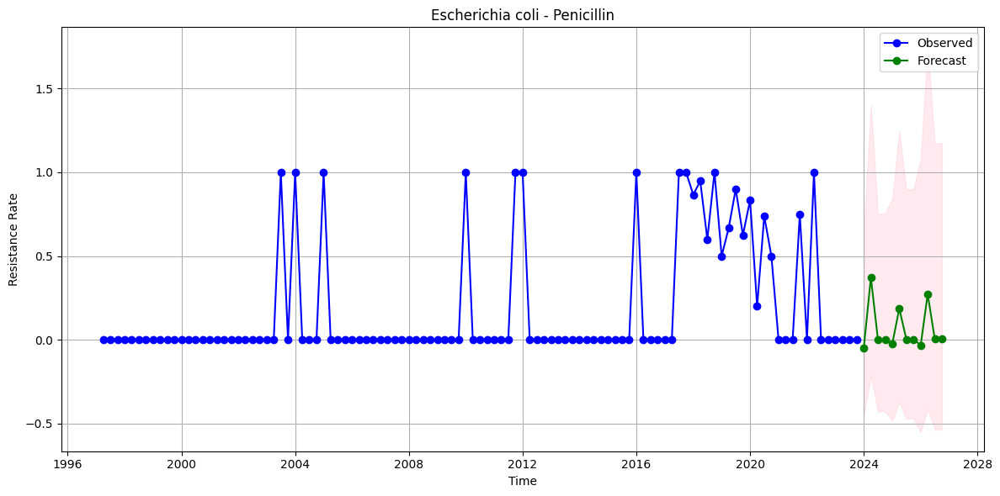

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 4.9403401366200835e-05


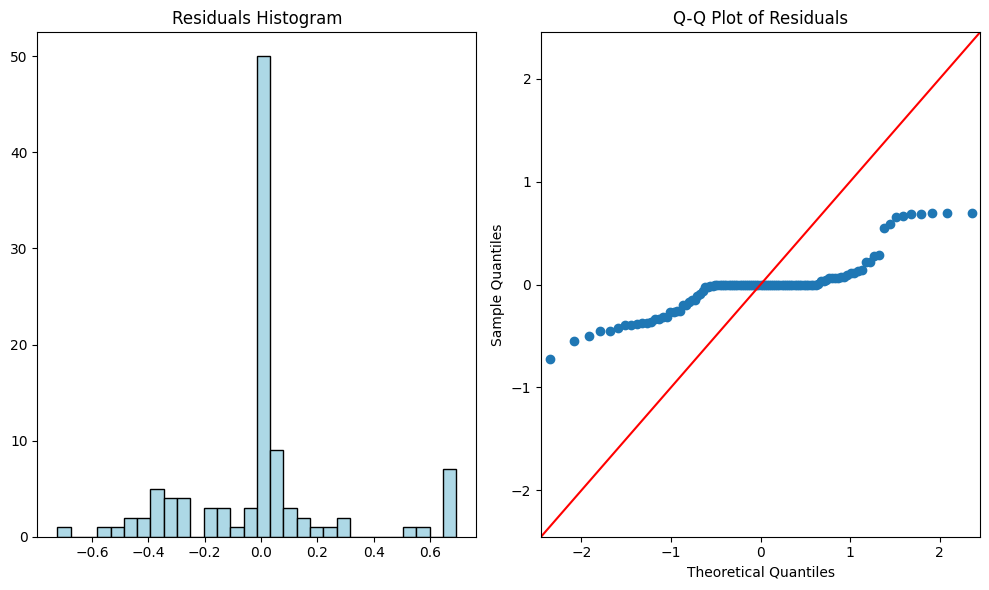

Fine-tuning SARIMA model for Escherichia coli - Imipenem
Applied Logarithmic transformation (log1p).


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  60.070
Date:                            Sun, 24 Nov 2024   AIC                           -112.141
Time:                                    07:26:46   BIC                           -101.842
Sample:                                04-01-1997   HQIC                          -107.976
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5504      0.070      7.880      0.000       0.413       0.687
ma.L1         -1.0000    152.819   

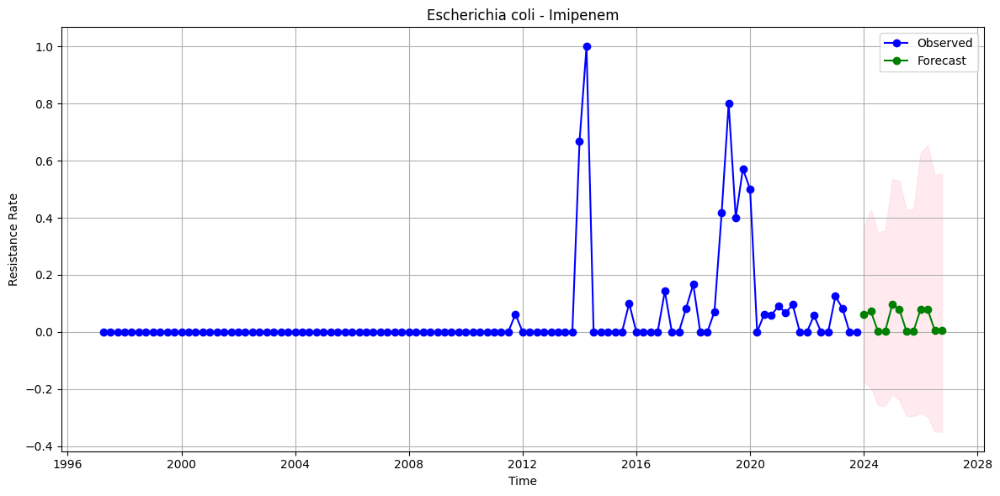

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 4.572441894158528e-46


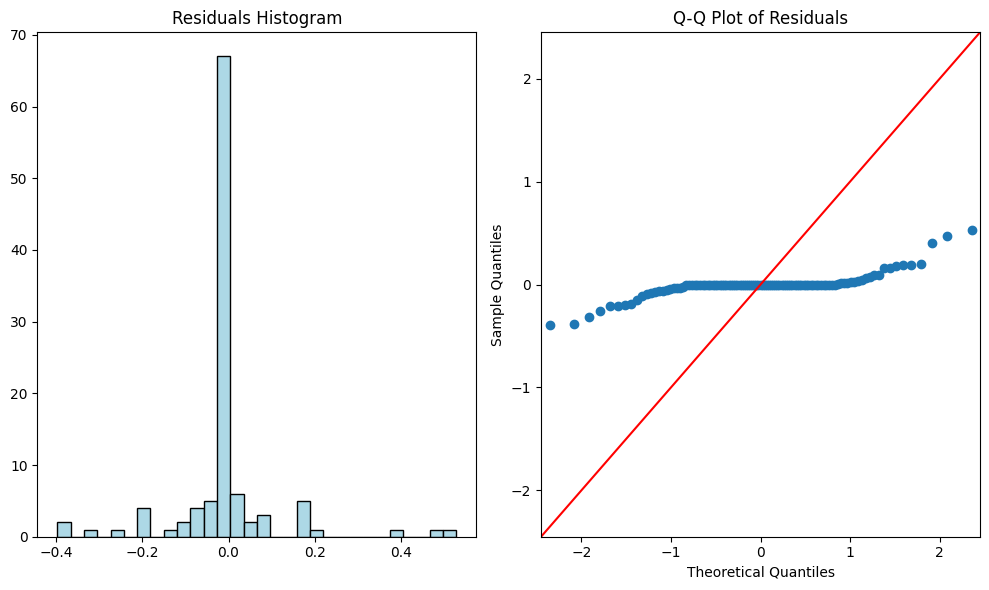

Fine-tuning SARIMA model for Escherichia coli - Ceftadizime
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  16.869
Date:                            Sun, 24 Nov 2024   AIC                            -25.737
Time:                                    07:26:47   BIC                            -15.439
Sample:                                04-01-1997   HQIC                           -21.573
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1     

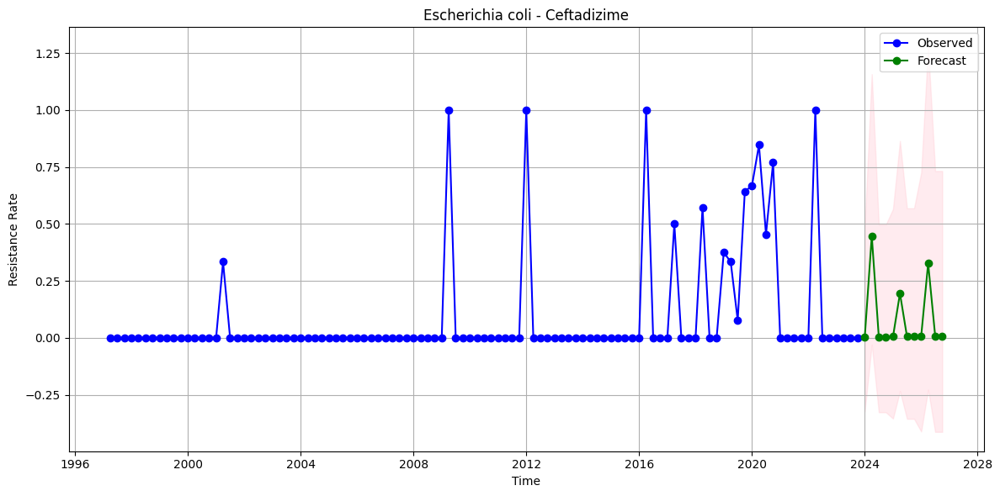

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 3.4030104588140417e-22


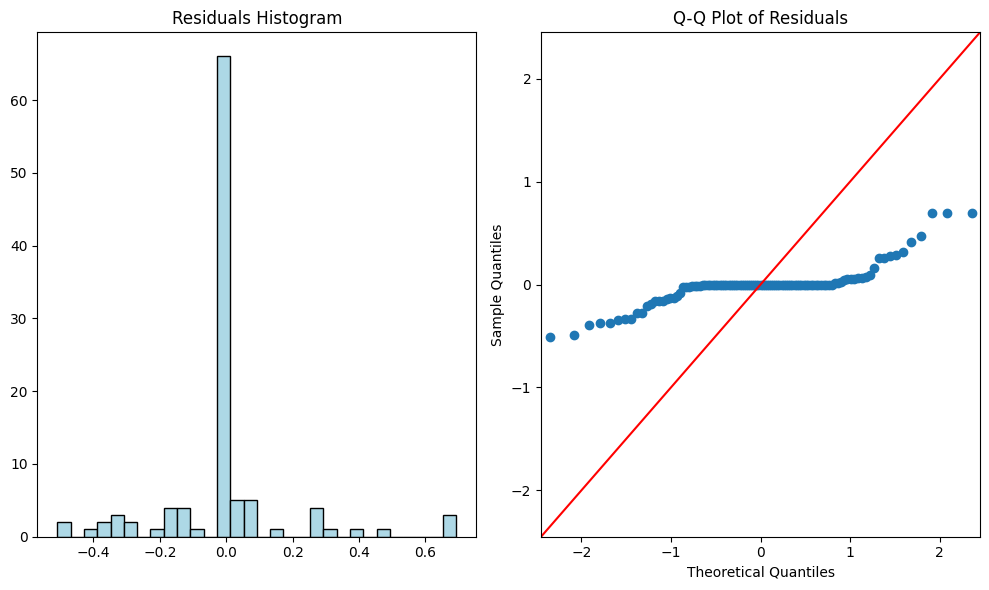

Fine-tuning SARIMA model for Escherichia coli - Cefotaxime
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  21.078
Date:                            Sun, 24 Nov 2024   AIC                            -34.156
Time:                                    07:26:48   BIC                            -23.857
Sample:                                04-01-1997   HQIC                           -29.992
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1      

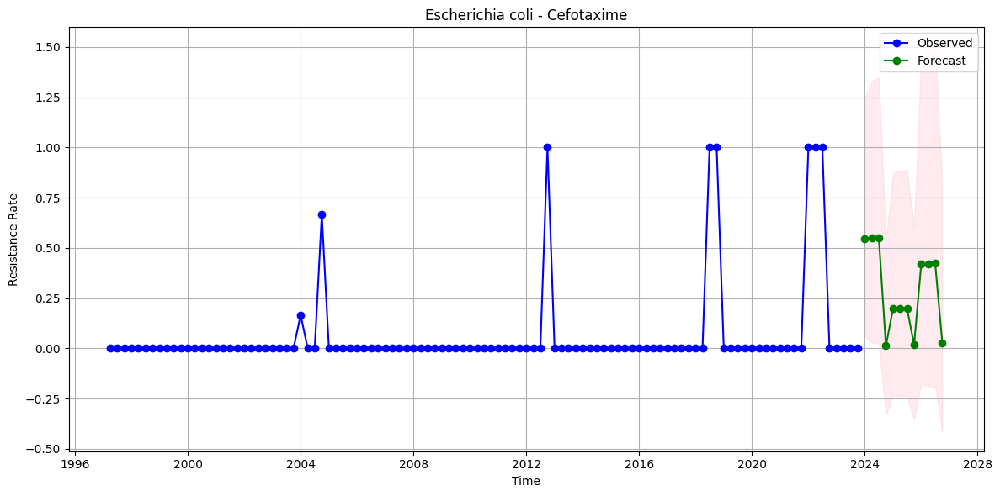

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 2.8997764857189367e-32


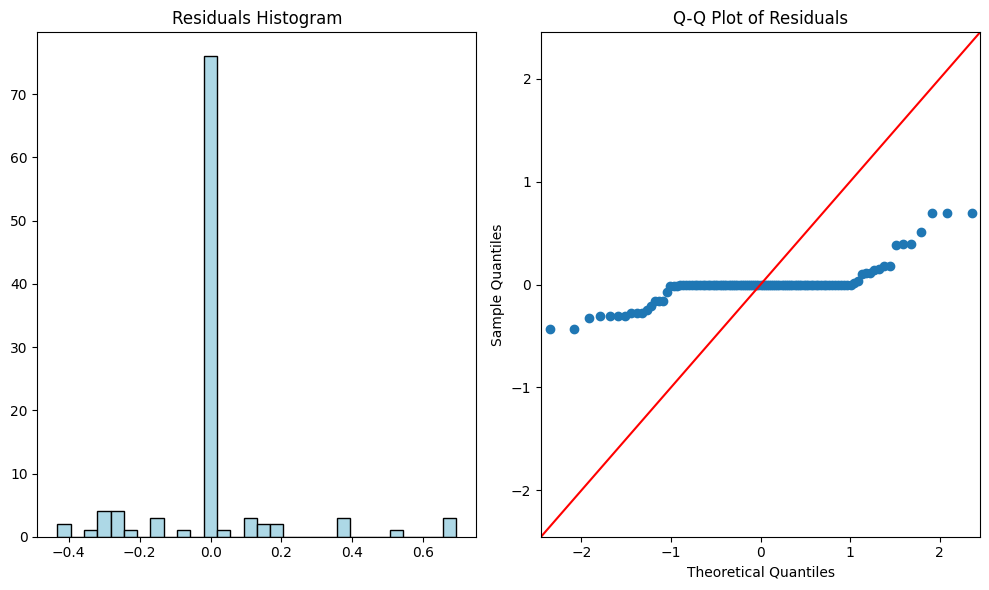

Fine-tuning SARIMA model for Escherichia coli - Cefoxitin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  81.077
Date:                            Sun, 24 Nov 2024   AIC                           -154.155
Time:                                    07:26:49   BIC                           -143.856
Sample:                                04-01-1997   HQIC                          -149.990
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


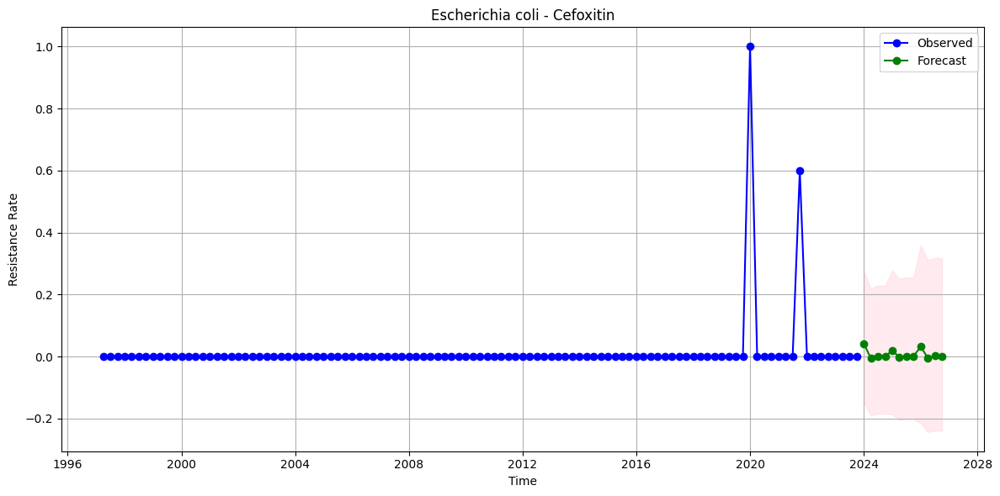

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.0


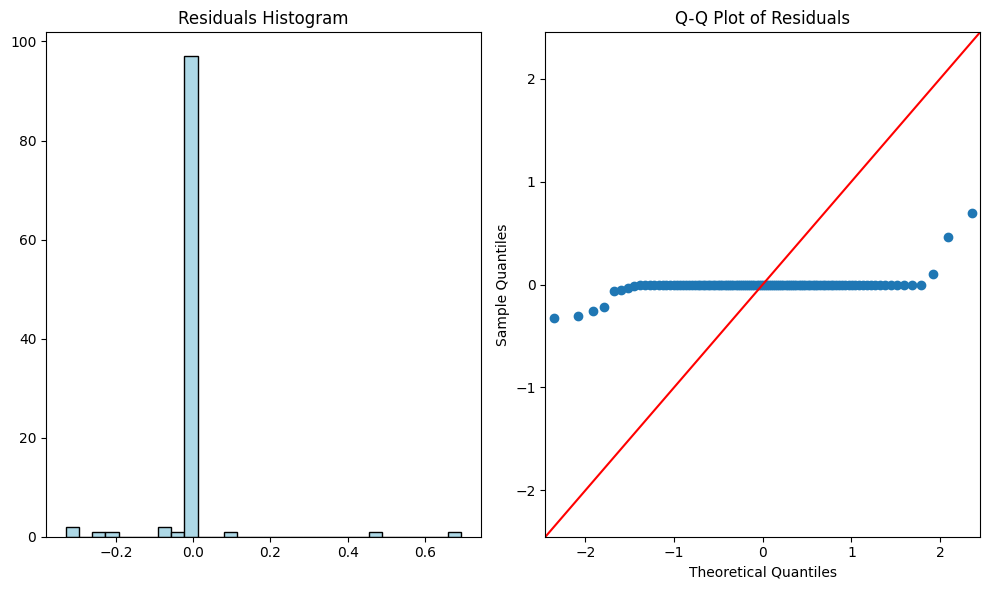

Fine-tuning SARIMA model for Escherichia coli - Linezolid
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  70.350
Date:                            Sun, 24 Nov 2024   AIC                           -132.699
Time:                                    07:26:50   BIC                           -122.400
Sample:                                04-01-1997   HQIC                          -128.535
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


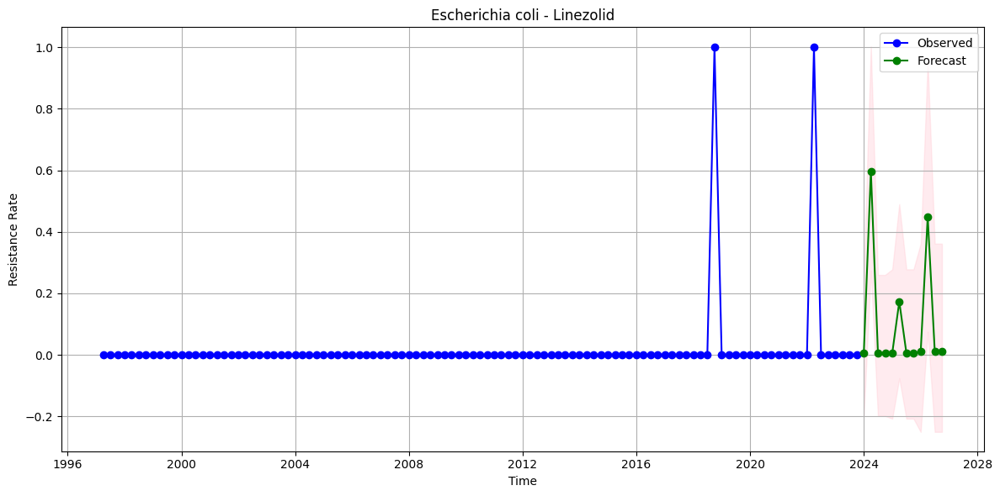

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.0


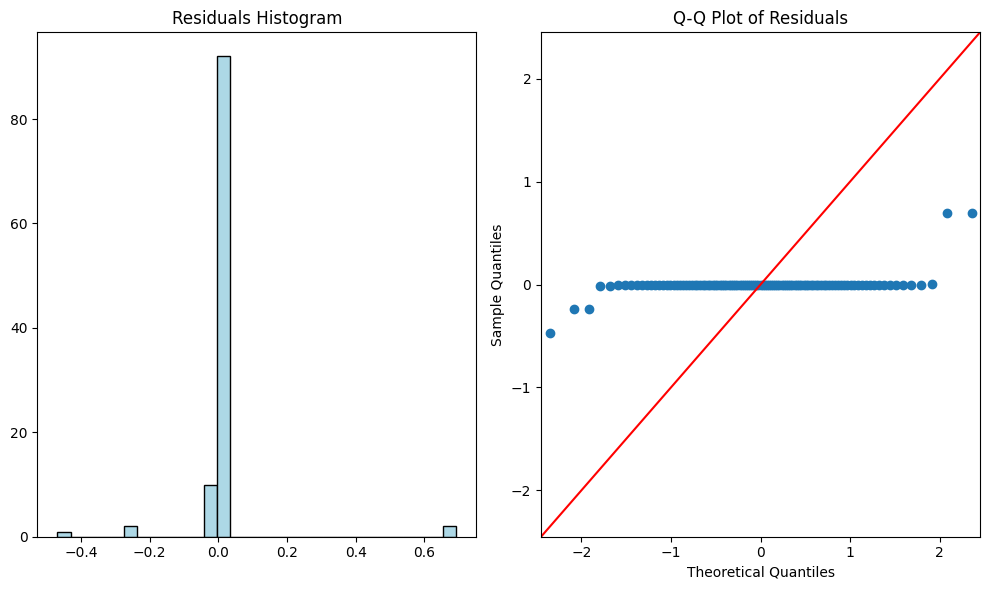

Fine-tuning SARIMA model for Escherichia coli - Pefloxacin
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  73.927
Date:                            Sun, 24 Nov 2024   AIC                           -139.854
Time:                                    07:26:51   BIC                           -129.555
Sample:                                04-01-1997   HQIC                          -135.690
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1      

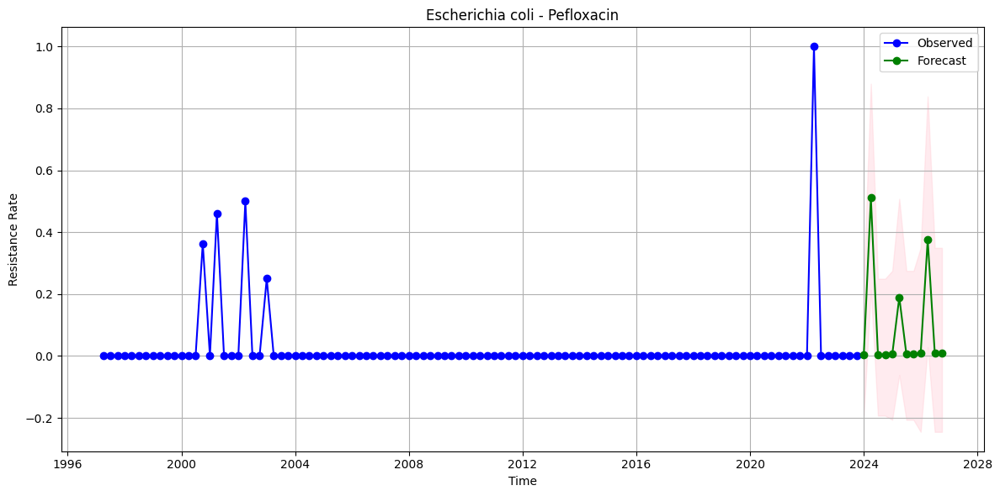

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.0


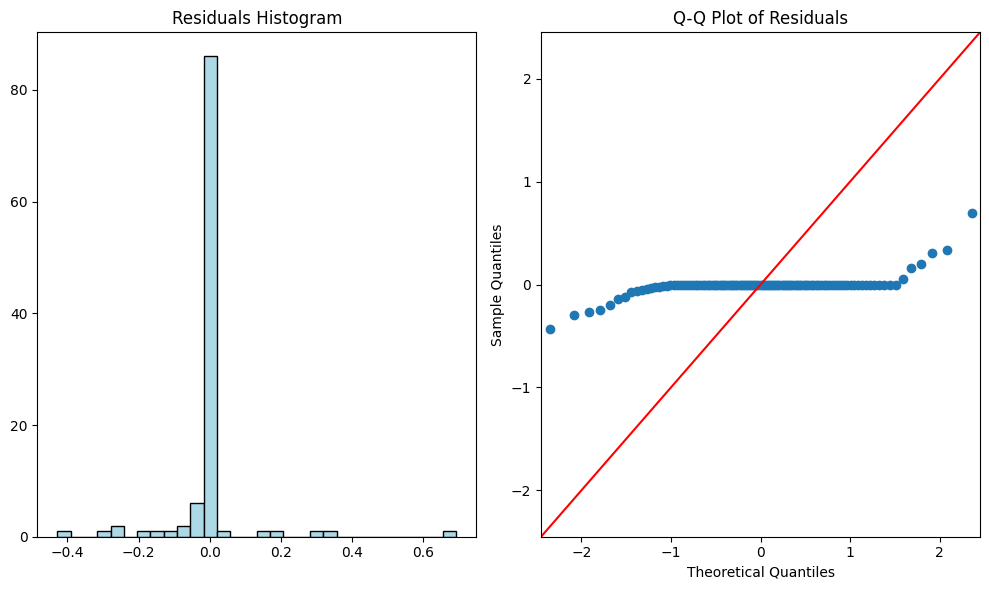

Fine-tuning SARIMA model for Escherichia coli - NOR
Applied Logarithmic transformation (log1p).
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  107
Model:             SARIMAX(1, 1, 1)x(1, 1, [], 4)   Log Likelihood                  79.827
Date:                            Sun, 24 Nov 2024   AIC                           -151.653
Time:                                    07:26:52   BIC                           -141.354
Sample:                                04-01-1997   HQIC                          -147.489
                                     - 10-01-2023                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


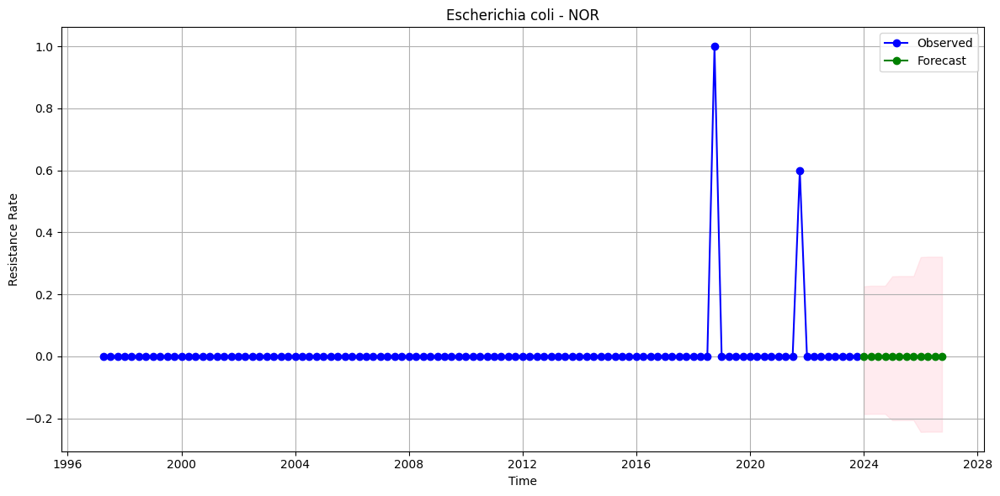

Ljung-Box test did not return expected results with index 0.
Jarque-Bera Test (p-value): 0.0


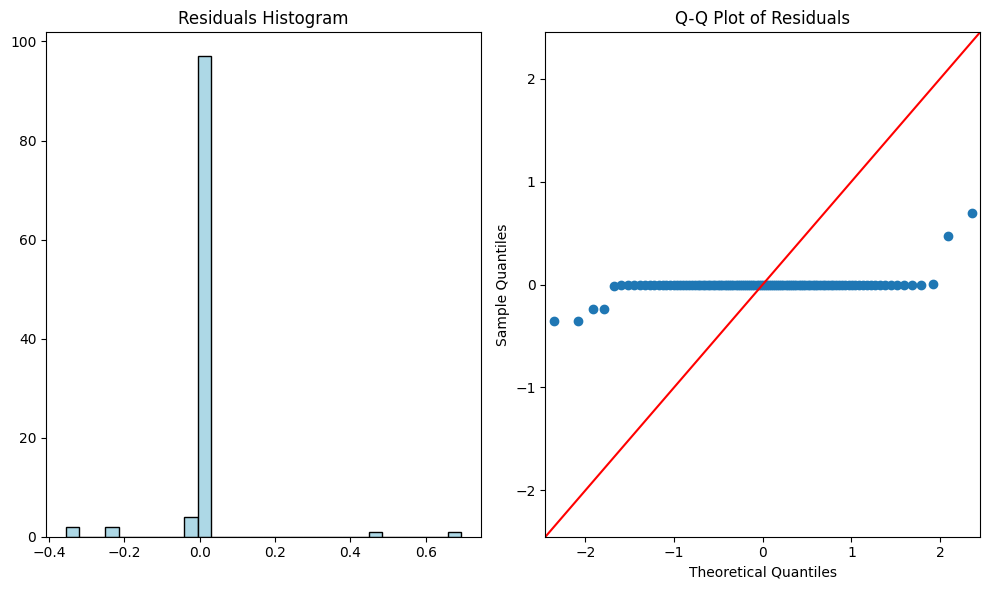

                 Organism          Antibiotic      Order Seasonal Order  \
0   Staphylococcus aureus            Amikacin  (1, 1, 1)   (1, 1, 0, 4)   
1   Staphylococcus aureus            Amoxilin  (1, 1, 1)   (1, 1, 0, 4)   
2   Staphylococcus aureus  Amixilin-Clavulate  (1, 1, 1)   (1, 1, 0, 4)   
3   Staphylococcus aureus          Ampicillin  (1, 1, 1)   (1, 1, 0, 4)   
4   Staphylococcus aureus        Azithromycin  (1, 1, 1)   (1, 1, 0, 4)   
5   Staphylococcus aureus         Ceftriaxone  (1, 1, 1)   (1, 1, 0, 4)   
6   Staphylococcus aureus          Cefuroxime  (1, 1, 1)   (1, 1, 0, 4)   
7   Staphylococcus aureus       Ciprofloxacin  (1, 1, 1)   (1, 1, 0, 4)   
8   Staphylococcus aureus           Oxacillin  (1, 1, 1)   (1, 1, 0, 4)   
9   Staphylococcus aureus     Chloramphenicol  (1, 1, 1)   (1, 1, 0, 4)   
10  Staphylococcus aureus         Clindamycin  (1, 1, 1)   (1, 1, 0, 4)   
11  Staphylococcus aureus          Gentamycin  (1, 1, 1)   (1, 1, 0, 4)   
12  Staphylococcus aureus

In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import boxcox
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.stattools import jarque_bera

# Assuming 'stationary_series_dict' contains your time series data
best_models = {}
evaluation_results = []
for organism, antibiotic_data in time_series_dict.items():
  for antibiotic, series in antibiotic_data.items():
    print(f"Fine-tuning SARIMA model for {organism} - {antibiotic}")

    # Step 1: Transform Data
    transformed_series = series.copy()
    lambda_value = None  # To store Box-Cox lambda if used
    if series.min() > 0:  # Ensure positive values for Box-Cox
        transformed_series, lambda_value = boxcox(series)
        print(f"Applied Box-Cox transformation with λ = {lambda_value:.2f}")
    else:
        transformed_series = np.log1p(series)  # Use log1p for zero/negative values
        print("Applied Logarithmic transformation (log1p).")

    # Step 2: Fit SARIMA Model using statsmodels
    p, d, q = 1, 1, 1  # Non-seasonal order
    P, D, Q, S = 1, 1, 0, 4  # Seasonal order (monthly data, S=12)

    model = sm.tsa.statespace.SARIMAX(
        transformed_series,
        order=(p, d, q),
        seasonal_order=(P, D, Q, S),
        enforce_stationarity=False,
        enforce_invertibility=False,
    )
    results = model.fit(disp=False)

    best_models[(organism, antibiotic)] = results
    print(results.summary())
    print(f"Best SARIMA Order: {(p, d, q)}, Seasonal Order: {(P, D, Q, S)}")

    # Step 3: Forecasting the next periods (e.g., 12 periods ahead)
    forecast_periods = 12
    forecast = results.get_forecast(steps=forecast_periods)
    forecast_mean = forecast.predicted_mean
    forecast_ci = forecast.conf_int()

    # Step 4: Inverse Transform Forecast (if Box-Cox was applied)
    if lambda_value is not None:
        forecast_mean = np.exp(forecast_mean) - 1  # Inverse Box-Cox transformation
        forecast_ci = np.exp(forecast_ci) - 1  # Inverse Box-Cox
    else:
        forecast_mean = np.expm1(forecast_mean)  # Inverse log1p transformation
        forecast_ci = np.expm1(forecast_ci)  # Inverse log1p

    # Step 5: Plot Results
    plt.figure(figsize=(12, 6))
    plt.plot(series, label='Observed', marker='o', color='blue')
    plt.plot(forecast_mean, label='Forecast', marker='o', color='green')
    plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink', alpha=0.3)
    plt.title(f"{organism} - {antibiotic}")
    plt.xlabel("Time")
    plt.ylabel("Resistance Rate")
    plt.legend()
    plt.tight_layout()
    plt.grid(True)
    plt.show()

    # Step 6: Model Evaluation
    observed = series.values[-len(forecast_mean):]
    forecast_mean = forecast_mean[:len(observed)]

    mae = mean_absolute_error(observed, forecast_mean)
    mse = mean_squared_error(observed, forecast_mean)
    r2 = r2_score(observed, forecast_mean)

    # Calculate MAPE (Mean Absolute Percentage Error)
    mape = np.mean(np.abs((observed - forecast_mean) / observed)) * 100

    evaluation_results.append({
        "Organism": organism,
        "Antibiotic": antibiotic,
        "Order": (p, d, q),
        "Seasonal Order": (P, D, Q, S),
        "MAE": mae,
        "MSE": mse,
        "R2": r2,
        "MAPE": mape,
    })

    # Step 7: Residual Diagnostics (Ljung-Box, Jarque-Bera)
    residuals = results.resid
    # Ljung-Box test for autocorrelation
    lb_test = acorr_ljungbox(residuals, lags=[10], return_df=True)
    #print(f"Ljung-Box Test (p-value): {lb_test['lb_pvalue'][0]}")
    if 0 in lb_test.index:
        print(f"Ljung-Box Test (p-value): {lb_test['lb_pvalue'][0]}")
    else:
        print("Ljung-Box test did not return expected results with index 0.")
    # Normality test (Jarque-Bera)
    jb_test = jarque_bera(residuals)
    print(f"Jarque-Bera Test (p-value): {jb_test[1]}")

    # Residual Diagnostics: Visualization
    plt.figure(figsize=(10, 6))
    plt.subplot(1, 2, 1)
    plt.hist(residuals, bins=30, color='lightblue', edgecolor='black')
    plt.title('Residuals Histogram')

    plt.subplot(1, 2, 2)
    sm.qqplot(residuals, line='45', ax=plt.gca())
    plt.title('Q-Q Plot of Residuals')

    plt.tight_layout()
    plt.show()

# Convert evaluation results to DataFrame
evaluation_df = pd.DataFrame(evaluation_results)
print(evaluation_df)


Fine-tuning SARIMA model for Staphylococcus aureus - Amikacin
Applied Logarithmic transformation (log1p).
Best SARIMA model: (0, 0, 0, 0, 0, 0, 4)
                               SARIMAX Results                                
Dep. Variable:        Resistance_Rate   No. Observations:                  116
Model:                        SARIMAX   Log Likelihood                 190.024
Date:                Sun, 24 Nov 2024   AIC                           -378.048
Time:                        07:30:59   BIC                           -375.303
Sample:                    01-01-1996   HQIC                          -376.934
                         - 10-01-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0021   5.06e-05     42.491      0.000       0.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


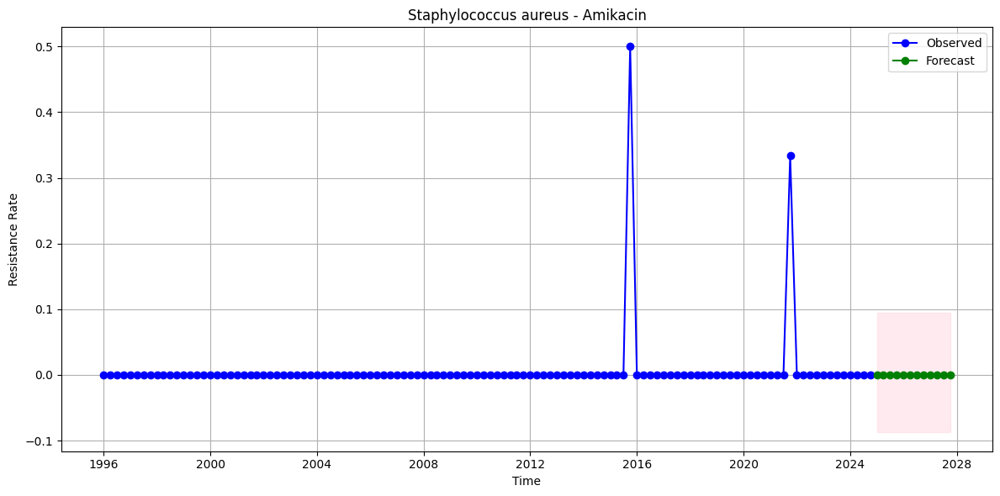

Ljung-Box Test (p-value) for lag 10: 0.9999978564049586
Jarque-Bera Test (p-value): 0.0


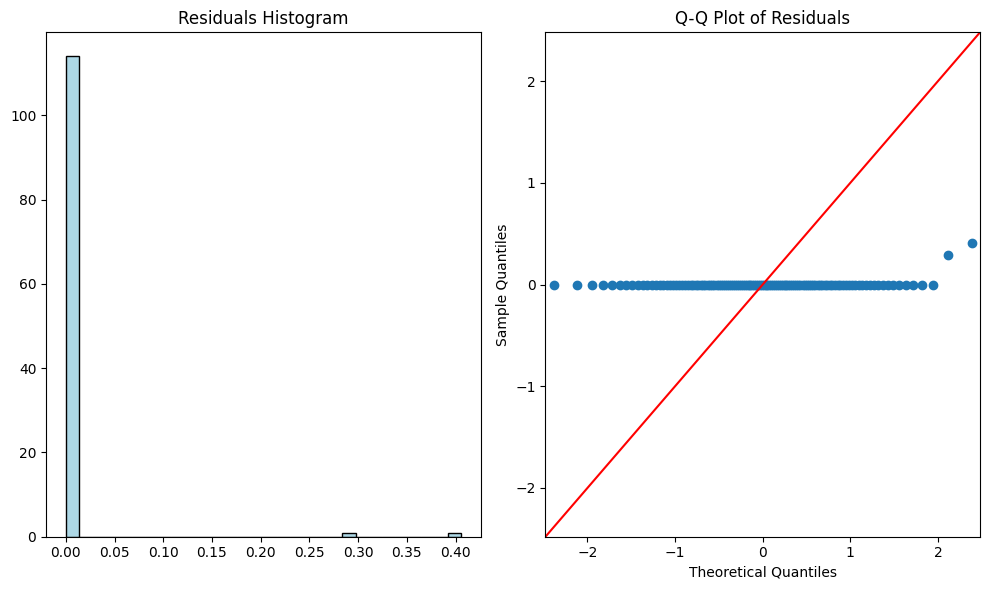

Fine-tuning SARIMA model for Staphylococcus aureus - Amoxilin
Applied Logarithmic transformation (log1p).
Best SARIMA model: (1, 0, 0, 0, 0, 0, 4)
                               SARIMAX Results                                
Dep. Variable:        Resistance_Rate   No. Observations:                  116
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  93.776
Date:                Sun, 24 Nov 2024   AIC                           -183.553
Time:                        07:32:38   BIC                           -178.063
Sample:                    01-01-1996   HQIC                          -181.325
                         - 10-01-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3258      0.030     10.939      0.000       0.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


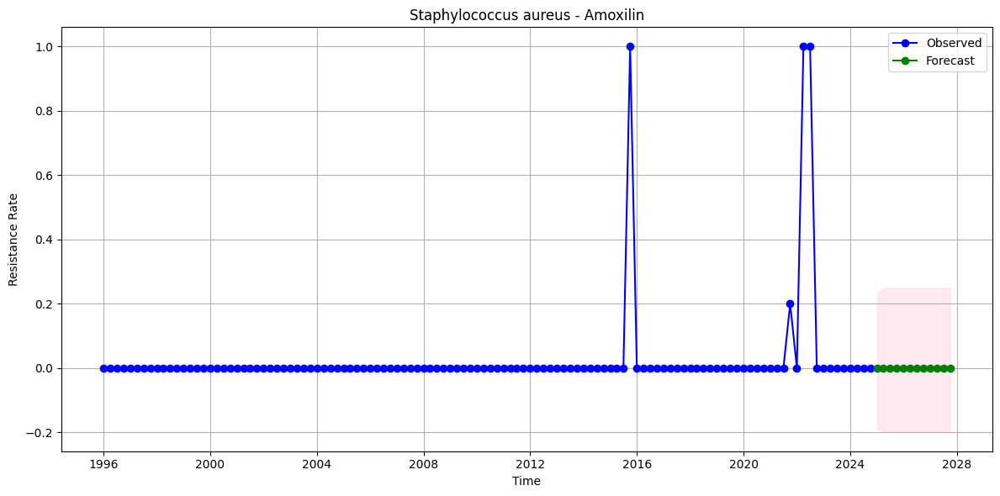

Ljung-Box Test (p-value) for lag 10: 0.9992953375721101
Jarque-Bera Test (p-value): 0.0


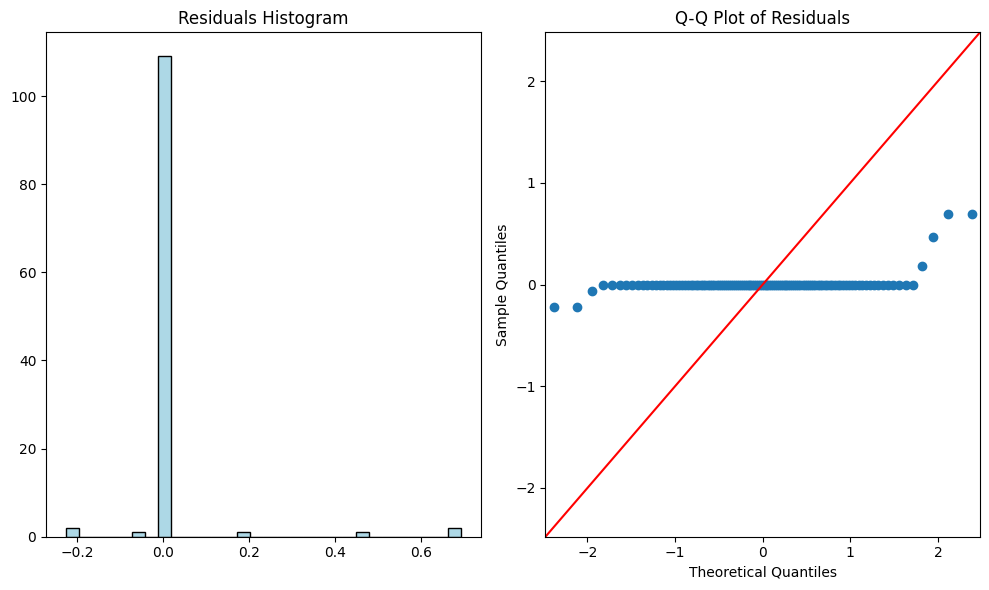

Fine-tuning SARIMA model for Staphylococcus aureus - Amixilin-Clavulate
Applied Logarithmic transformation (log1p).
Best SARIMA model: (1, 0, 0, 0, 0, 0, 4)
                               SARIMAX Results                                
Dep. Variable:        Resistance_Rate   No. Observations:                  116
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  48.230
Date:                Sun, 24 Nov 2024   AIC                            -92.461
Time:                        07:34:05   BIC                            -86.971
Sample:                    01-01-1996   HQIC                           -90.232
                         - 10-01-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5916      0.042     14.143      0.00

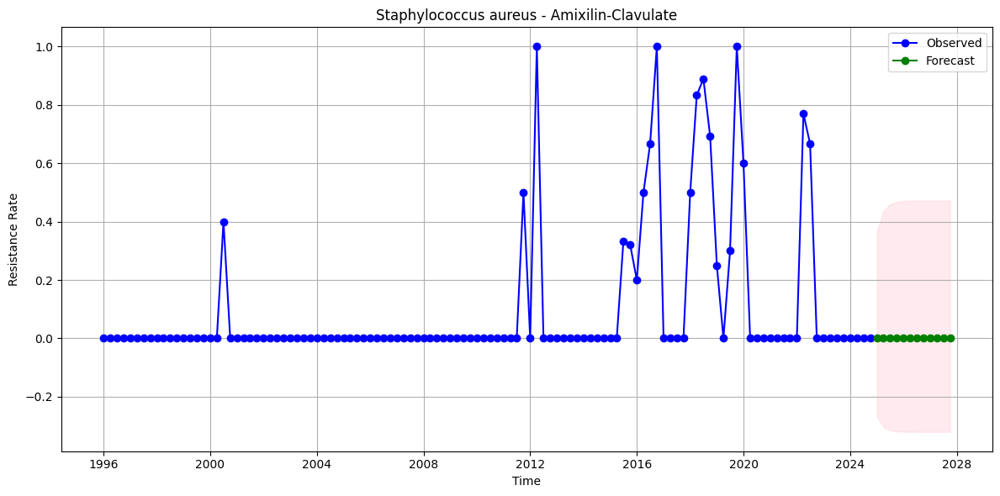

Ljung-Box Test (p-value) for lag 10: 0.7076788396046847
Jarque-Bera Test (p-value): 5.6475914997853695e-36


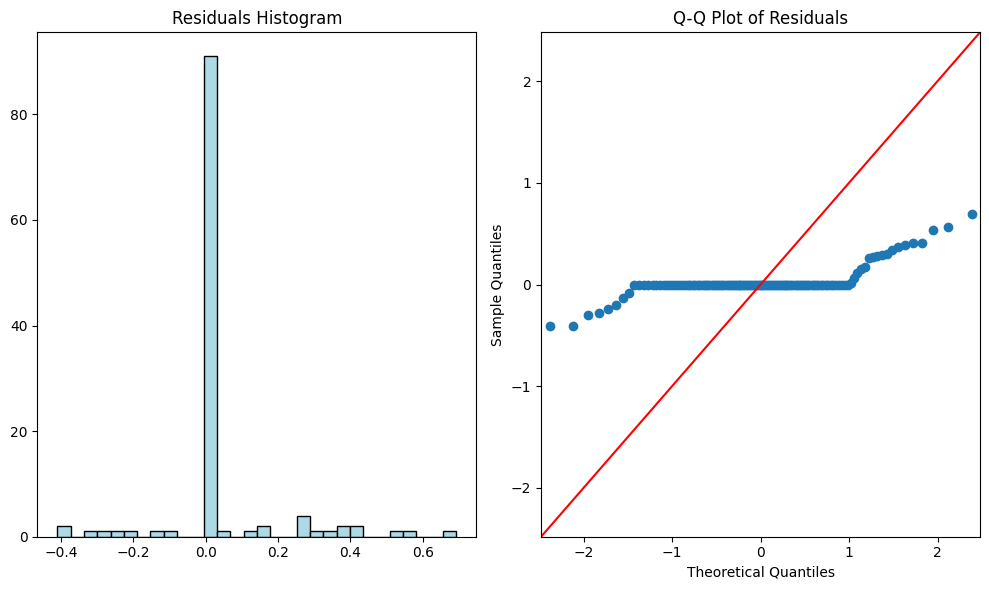

Fine-tuning SARIMA model for Staphylococcus aureus - Ampicillin
Applied Logarithmic transformation (log1p).
Best SARIMA model: (1, 1, 1, 2, 0, 0, 12)
                                      SARIMAX Results                                      
Dep. Variable:                     Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(1, 1, 1)x(2, 0, [], 12)   Log Likelihood                  10.540
Date:                             Sun, 24 Nov 2024   AIC                            -11.079
Time:                                     07:35:27   BIC                              1.420
Sample:                                 01-01-1996   HQIC                            -6.039
                                      - 10-01-2024                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------

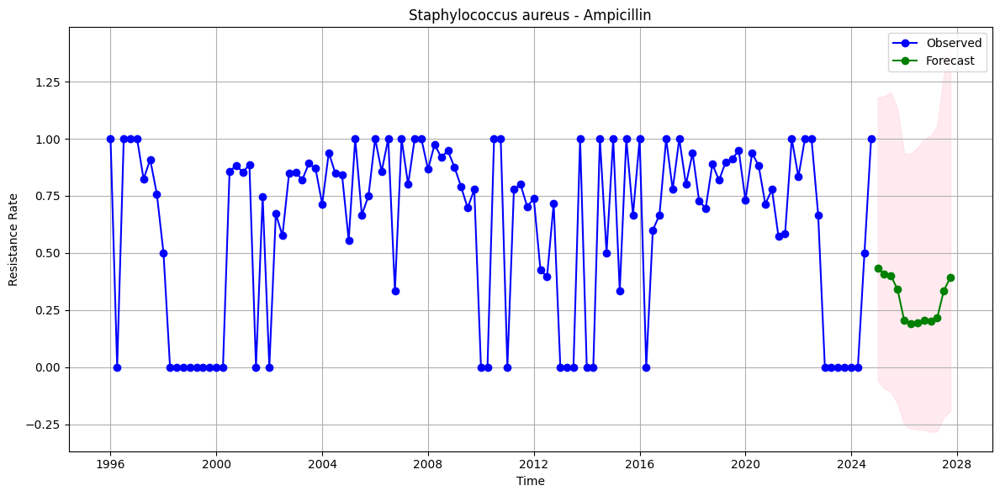

Ljung-Box Test (p-value) for lag 10: 0.021031365878251843
Jarque-Bera Test (p-value): 0.012952631177545687


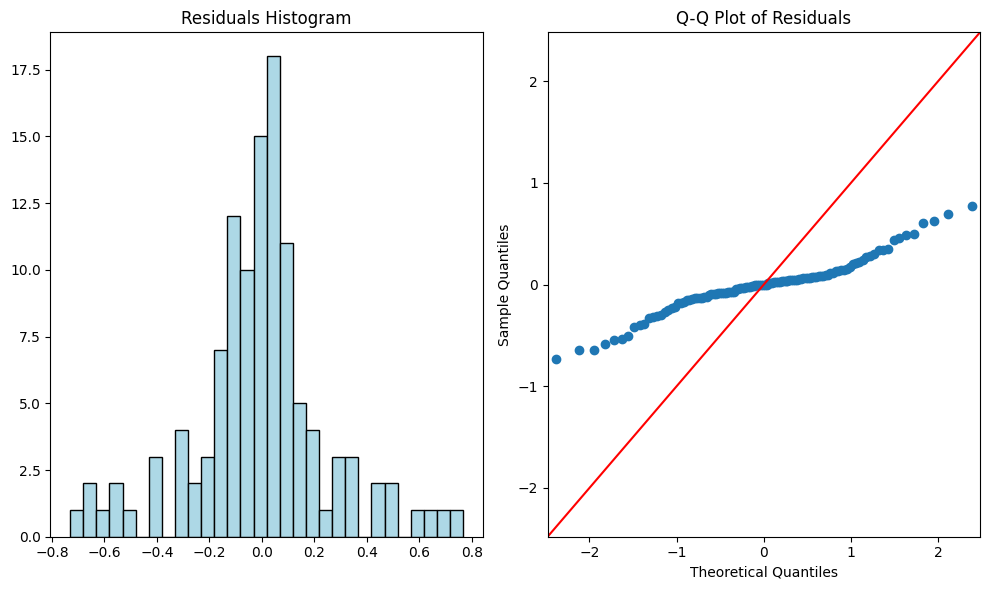

Fine-tuning SARIMA model for Staphylococcus aureus - Azithromycin
Applied Logarithmic transformation (log1p).
Best SARIMA model: (1, 0, 1, 0, 0, 0, 4)
                               SARIMAX Results                                
Dep. Variable:        Resistance_Rate   No. Observations:                  116
Model:               SARIMAX(1, 0, 1)   Log Likelihood                  62.164
Date:                Sun, 24 Nov 2024   AIC                           -118.328
Time:                        07:36:56   BIC                           -110.119
Sample:                    01-01-1996   HQIC                          -114.996
                         - 10-01-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8998      0.041     22.135      0.000     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


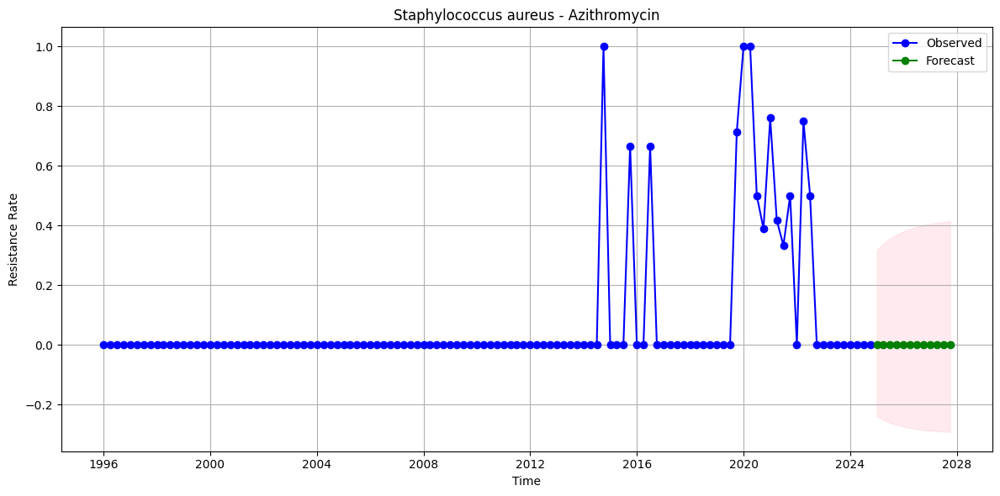

Ljung-Box Test (p-value) for lag 10: 0.8170846669862182
Jarque-Bera Test (p-value): 3.6506466680488864e-105


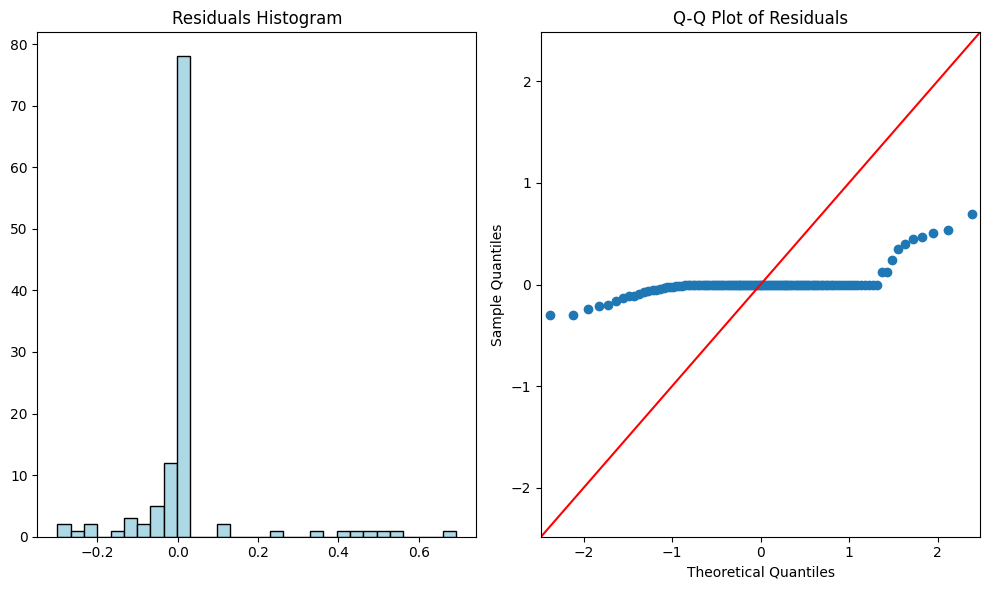

Fine-tuning SARIMA model for Staphylococcus aureus - Ceftriaxone
Applied Logarithmic transformation (log1p).
Best SARIMA model: (1, 0, 1, 0, 0, 0, 4)
                               SARIMAX Results                                
Dep. Variable:        Resistance_Rate   No. Observations:                  116
Model:               SARIMAX(1, 0, 1)   Log Likelihood                  32.710
Date:                Sun, 24 Nov 2024   AIC                            -59.420
Time:                        07:38:15   BIC                            -51.211
Sample:                    01-01-1996   HQIC                           -56.088
                         - 10-01-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9528      0.030     31.929      0.000      

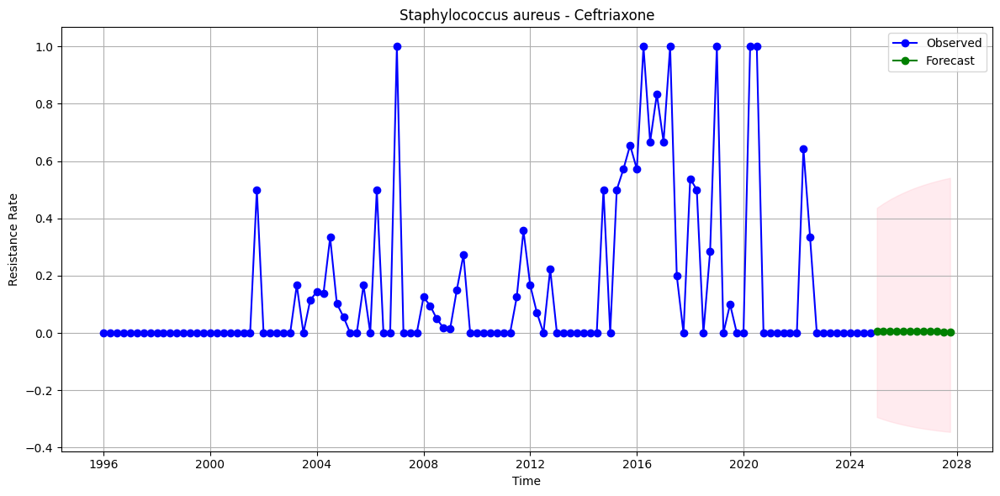

Ljung-Box Test (p-value) for lag 10: 0.869427130086296
Jarque-Bera Test (p-value): 5.437593835944641e-09


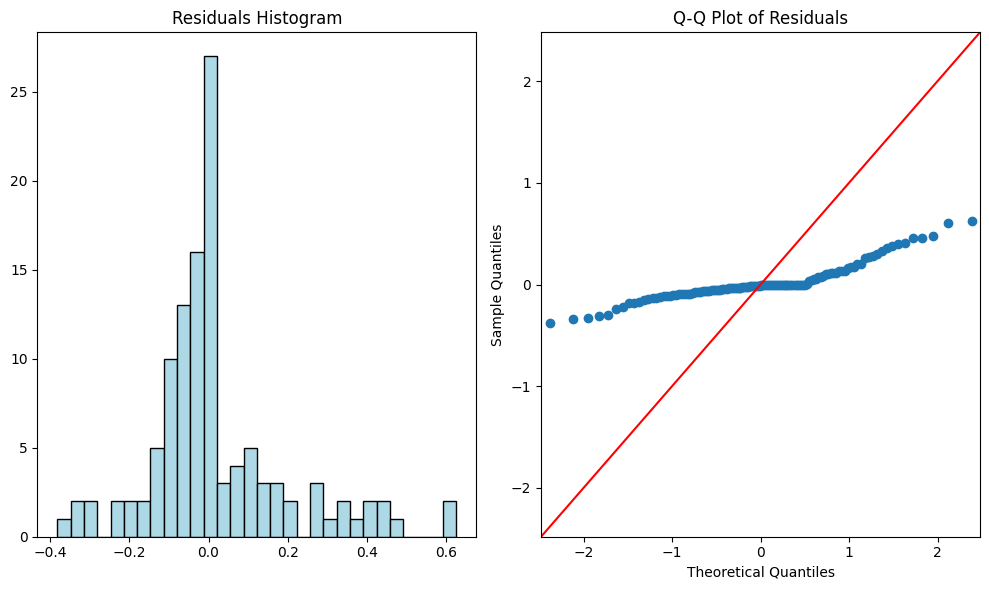

Fine-tuning SARIMA model for Staphylococcus aureus - Cefuroxime
Applied Logarithmic transformation (log1p).
Best SARIMA model: (2, 0, 0, 0, 0, 0, 4)
                               SARIMAX Results                                
Dep. Variable:        Resistance_Rate   No. Observations:                  115
Model:               SARIMAX(2, 0, 0)   Log Likelihood                 101.472
Date:                Sun, 24 Nov 2024   AIC                           -196.943
Time:                        07:39:58   BIC                           -188.761
Sample:                    04-01-1996   HQIC                          -193.623
                         - 10-01-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7390      0.038    -19.534      0.000      -

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


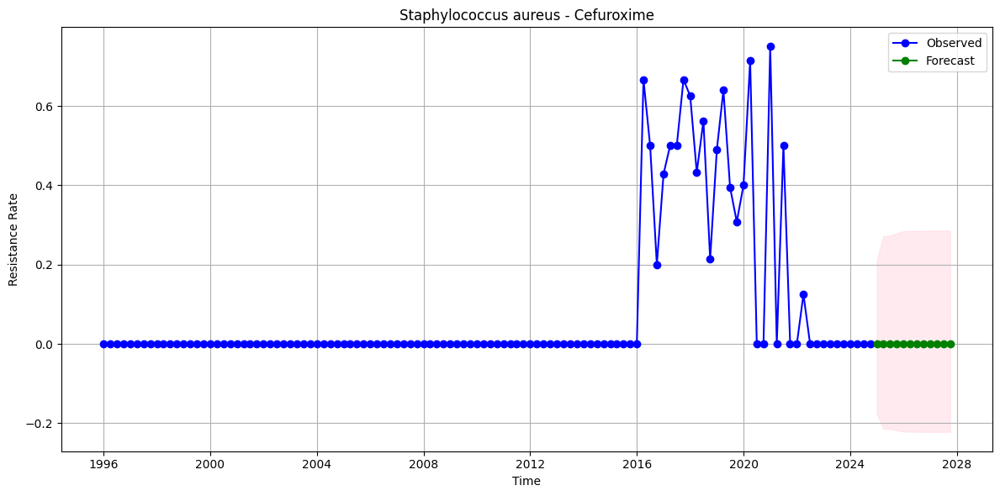

Ljung-Box Test (p-value) for lag 10: 0.3950078476154203
Jarque-Bera Test (p-value): 4.1381379658849835e-108


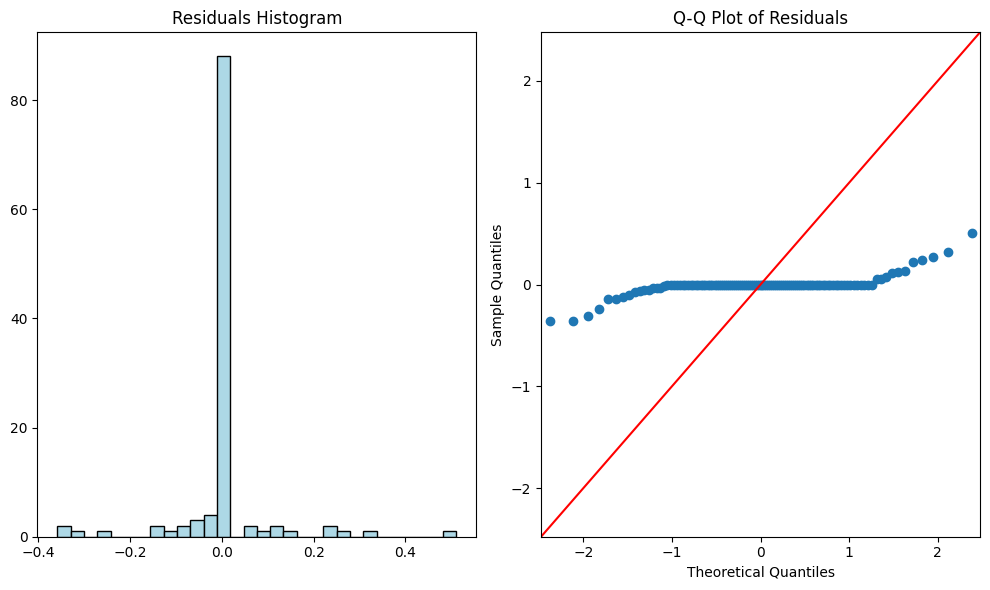

Fine-tuning SARIMA model for Staphylococcus aureus - Ciprofloxacin
Applied Logarithmic transformation (log1p).
Best SARIMA model: (0, 1, 1, 0, 0, 0, 4)
                               SARIMAX Results                                
Dep. Variable:        Resistance_Rate   No. Observations:                  116
Model:               SARIMAX(0, 1, 1)   Log Likelihood                  48.519
Date:                Sun, 24 Nov 2024   AIC                            -93.037
Time:                        07:41:26   BIC                            -87.582
Sample:                    01-01-1996   HQIC                           -90.824
                         - 10-01-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7694      0.042    -18.446      0.000    

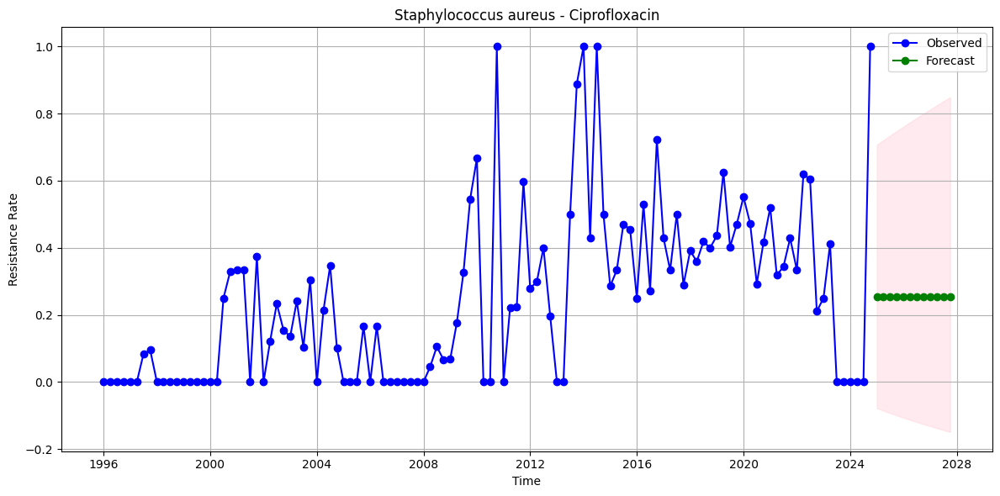

Ljung-Box Test (p-value) for lag 10: 0.7143753302673176
Jarque-Bera Test (p-value): 1.907786652599172e-10


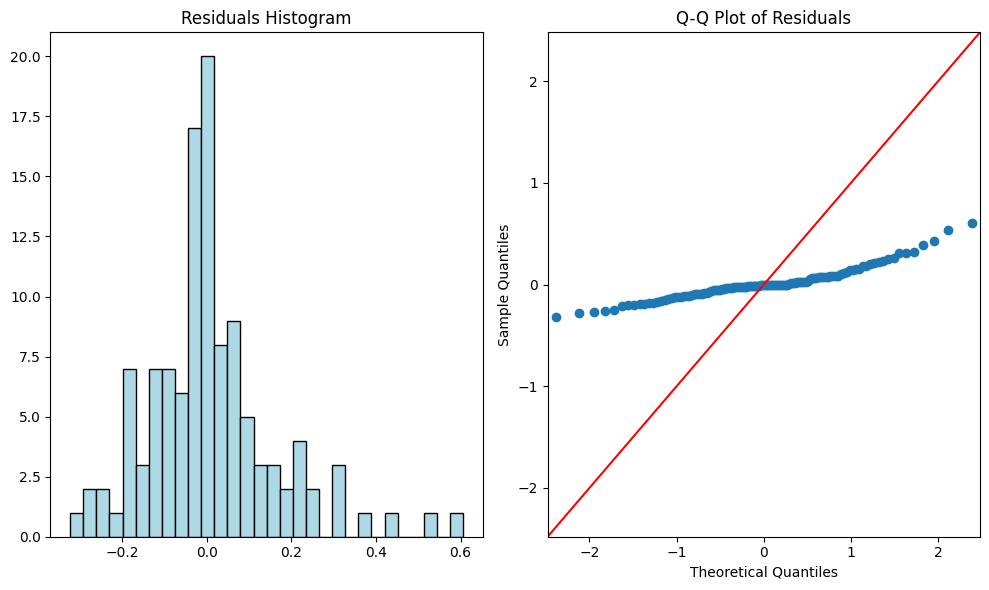

Fine-tuning SARIMA model for Staphylococcus aureus - Oxacillin
Applied Logarithmic transformation (log1p).
Best SARIMA model: (2, 1, 1, 2, 1, 1, 12)
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(2, 1, 1)x(2, 1, 1, 12)   Log Likelihood                  51.637
Date:                            Sun, 24 Nov 2024   AIC                            -89.275
Time:                                    07:42:52   BIC                            -72.868
Sample:                                01-01-1996   HQIC                           -82.712
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------

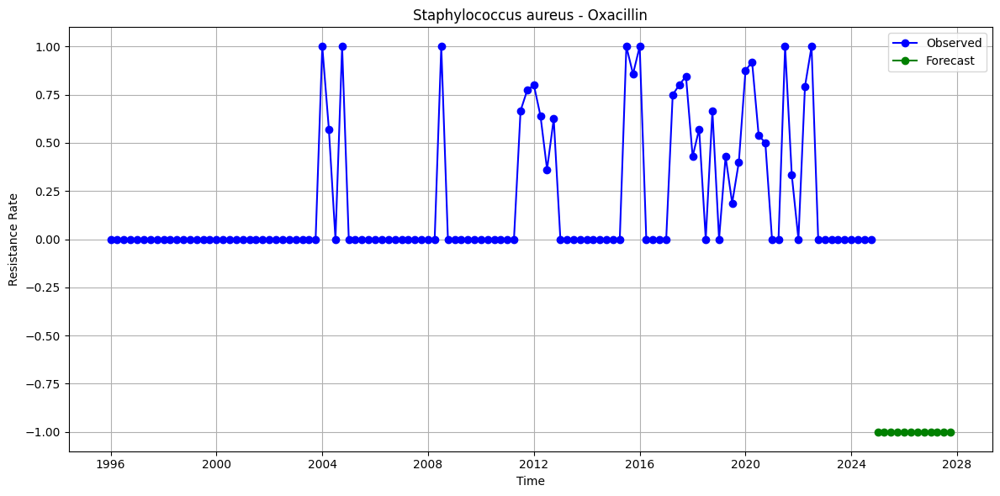

Ljung-Box Test (p-value) for lag 10: 0.0005632660572170619
Jarque-Bera Test (p-value): 0.0


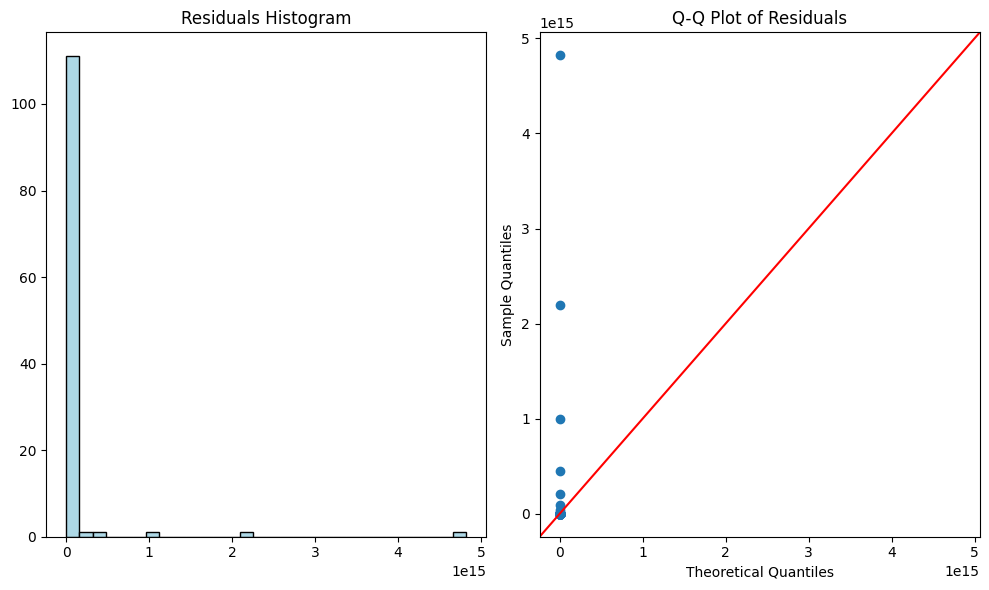

Fine-tuning SARIMA model for Staphylococcus aureus - Chloramphenicol
Applied Logarithmic transformation (log1p).
Best SARIMA model: (2, 0, 1, 2, 0, 0, 12)
                                      SARIMAX Results                                      
Dep. Variable:                     Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(2, 0, 1)x(2, 0, [], 12)   Log Likelihood                  14.085
Date:                             Sun, 24 Nov 2024   AIC                            -16.170
Time:                                     07:44:21   BIC                             -1.171
Sample:                                 01-01-1996   HQIC                           -10.121
                                      - 10-01-2024                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------

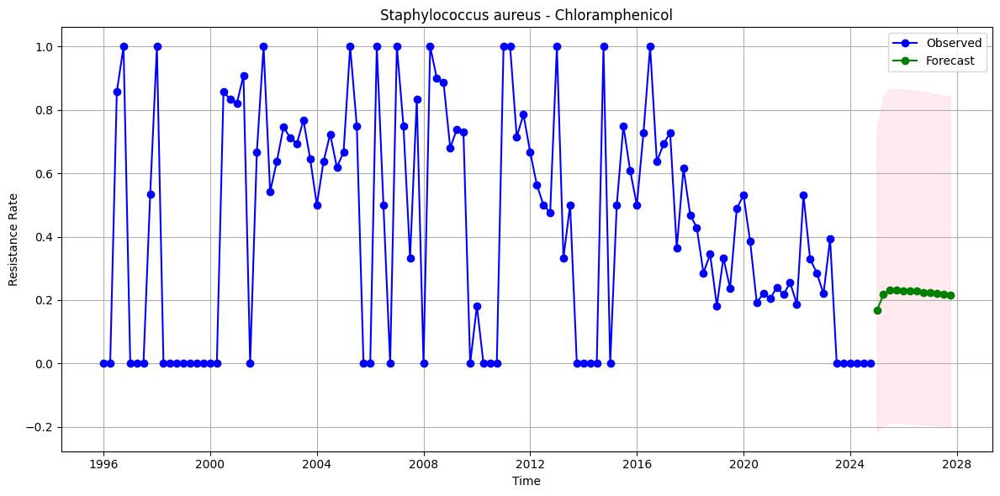

Ljung-Box Test (p-value) for lag 10: 0.2338152669505256
Jarque-Bera Test (p-value): 0.0034804977308400724


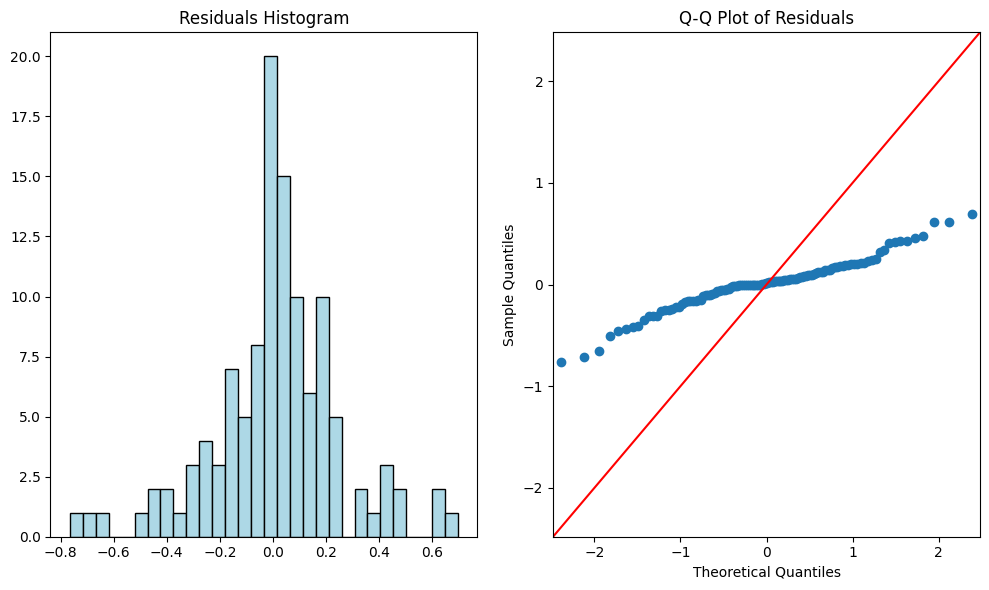

Fine-tuning SARIMA model for Staphylococcus aureus - Clindamycin
Applied Logarithmic transformation (log1p).
Best SARIMA model: (2, 0, 2, 0, 0, 0, 4)
                               SARIMAX Results                                
Dep. Variable:        Resistance_Rate   No. Observations:                  115
Model:               SARIMAX(2, 0, 2)   Log Likelihood                  75.082
Date:                Sun, 24 Nov 2024   AIC                           -140.164
Time:                        07:45:53   BIC                           -126.571
Sample:                    04-01-1996   HQIC                          -134.649
                         - 10-01-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9909      0.119     -8.308      0.000      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


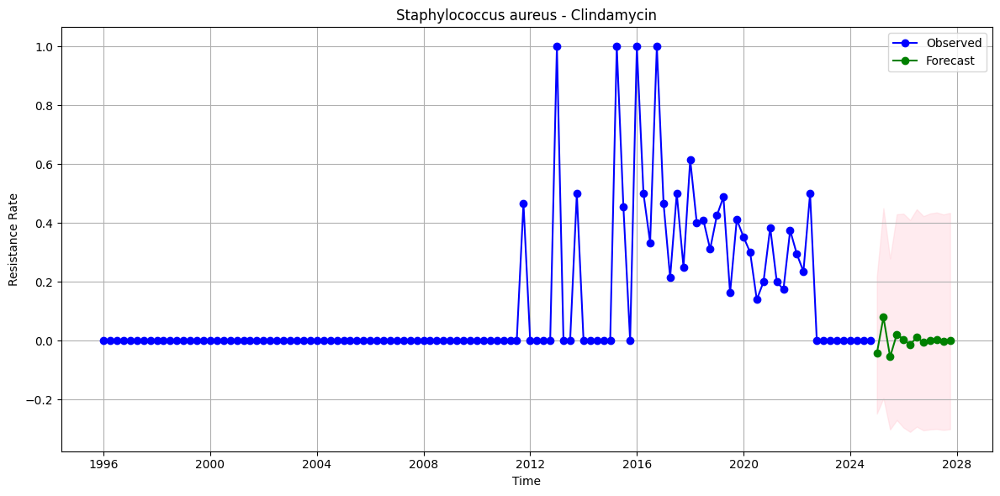

Ljung-Box Test (p-value) for lag 10: 0.5684051643044051
Jarque-Bera Test (p-value): 1.7144671138637303e-156


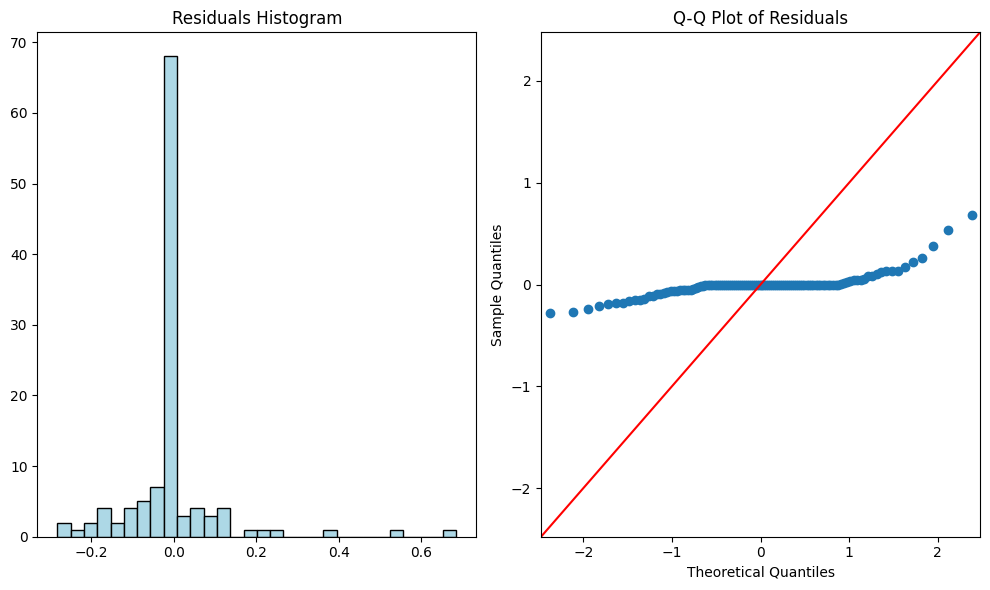

Fine-tuning SARIMA model for Staphylococcus aureus - Gentamycin
Applied Logarithmic transformation (log1p).
Best SARIMA model: (0, 0, 2, 1, 0, 0, 4)
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  115
Model:             SARIMAX(0, 0, 2)x(1, 0, [], 4)   Log Likelihood                  32.941
Date:                            Sun, 24 Nov 2024   AIC                            -57.883
Time:                                    07:47:30   BIC                            -47.044
Sample:                                04-01-1996   HQIC                           -53.486
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------

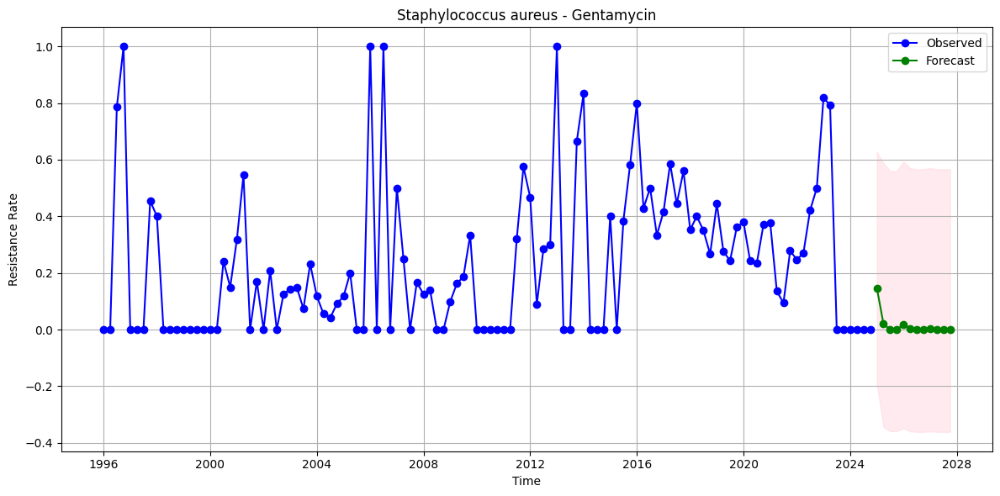

Ljung-Box Test (p-value) for lag 10: 0.7840011917848119
Jarque-Bera Test (p-value): 1.1969813851834105e-05


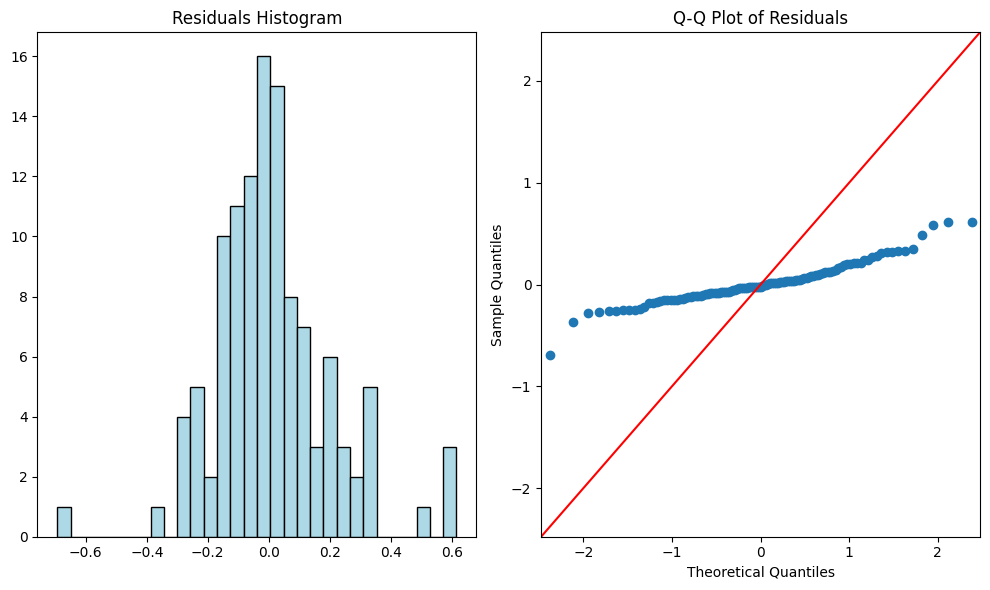

Fine-tuning SARIMA model for Staphylococcus aureus - Erythromycin
Applied Logarithmic transformation (log1p).
Best SARIMA model: (1, 1, 1, 0, 0, 0, 4)
                               SARIMAX Results                                
Dep. Variable:        Resistance_Rate   No. Observations:                  116
Model:               SARIMAX(1, 1, 1)   Log Likelihood                  18.421
Date:                Sun, 24 Nov 2024   AIC                            -30.841
Time:                        07:49:09   BIC                            -22.659
Sample:                    01-01-1996   HQIC                           -27.521
                         - 10-01-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3235      0.088      3.664      0.000     

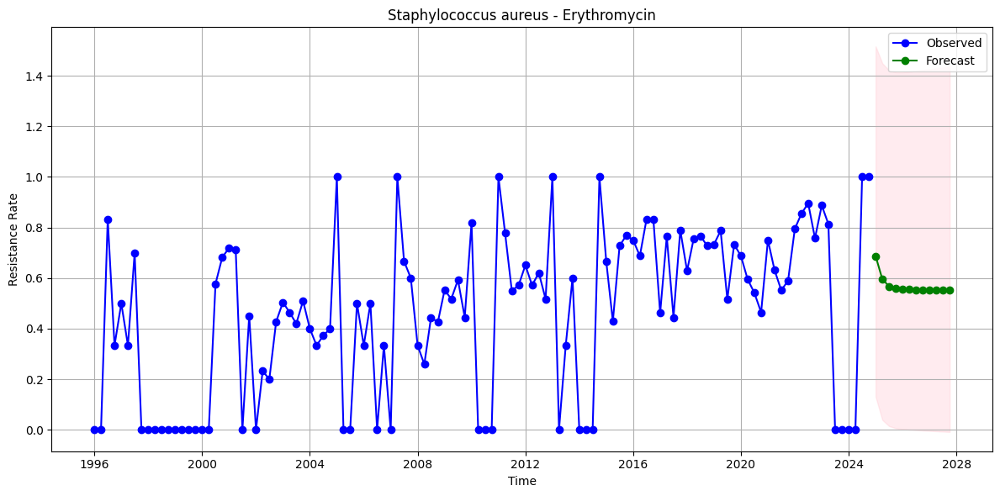

Ljung-Box Test (p-value) for lag 10: 0.7066738439037916
Jarque-Bera Test (p-value): 0.30206073834888564


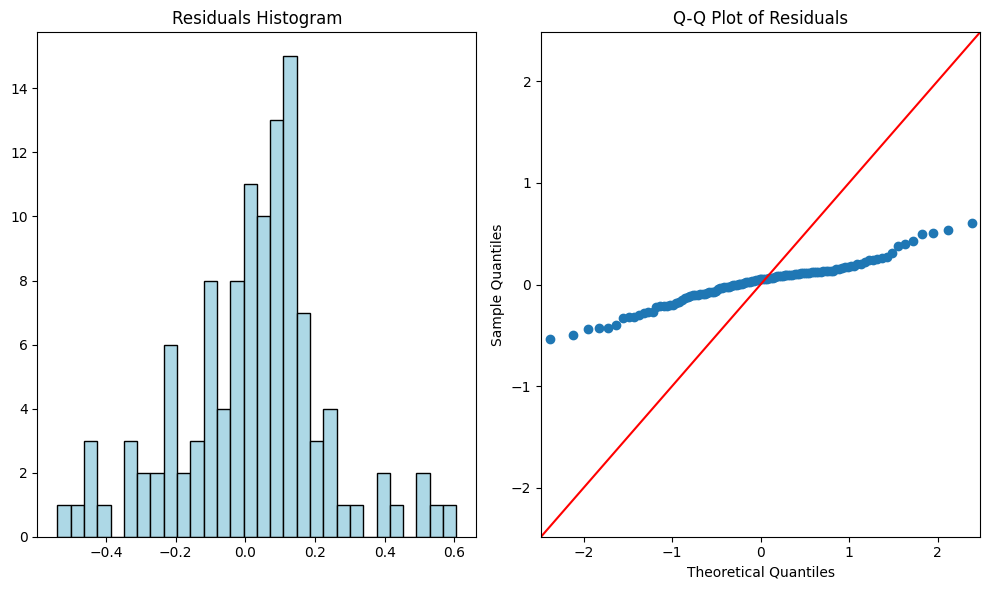

Fine-tuning SARIMA model for Staphylococcus aureus - Tetracycline
Applied Logarithmic transformation (log1p).
Best SARIMA model: (0, 1, 1, 2, 0, 1, 12)
                                     SARIMAX Results                                      
Dep. Variable:                    Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(0, 1, 1)x(2, 0, 1, 12)   Log Likelihood                   4.930
Date:                            Sun, 24 Nov 2024   AIC                              0.139
Time:                                    07:50:41   BIC                             12.693
Sample:                                01-01-1996   HQIC                             5.204
                                     - 10-01-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------

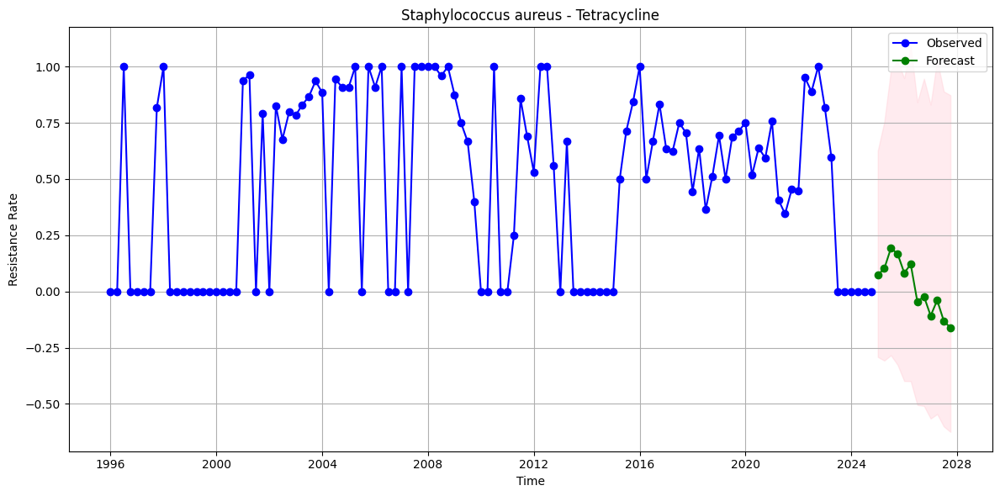

Ljung-Box Test (p-value) for lag 10: 0.10138126579825706
Jarque-Bera Test (p-value): 0.16762251781971751


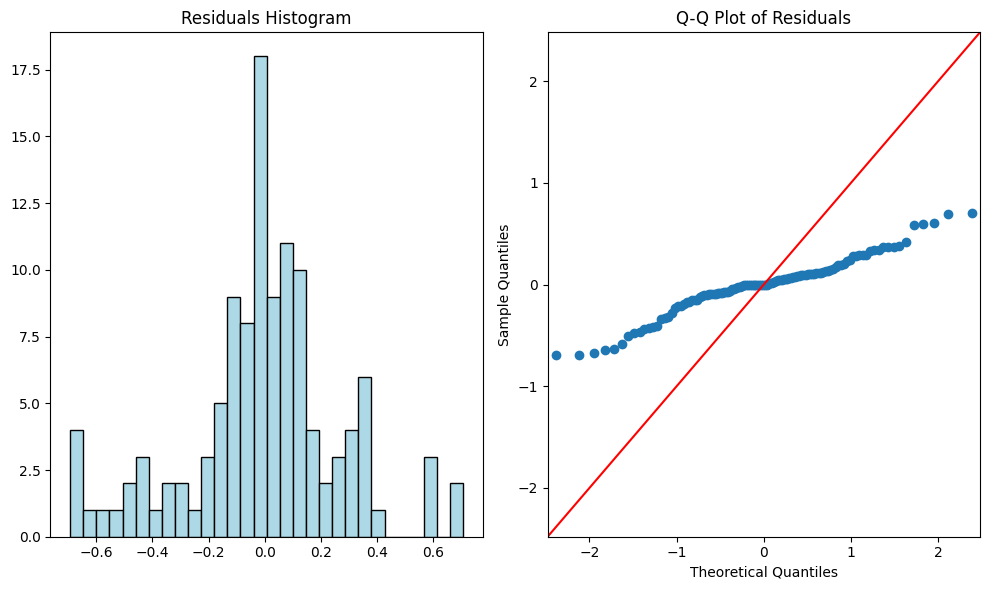

Fine-tuning SARIMA model for Staphylococcus aureus - Trimethoprim
Applied Logarithmic transformation (log1p).
Best SARIMA model: (2, 1, 2, 2, 0, 0, 12)
                                      SARIMAX Results                                      
Dep. Variable:                     Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(2, 1, 2)x(2, 0, [], 12)   Log Likelihood                  10.010
Date:                             Sun, 24 Nov 2024   AIC                             -6.020
Time:                                     07:52:00   BIC                             11.400
Sample:                                 01-01-1996   HQIC                             1.002
                                      - 10-01-2024                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------

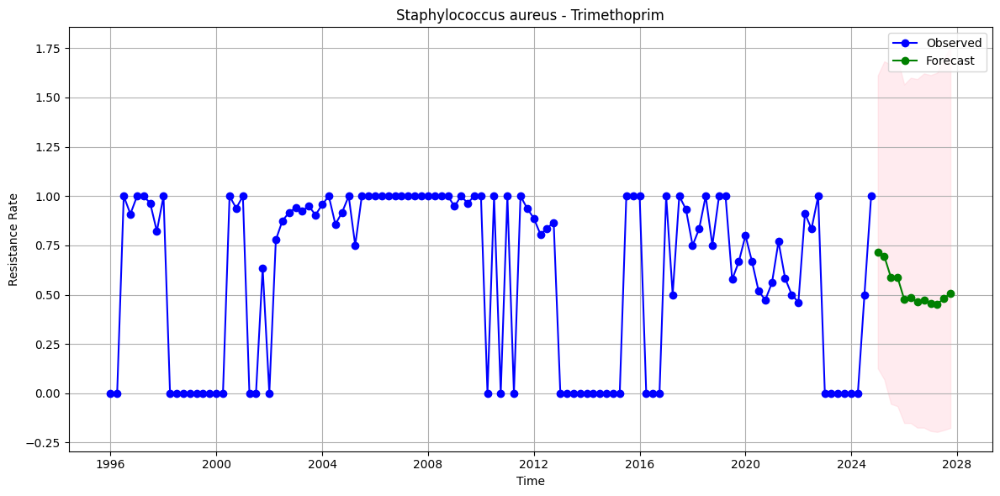

Ljung-Box Test (p-value) for lag 10: 0.8718799851298751
Jarque-Bera Test (p-value): 1.5949951652625815e-05


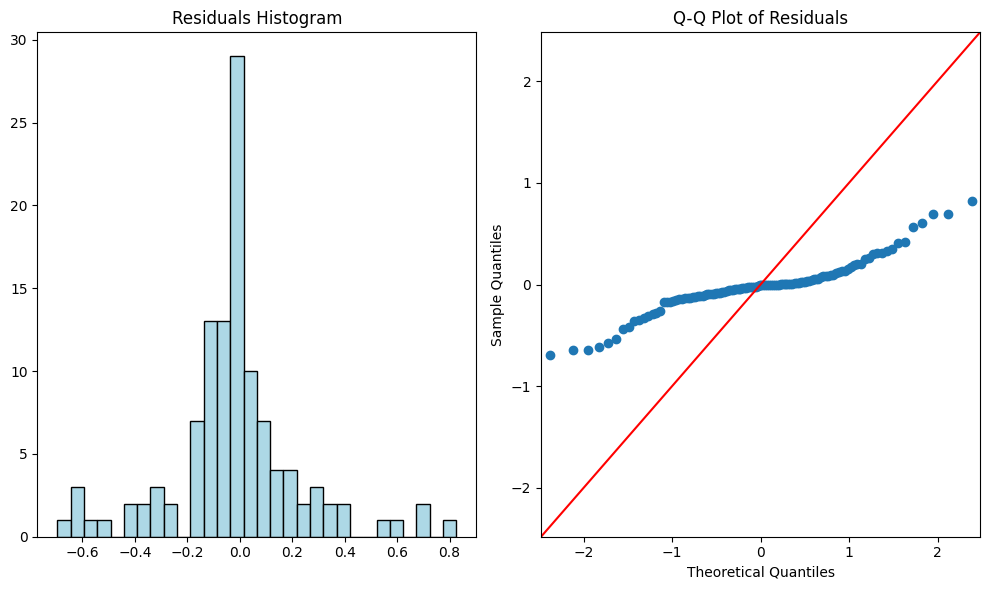

Fine-tuning SARIMA model for Staphylococcus aureus - Vancomycin
Applied Logarithmic transformation (log1p).
Best SARIMA model: (2, 0, 0, 0, 0, 0, 4)
                               SARIMAX Results                                
Dep. Variable:        Resistance_Rate   No. Observations:                  115
Model:               SARIMAX(2, 0, 0)   Log Likelihood                 140.821
Date:                Sun, 24 Nov 2024   AIC                           -275.641
Time:                        07:53:42   BIC                           -267.459
Sample:                    04-01-1996   HQIC                          -272.321
                         - 10-01-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6665      0.037    -18.061      0.000      -

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


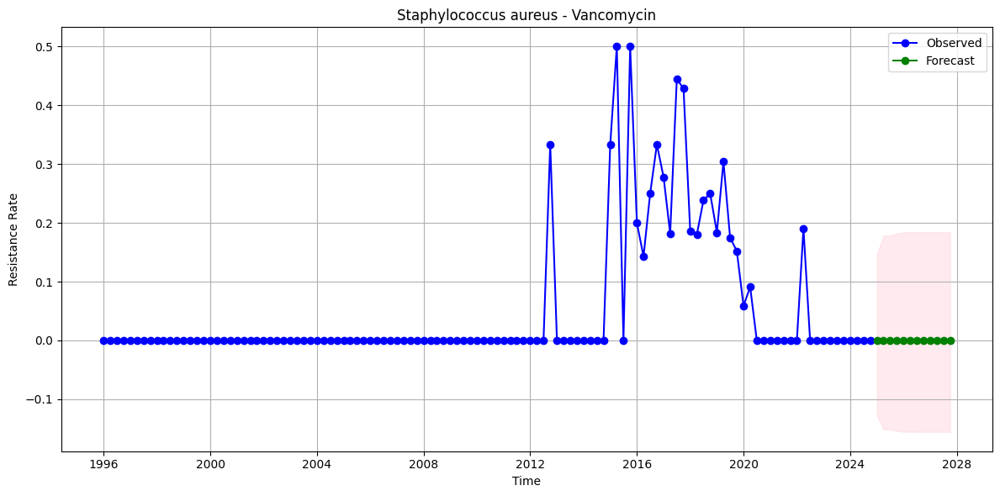

Ljung-Box Test (p-value) for lag 10: 0.03322353061318582
Jarque-Bera Test (p-value): 7.661497487909117e-84


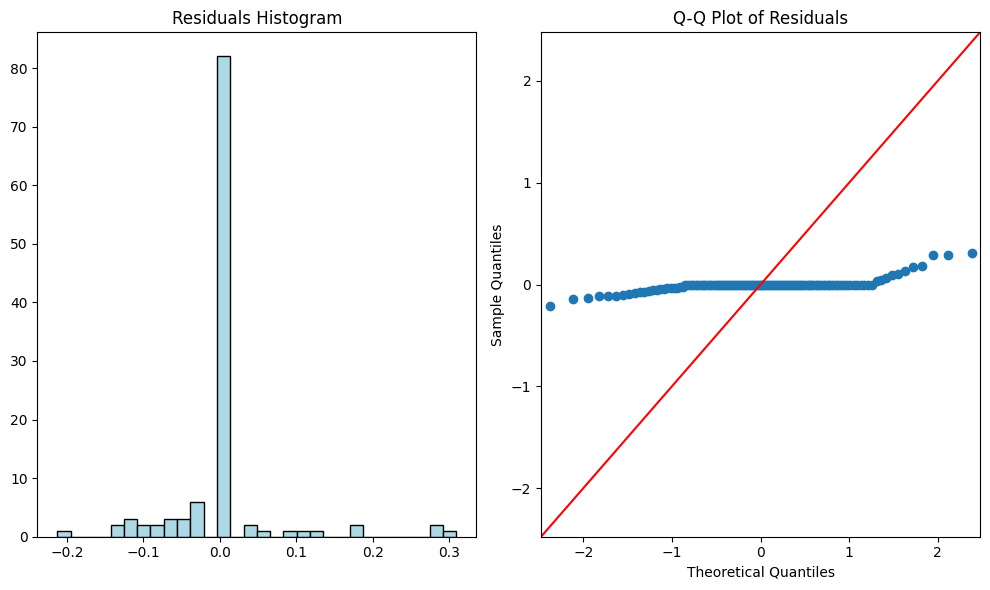

Fine-tuning SARIMA model for Staphylococcus aureus - Penicillin
Applied Logarithmic transformation (log1p).
Best SARIMA model: (0, 1, 2, 2, 0, 0, 12)
                                      SARIMAX Results                                      
Dep. Variable:                     Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(0, 1, 2)x(2, 0, [], 12)   Log Likelihood                  -4.316
Date:                             Sun, 24 Nov 2024   AIC                             18.631
Time:                                     07:55:08   BIC                             31.186
Sample:                                 01-01-1996   HQIC                            23.696
                                      - 10-01-2024                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------

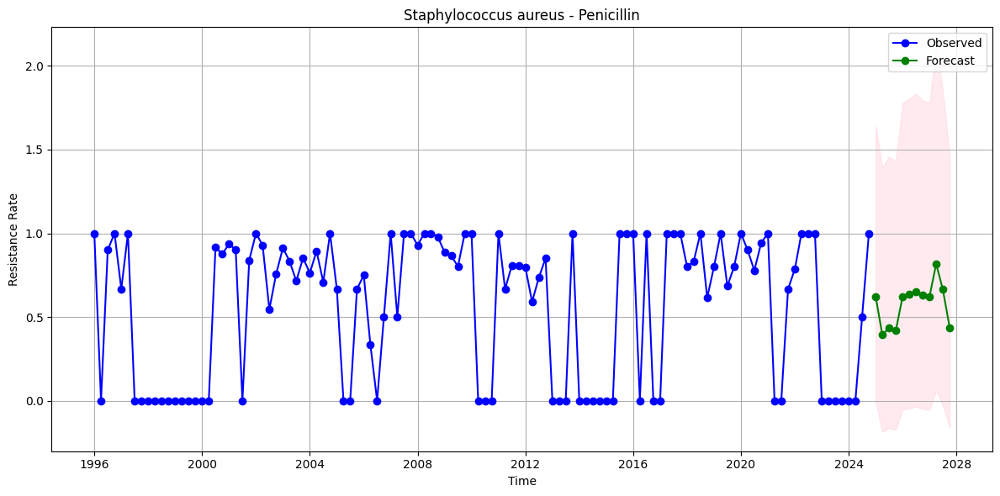

Ljung-Box Test (p-value) for lag 10: 0.47839007262391686
Jarque-Bera Test (p-value): 0.14617168901862498


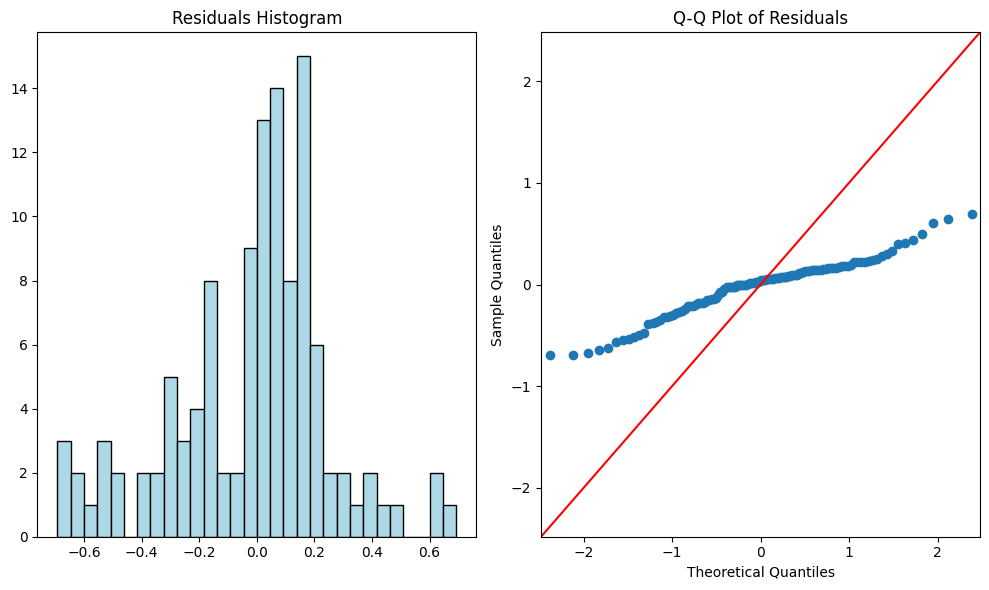

Fine-tuning SARIMA model for Staphylococcus aureus - Imipenem
Applied Logarithmic transformation (log1p).
Best SARIMA model: (1, 0, 0, 0, 0, 0, 4)
                               SARIMAX Results                                
Dep. Variable:        Resistance_Rate   No. Observations:                  116
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  95.678
Date:                Sun, 24 Nov 2024   AIC                           -187.355
Time:                        07:56:49   BIC                           -181.865
Sample:                    01-01-1996   HQIC                          -185.127
                         - 10-01-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4187      0.036     11.519      0.000       0.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:1431: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum


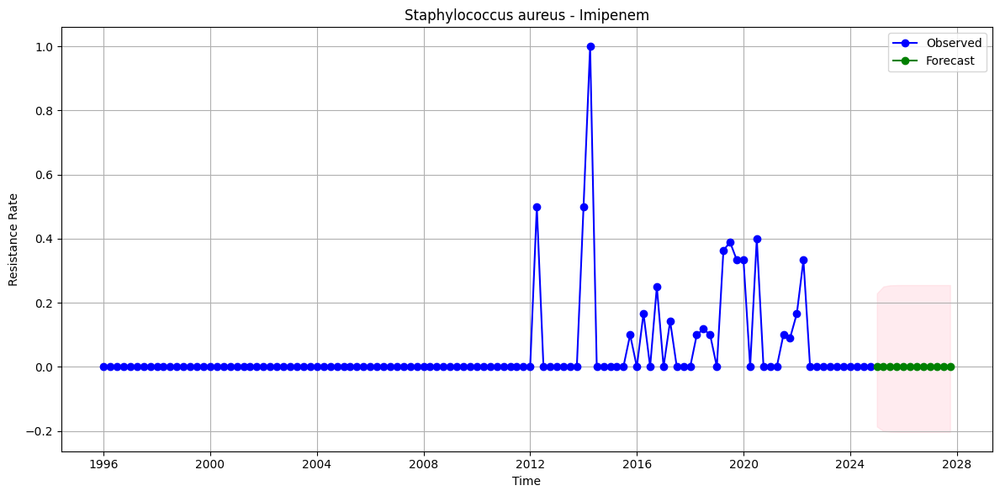

Ljung-Box Test (p-value) for lag 10: 0.1315291575291309
Jarque-Bera Test (p-value): 9.417611532797445e-89


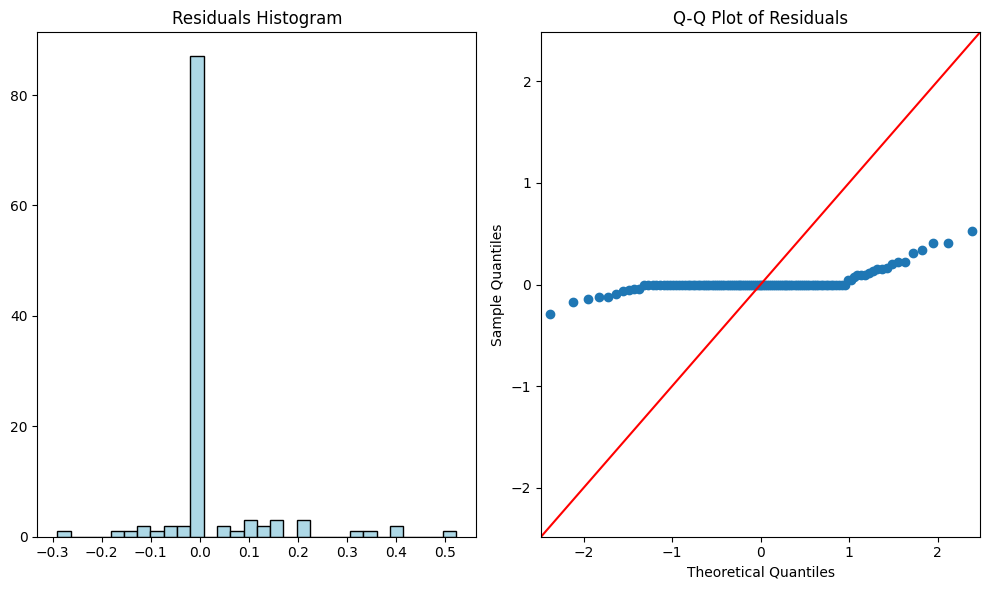

Fine-tuning SARIMA model for Staphylococcus aureus - Ceftadizime
Applied Logarithmic transformation (log1p).
Best SARIMA model: (0, 1, 1, 2, 0, 1, 4)
                                     SARIMAX Results                                     
Dep. Variable:                   Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(0, 1, 1)x(2, 0, 1, 4)   Log Likelihood                  19.336
Date:                           Sun, 24 Nov 2024   AIC                            -28.672
Time:                                   07:58:18   BIC                            -15.307
Sample:                               01-01-1996   HQIC                           -23.254
                                    - 10-01-2024                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------

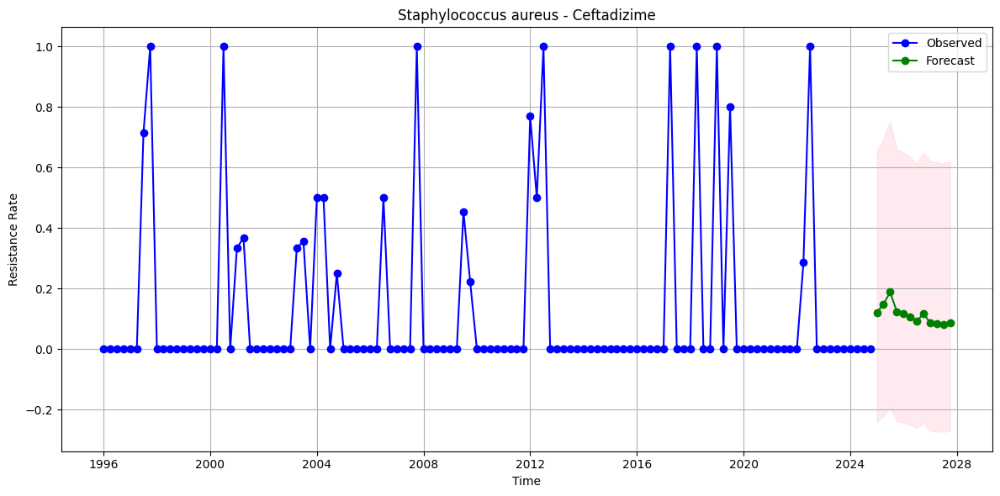

Ljung-Box Test (p-value) for lag 10: 0.4755004723957271
Jarque-Bera Test (p-value): 6.224882870105136e-13


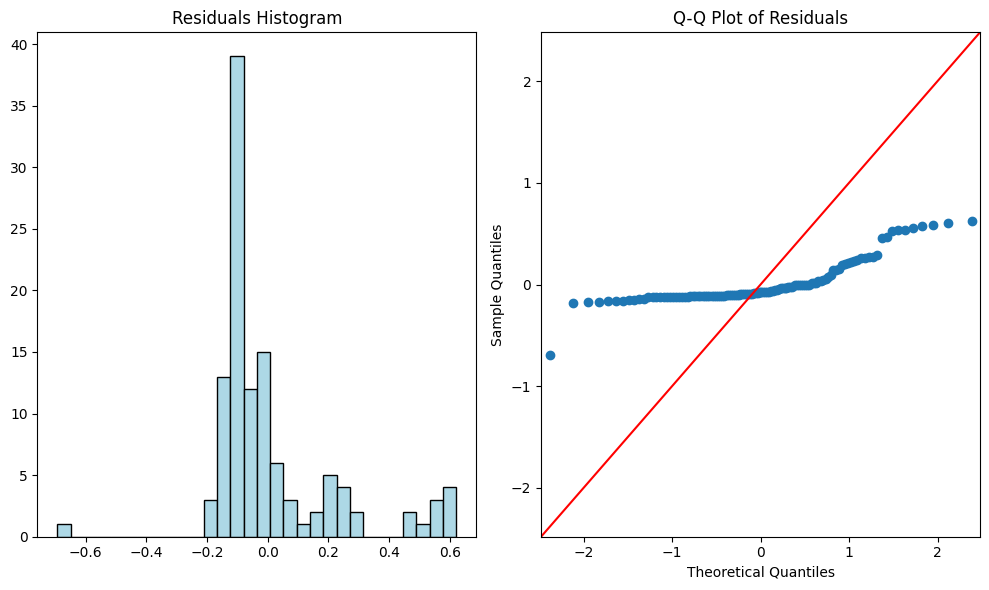

Fine-tuning SARIMA model for Staphylococcus aureus - Cefotaxime
Applied Logarithmic transformation (log1p).
Best SARIMA model: (2, 0, 0, 0, 0, 1, 12)
                                      SARIMAX Results                                       
Dep. Variable:                      Resistance_Rate   No. Observations:                  116
Model:             SARIMAX(2, 0, 0)x(0, 0, [1], 12)   Log Likelihood                  20.998
Date:                              Sun, 24 Nov 2024   AIC                            -33.996
Time:                                      07:59:42   BIC                            -23.457
Sample:                                  01-01-1996   HQIC                           -29.727
                                       - 10-01-2024                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
---------------------------

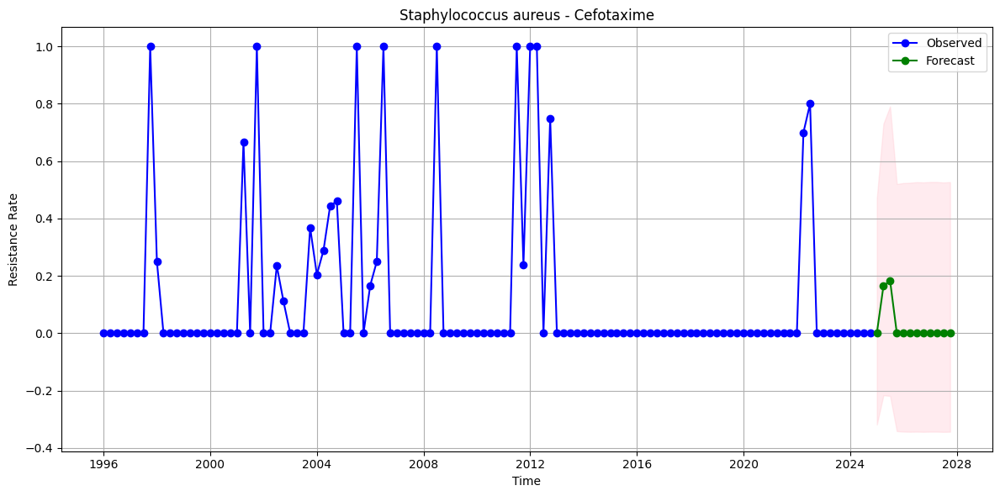

Ljung-Box Test (p-value) for lag 10: 0.6784153627090415
Jarque-Bera Test (p-value): 1.9831465856458515e-18


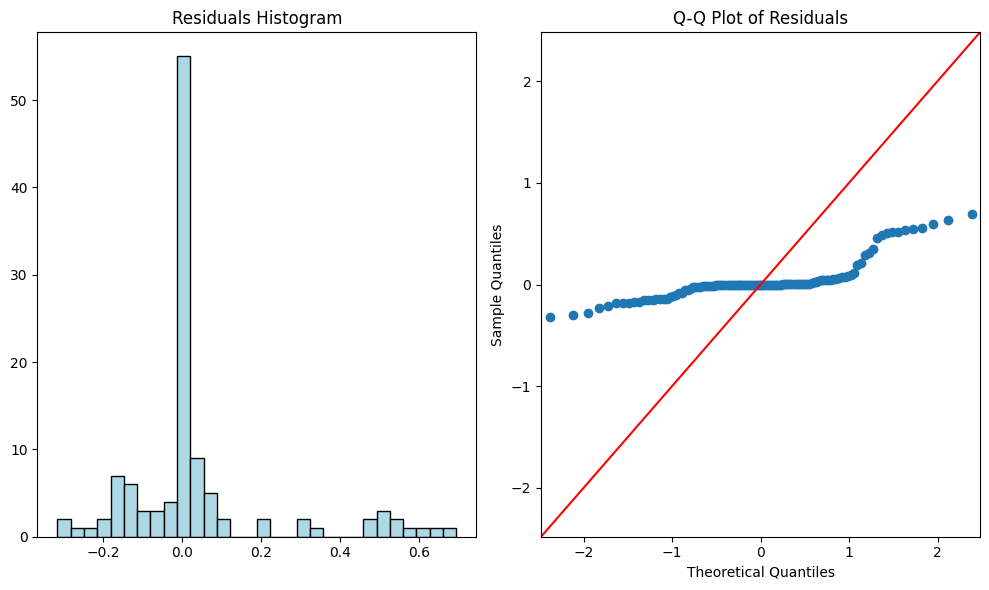

Fine-tuning SARIMA model for Staphylococcus aureus - Cefoxitin
Applied Logarithmic transformation (log1p).


In [ ]:
from itertools import product
from joblib import Parallel, delayed
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import boxcox
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.stattools import jarque_bera
from statsmodels.tsa.stattools import adfuller

# Function to check stationarity using the ADF test
def check_stationarity(series):
    result = adfuller(series)
    if result[1] > 0.05:
        return False  # Series is non-stationary
    return True  # Series is stationary

# Function to fit SARIMA model
def fit_sarima(series, p, d, q, P, D, Q, S):
    if not check_stationarity(series):
        series = series.diff().dropna()  # Differencing if series is non-stationary

    try:
        model = sm.tsa.statespace.SARIMAX(
            series,
            order=(p, d, q),
            seasonal_order=(P, D, Q, S),
            enforce_stationarity=False,
            enforce_invertibility=False,
            maxiter=1000  # Increase max iterations to help with convergence
        )
        results = model.fit(disp=False)
        return results
    except Exception as e:
        return None

# Grid search SARIMA with parallel processing
def grid_search_sarima(series, p_values, d_values, q_values, P_values, D_values, Q_values, S_values):
    best_score = float('inf')
    best_params = None
    best_model = None

    # Create a list of parameter combinations
    param_combinations = list(product(p_values, d_values, q_values, P_values, D_values, Q_values, S_values))

    # Parallelized grid search
    def evaluate_model(params):
        p, d, q, P, D, Q, S = params
        model = fit_sarima(series, p, d, q, P, D, Q, S)
        if model:
            aic = model.aic
            return aic, params, model
        return float('inf'), params, None  # Return high AIC if model fails

    # Perform grid search in parallel
    results = Parallel(n_jobs=-1)(delayed(evaluate_model)(params) for params in param_combinations)

    # Find the best model based on the lowest AIC
    for aic, params, model in results:
        if aic < best_score:
            best_score = aic
            best_params = params
            best_model = model

    return best_model, best_params

# Define possible values for each parameter
p_values = [0, 1, 2]
d_values = [0, 1]
q_values = [0, 1, 2]
P_values = [0, 1, 2]
D_values = [0, 1]
Q_values = [0, 1]
S_values = [4, 12]  # Seasonality: 4 for quarterly data, 12 for monthly data

# Evaluation storage
evaluation_results = []

# Assuming `time_series_dict` contains your time series data
for organism, antibiotic_data in time_series_dict.items():
    for antibiotic, series in antibiotic_data.items():
        print(f"Fine-tuning SARIMA model for {organism} - {antibiotic}")

        # Step 1: Transform Data (Box-Cox or log transformation)
        transformed_series = series.copy()
        lambda_value = None
        if series.min() > 0:
            transformed_series, lambda_value = boxcox(series)
            print(f"Applied Box-Cox transformation with λ = {lambda_value:.2f}")
        else:
            transformed_series = np.log1p(series)
            print("Applied Logarithmic transformation (log1p).")

        # Step 2: Grid search for best SARIMA parameters
        best_model, best_params = grid_search_sarima(transformed_series, p_values, d_values, q_values, P_values, D_values, Q_values, S_values)

        if best_model:
            print(f"Best SARIMA model: {best_params}")
            print(best_model.summary())

            # Step 3: Forecasting the next periods (12 periods ahead)
            forecast_periods = 12
            forecast = best_model.get_forecast(steps=forecast_periods)
            forecast_mean = forecast.predicted_mean
            forecast_ci = forecast.conf_int()

            # Inverse transformation (if Box-Cox was applied)
            if lambda_value is not None:
                forecast_mean = np.exp(forecast_mean) - 1
                forecast_ci = np.exp(forecast_ci) - 1
            else:
                forecast_mean = np.expm1(forecast_mean)
                forecast_ci = np.expm1(forecast_ci)

            # Plotting the forecast
            plt.figure(figsize=(12, 6))
            plt.plot(series, label='Observed', marker='o', color='blue')
            plt.plot(forecast_mean, label='Forecast', marker='o', color='green')
            plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink', alpha=0.3)
            plt.title(f"{organism} - {antibiotic}")
            plt.xlabel("Time")
            plt.ylabel("Resistance Rate")
            plt.legend()
            plt.tight_layout()
            plt.grid(True)
            plt.show()

            # Step 4: Model Evaluation
            observed = series.values[-len(forecast_mean):]
            forecast_mean = forecast_mean[:len(observed)]

            mae = mean_absolute_error(observed, forecast_mean)
            mse = mean_squared_error(observed, forecast_mean)
            r2 = r2_score(observed, forecast_mean)
            mape = np.mean(np.abs((observed - forecast_mean) / observed)) * 100

            evaluation_results.append({
                "Organism": organism,
                "Antibiotic": antibiotic,
                "Best Parameters": best_params,
                "MAE": mae,
                "MSE": mse,
                "R2": r2,
                "MAPE": mape,
            })

            # Residual Diagnostics
            residuals = best_model.resid
            lb_test = acorr_ljungbox(residuals, lags=[10], return_df=True)
            print(f"Ljung-Box Test (p-value) for lag 10: {lb_test['lb_pvalue'].iloc[0]}")
            jb_test = jarque_bera(residuals)
            print(f"Jarque-Bera Test (p-value): {jb_test[1]}")

            plt.figure(figsize=(10, 6))
            plt.subplot(1, 2, 1)
            plt.hist(residuals, bins=30, color='lightblue', edgecolor='black')
            plt.title('Residuals Histogram')
            plt.subplot(1, 2, 2)
            sm.qqplot(residuals, line='45', ax=plt.gca())
            plt.title('Q-Q Plot of Residuals')
            plt.tight_layout()
            plt.show()

# Convert evaluation results to DataFrame
evaluation_df = pd.DataFrame(evaluation_results)
print(evaluation_df)


In [ ]:
from itertools import product
from joblib import Parallel, delayed
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import boxcox
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.stattools import jarque_bera
from statsmodels.tsa.stattools import adfuller

# Function to check stationarity using the ADF test
def check_stationarity(series):
    result = adfuller(series)
    if result[1] > 0.05:
        return False  # Series is non-stationary
    return True  # Series is stationary

# Function to fit SARIMA model
def fit_sarima(series, p, d, q, P, D, Q, S):
    if not check_stationarity(series):
        series = series.diff().dropna()  # Differencing if series is non-stationary

    try:
        model = sm.tsa.statespace.SARIMAX(
            series,
            order=(p, d, q),
            seasonal_order=(P, D, Q, S),
            enforce_stationarity=False,
            enforce_invertibility=False,
            maxiter=1000  # Increase max iterations to help with convergence
        )
        results = model.fit(disp=False)
        return results
    except Exception as e:
        return None

# Grid search SARIMA with parallel processing
def grid_search_sarima(series, p_values, d_values, q_values, P_values, D_values, Q_values, S_values):
    best_score = float('inf')
    best_params = None
    best_model = None

    # Create a list of parameter combinations
    param_combinations = list(product(p_values, d_values, q_values, P_values, D_values, Q_values, S_values))

    # Parallelized grid search
    def evaluate_model(params):
        p, d, q, P, D, Q, S = params
        model = fit_sarima(series, p, d, q, P, D, Q, S)
        if model:
            aic = model.aic
            return aic, params, model
        return float('inf'), params, None  # Return high AIC if model fails

    # Perform grid search in parallel
    results = Parallel(n_jobs=-1)(delayed(evaluate_model)(params) for params in param_combinations)

    # Find the best model based on the lowest AIC
    for aic, params, model in results:
        if aic < best_score:
            best_score = aic
            best_params = params
            best_model = model

    return best_model, best_params

# Define possible values for each parameter
p_values = [0, 1, 2]
d_values = [0, 1]
q_values = [0, 1, 2]
P_values = [0, 1, 2]  # Added more options for seasonal AR
D_values = [0, 1]
Q_values = [0, 1, 2]  # Added more options for seasonal MA
S_values = [4, 12]  # Seasonality: 4 for quarterly data, 12 for monthly data

# Evaluation storage
evaluation_results = []

# Assuming `time_series_dict` contains your time series data
for organism, antibiotic_data in time_series_dict.items():
    for antibiotic, series in antibiotic_data.items():
        print(f"Fine-tuning SARIMA model for {organism} - {antibiotic}")

        # Step 1: Transform Data (Box-Cox or log transformation)
        transformed_series = series.copy()
        lambda_value = None
        if series.min() > 0:
            transformed_series, lambda_value = boxcox(series)
            print(f"Applied Box-Cox transformation with λ = {lambda_value:.2f}")
        else:
            transformed_series = np.log1p(series)
            print("Applied Logarithmic transformation (log1p).")

        # Step 2: Grid search for best SARIMA parameters
        best_model, best_params = grid_search_sarima(transformed_series, p_values, d_values, q_values, P_values, D_values, Q_values, S_values)

        if best_model:
            print(f"Best SARIMA model: {best_params}")
            print(best_model.summary())

            # Step 3: Forecasting the next periods (12 periods ahead)
            forecast_periods = 12
            forecast = best_model.get_forecast(steps=forecast_periods)
            forecast_mean = forecast.predicted_mean
            forecast_ci = forecast.conf_int()

            # Inverse transformation (if Box-Cox was applied)
            if lambda_value is not None:
                forecast_mean = np.exp(forecast_mean) - 1
                forecast_ci = np.exp(forecast_ci) - 1
            else:
                forecast_mean = np.expm1(forecast_mean)
                forecast_ci = np.expm1(forecast_ci)

            # Plotting the forecast
            plt.figure(figsize=(12, 6))
            plt.plot(series, label='Observed', marker='o', color='blue')
            plt.plot(forecast_mean, label='Forecast', marker='o', color='green')
            plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink', alpha=0.3)
            plt.title(f"{organism} - {antibiotic}")
            plt.xlabel("Time")
            plt.ylabel("Resistance Rate")
            plt.legend()
            plt.tight_layout()
            plt.grid(True)
            plt.show()

            # Step 4: Model Evaluation
            observed = series.values[-len(forecast_mean):]
            forecast_mean = forecast_mean[:len(observed)]

            mae = mean_absolute_error(observed, forecast_mean)
            mse = mean_squared_error(observed, forecast_mean)
            r2 = r2_score(observed, forecast_mean)
            mape = np.mean(np.abs((observed - forecast_mean) / observed)) * 100

            evaluation_results.append({
                "Organism": organism,
                "Antibiotic": antibiotic,
                "Best Parameters": best_params,
                "MAE": mae,
                "MSE": mse,
                "R2": r2,
                "MAPE": mape,
            })

            # Residual Diagnostics
            residuals = best_model.resid
            lb_test = acorr_ljungbox(residuals, lags=[10], return_df=True)
            print(f"Ljung-Box Test (p-value) for lag 10: {lb_test['lb_pvalue'].iloc[0]}")
            jb_test = jarque_bera(residuals)
            print(f"Jarque-Bera Test (p-value): {jb_test[1]}")

            plt.figure(figsize=(10, 6))
            plt.subplot(1, 2, 1)
            plt.hist(residuals, bins=30, color='lightblue', edgecolor='black')
            plt.title('Residuals Histogram')
            plt.subplot(1, 2, 2)
            sm.qqplot(residuals, line='45', ax=plt.gca())
            plt.title('Q-Q Plot of Residuals')
            plt.tight_layout()
            plt.show()

# Convert evaluation results to DataFrame
evaluation_df = pd.DataFrame(evaluation_results)
print(evaluation_df)
